# Vincristine-Induced Peripheral Neuropathy

In [1]:
#conda install -c anaconda py-xgboost
#conda update -n base -c defaults conda
#conda install -c conda-forge lightgbm
#pip install missingpy

# Library

In [2]:
import pandas as pd
import numpy as np
import xgboost as xgb
#import lightgbm as lgbm
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.gaussian_process import GaussianProcessClassifier
#from missingpy import KNNImputer, MissForest
%matplotlib notebook
from matplotlib import pyplot as plt
import seaborn as sns
import sklearn
from sklearn.metrics import auc
from sklearn.metrics import plot_roc_curve
from sklearn.model_selection import StratifiedKFold
sklearn.__version__
from sklearn.metrics import confusion_matrix
#from mlxtend.plotting import plot_confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.feature_selection import chi2
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.datasets import make_regression
from matplotlib import pyplot as plt
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot as pltr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale
from sklearn.linear_model import Lasso, LassoCV, Ridge, RidgeCV
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 400)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', -1)

In [3]:
pd.__version__

'1.2.4'

In [4]:
#missing_values = ["n/a", "na", "--", "NaN"]
missing_values = ["n/a", "na", "--"]

# Import Dataset

In [7]:
path_to_dataset = path_to_dataset = "/Users/benjamin/Desktop/VIPN.csv"

In [8]:
data = pd.read_csv(path_to_dataset, na_values = missing_values)

# Assess Missing Data

In [7]:
conda install -c conda-forge/label/gcc7 missingno

Solving environment: done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


<AxesSubplot:>

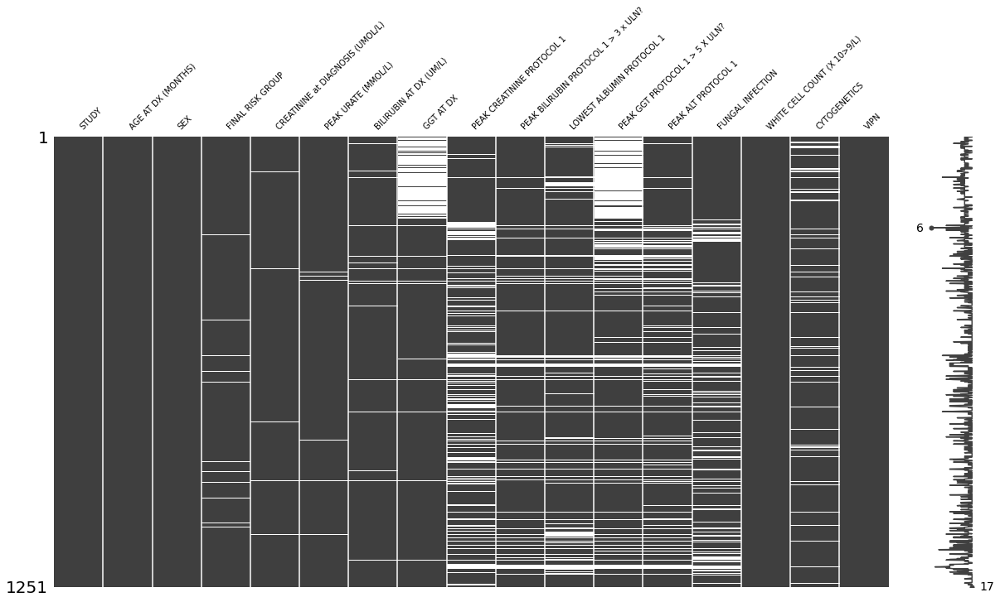

In [8]:
import missingno as msno
%matplotlib inline
msno.matrix(data, figsize=(20, 10), fontsize=10)

<AxesSubplot:>

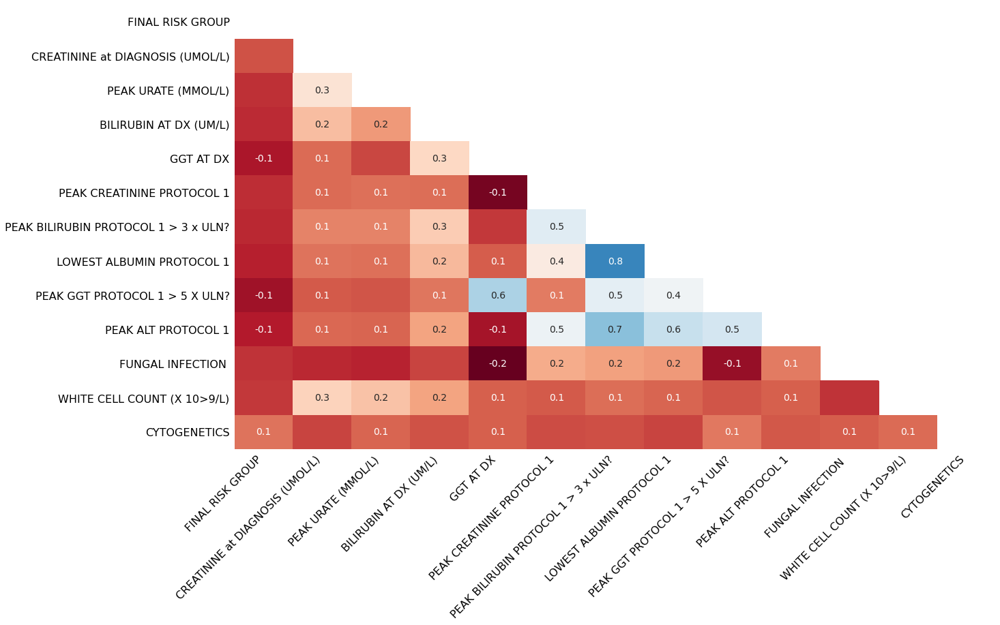

In [9]:
# Visualize the correlation between the number of 
# missing values in different columns as a heatmap 
msno.heatmap(data)

# View Data and Dimensions

In [7]:
%matplotlib inline
peek = data.head(5)
peek

,STUDY,AGE AT DX (MONTHS),SEX,FINAL RISK GROUP,CREATININE at DIAGNOSIS (UMOL/L),PEAK URATE (MMOL/L),BILIRUBIN AT DX (UM/L),GGT AT DX,PEAK CREATININE PROTOCOL 1,PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN?,LOWEST ALBUMIN PROTOCOL 1,PEAK GGT PROTOCOL 1 > 5 X ULN?,PEAK ALT PROTOCOL 1,FUNGAL INFECTION,WHITE CELL COUNT (X 10>9/L),CYTOGENETICS,VIPN
0,COG,50,MALE,SR,0.039,0.18,16.0,NaN,41.0,NO,42.0,NaN,119,NO,6.60,NORMAL,NO
1,COG,104,FEMALE,VHR,51.000,0.23,7.0,27.0,51.0,NO,16.0,YES,924,YES,0.90,HYPODIPLOIDY,NO
2,COG,194,MALE,VHR,70.000,0.44,11.0,NaN,78.0,NO,17.0,NO,120,NO,2.35,HYPODIPLOIDY,NO
3,COG,159,MALE,HR,0.082,0.26,5.0,NaN,162.0,NO,15.0,NaN,131,NO,1.20,TRISOMY21,NO
4,COG,64,MALE,SR,0.038,0.35,8.0,NaN,380.0,NO,34.0,NaN,22,NO,29.90,ETV6RUNX1,NO


In [8]:
shape = data.shape
print('Dimension: ', shape)

Dimension:  (1251, 17)


# Descriptive Statistics

In [9]:
data.describe()

,AGE AT DX (MONTHS),CREATININE at DIAGNOSIS (UMOL/L),PEAK URATE (MMOL/L),BILIRUBIN AT DX (UM/L),GGT AT DX,PEAK CREATININE PROTOCOL 1,LOWEST ALBUMIN PROTOCOL 1,WHITE CELL COUNT (X 10>9/L)
count,1251.000000,1238.000000,1234.000000,1219.00000,1040.000000,978.000000,1073.000000,1250.000000
mean,76.787370,43.051863,0.339627,8.59475,24.619231,62.076687,25.542404,39.839792
std,50.260851,28.480537,0.186274,7.24800,38.230661,44.688175,5.692388,94.665131
min,9.000000,0.016000,0.020000,1.00000,3.000000,21.000000,10.000000,0.300000
25%,38.000000,31.000000,0.230000,5.00000,11.000000,42.000000,22.000000,4.300000
50%,59.000000,40.000000,0.300000,7.00000,14.000000,52.000000,26.000000,9.700000
75%,108.000000,55.000000,0.390000,10.00000,23.000000,67.000000,29.000000,28.275000
max,227.000000,630.000000,2.380000,116.00000,580.000000,630.000000,44.000000,1065.600000


# Asess Dataset

In [10]:
df=data

In [11]:
for i, it in enumerate(df.dtypes):
    print(i, ' => ', it)

0  =>  object
1  =>  int64
2  =>  object
3  =>  object
4  =>  float64
5  =>  float64
6  =>  float64
7  =>  float64
8  =>  float64
9  =>  object
10  =>  float64
11  =>  object
12  =>  object
13  =>  object
14  =>  float64
15  =>  object
16  =>  object


# Variables and Categorical Encoding 

In [12]:
print("Feature names:")
for i, col in enumerate(df.columns):
    print(i, ' => ', col)

Feature names:
0  =>  STUDY
1  =>  AGE AT DX (MONTHS)
2  =>  SEX
3  =>  FINAL RISK GROUP
4  =>  CREATININE at DIAGNOSIS (UMOL/L)
5  =>  PEAK URATE (MMOL/L)
6  =>  BILIRUBIN AT DX (UM/L)
7  =>  GGT AT DX
8  =>  PEAK CREATININE PROTOCOL 1
9  =>  PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN?
10  =>  LOWEST ALBUMIN PROTOCOL 1
11  =>  PEAK GGT PROTOCOL 1 > 5 X ULN?
12  =>  PEAK ALT PROTOCOL 1
13  =>  FUNGAL INFECTION 
14  =>  WHITE CELL COUNT (X 10>9/L)
15  =>  CYTOGENETICS
16  =>  VIPN


In [13]:
# Categorical boolean mask
categorical_feature_mask = df.dtypes==object

# filter categorical columns using mask and turn it into a list
categorical_cols = df.columns[categorical_feature_mask].tolist()

from sklearn.preprocessing import LabelEncoder

print(categorical_cols)

['STUDY', 'SEX', 'FINAL RISK GROUP', 'PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN?', 'PEAK GGT PROTOCOL 1 > 5 X ULN?', 'PEAK ALT PROTOCOL 1', 'FUNGAL INFECTION ', 'CYTOGENETICS', 'VIPN']


In [14]:
df[categorical_cols].head(5)

,STUDY,SEX,FINAL RISK GROUP,PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN?,PEAK GGT PROTOCOL 1 > 5 X ULN?,PEAK ALT PROTOCOL 1,FUNGAL INFECTION,CYTOGENETICS,VIPN
0,COG,MALE,SR,NO,NaN,119,NO,NORMAL,NO
1,COG,FEMALE,VHR,NO,YES,924,YES,HYPODIPLOIDY,NO
2,COG,MALE,VHR,NO,NO,120,NO,HYPODIPLOIDY,NO
3,COG,MALE,HR,NO,NaN,131,NO,TRISOMY21,NO
4,COG,MALE,SR,NO,NaN,22,NO,ETV6RUNX1,NO


In [15]:
def categorical_feature_encoder(df, cat_features):
    _df = df.copy()
    lbEncoder = LabelEncoder()
    for col in cat_features:
        # Not NaN index
        idx = ~_df[col].isna()
        _df.loc[idx, col] = lbEncoder.fit(_df.loc[idx, col]).transform(_df.loc[idx, col])
        
    return _df

In [16]:
# apply label encoding on categorical feature columns
df = categorical_feature_encoder(df, categorical_cols)

df.head(5)

,STUDY,AGE AT DX (MONTHS),SEX,FINAL RISK GROUP,CREATININE at DIAGNOSIS (UMOL/L),PEAK URATE (MMOL/L),BILIRUBIN AT DX (UM/L),GGT AT DX,PEAK CREATININE PROTOCOL 1,PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN?,LOWEST ALBUMIN PROTOCOL 1,PEAK GGT PROTOCOL 1 > 5 X ULN?,PEAK ALT PROTOCOL 1,FUNGAL INFECTION,WHITE CELL COUNT (X 10>9/L),CYTOGENETICS,VIPN
0,1,50,1,3,0.039,0.18,16.0,NaN,41.0,0,42.0,NaN,28,0,6.60,7,0
1,1,104,0,5,51.000,0.23,7.0,27.0,51.0,0,16.0,1,449,1,0.90,5,0
2,1,194,1,5,70.000,0.44,11.0,NaN,78.0,0,17.0,0,29,0,2.35,5,0
3,1,159,1,0,0.082,0.26,5.0,NaN,162.0,0,15.0,NaN,42,0,1.20,10,0
4,1,64,1,3,0.038,0.35,8.0,NaN,380.0,0,34.0,NaN,138,0,29.90,2,0


# Assess Array, Dimensions, and Indexing 

In [17]:
y = df.iloc[:, -1].values
y = y.astype(np.int)
y

array([0, 0, 0, ..., 0, 0, 0])

In [18]:
print(y.shape)

(1251,)


In [19]:
X = df.iloc[:, 0:-1].values
X = X.astype(np.float64)
print('Dimension: ', X.shape)
X[0:5, 143:147]

Dimension:  (1251, 16)


array([], shape=(5, 0), dtype=float64)

In [20]:
X

array([[  1.  ,  50.  ,   1.  , ...,   0.  ,   6.6 ,   7.  ],
       [  1.  , 104.  ,   0.  , ...,   1.  ,   0.9 ,   5.  ],
       [  1.  , 194.  ,   1.  , ...,   0.  ,   2.35,   5.  ],
       ...,
       [  0.  , 141.  ,   0.  , ...,   0.  ,  21.8 ,   3.  ],
       [  0.  ,  65.  ,   0.  , ...,   0.  ,   3.39,   3.  ],
       [  0.  ,  93.  ,   0.  , ...,   0.  ,   3.57,   2.  ]])

# Target Data Asessment 

In [21]:
pd.value_counts(df['VIPN'].values, sort=False)

0    1198
1    53  
dtype: int64

<IPython.core.display.Javascript object>


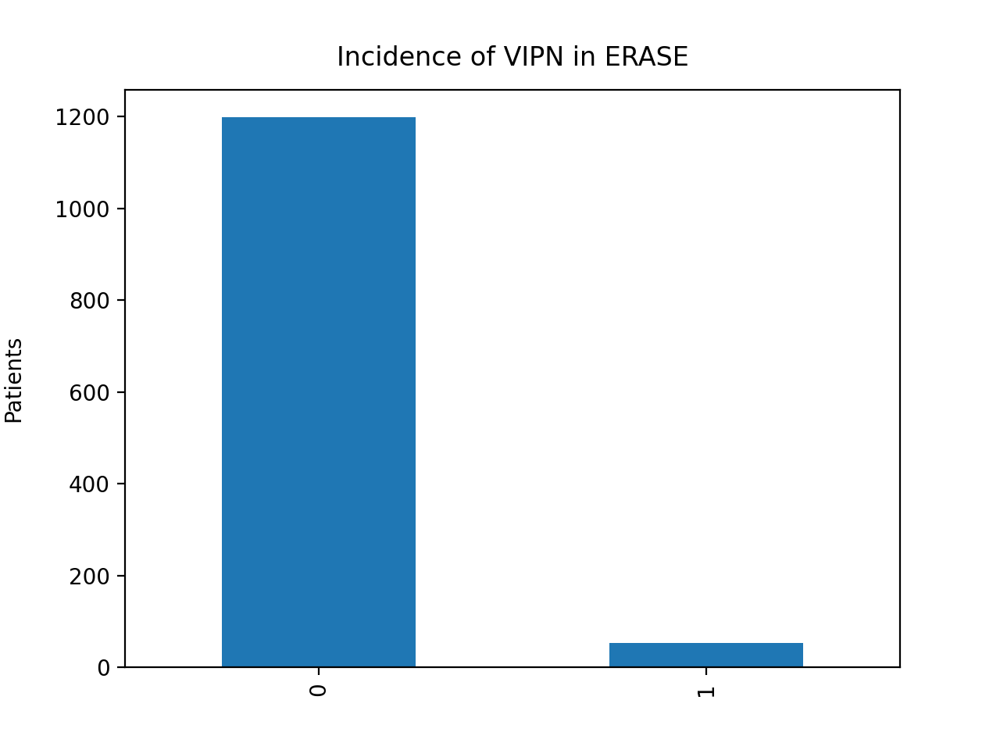

In [22]:
#Plot incidence 
ax = df['VIPN'].value_counts().plot(kind='bar')
plt.ylabel("Patients", labelpad=14)
plt.title("Incidence of VIPN in ERASE", y=1.02);
plt.show()

# Precosessing: Standardisation, Imputation, Resampling, and Metrics 


In [23]:
cat_features = np.nonzero(categorical_feature_mask.values[0:-1])[0]
print(cat_features)
num_features = np.nonzero(~categorical_feature_mask.values[0:-1])[0]
print(num_features)
#conda install -c conda-forge imbalanced-learn

[ 0  2  3  9 11 12 13 15]
[ 1  4  5  6  7  8 10 14]


In [30]:
#standardise data
#imputation mean for numerical, mode for categorical  
def standar_scaler(Xtr, Xtest, index_numeric_features):
    """
    Only doing standarization for numeric features
    """
    Xtr_z = Xtr.copy()
    Xtest_z = Xtest.copy()
    mean = np.nanmean(Xtr_z[:, index_numeric_features], axis=0)
    std = np.nanstd(Xtr_z[:, index_numeric_features], axis=0)
    Xtr_z[:, index_numeric_features] = (Xtr[:, index_numeric_features] - mean)/std 
    Xtest_z[:, index_numeric_features]  = (Xtest[:, index_numeric_features] - mean)/std
    
    return (Xtr_z, Xtest_z)

from scipy.stats import mode
def data_imputation(Xtr, Xtest, index_cat_features, index_numeric_features):
    """
        Categorical features: using most frequent values for missing features
        Numerical features: using mean values for missing features
    """
    Xtr_ = Xtr.copy()
    Xtest_ = Xtest.copy()
    mean_vals = np.nanmean(Xtr[:, index_numeric_features], axis=0)
    mean_vals = np.where(np.isnan(mean_vals), 0, mean_vals)
    most_freq_values = mode(Xtr[:, index_cat_features], 0)[0][0]
    most_freq_values = np.where(np.isnan(most_freq_values), 0, most_freq_values)
    # replace missing values in training set
    Xtr_[:, index_numeric_features] = np.where(np.isnan(Xtr_[:, index_numeric_features]), mean_vals, Xtr_[:, index_numeric_features])
    Xtr_[:, index_cat_features] = np.where(np.isnan(Xtr_[:, index_cat_features]), most_freq_values, Xtr_[:, index_cat_features])
    
    # replace missing values in testing set
    Xtest_[:, index_numeric_features] = np.where(np.isnan(Xtest_[:, index_numeric_features]), mean_vals, Xtest_[:, index_numeric_features])
    Xtest_[:, index_cat_features] = np.where(np.isnan(Xtest_[:, index_cat_features]), most_freq_values, Xtest_[:, index_cat_features])
    
    return (Xtr_, Xtest_)

#cross validation 
num_split_validation = 10 

#Resampling techniques

from imblearn.over_sampling import RandomOverSampler, SMOTE, BorderlineSMOTE
from imblearn.under_sampling import RandomUnderSampler
#Fit model
def model_training_and_evaluation(model, X, y, is_imputation=False, num_features=None, cat_features=None, random_state=0, is_sampling=True):
    """
        cat_features and num_features are array-like containing indices of columns with categorical and numeric features
        
        Return average, min, and max values of accuracy and f1-measure scores
    """
    #statified k-fold fold to mainatin proportions per fold validation traing and split
    skf = StratifiedKFold(n_splits=num_split_validation, random_state=random_state, shuffle=True)
    f1_scores_ls = []
    accuracy_score_ls = []
    for train_index, test_index in skf.split(X, y):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        
        # Feature scaling
        X_train, X_test = standar_scaler(X_train, X_test, num_features)
        
        if is_imputation:
            X_train, X_test = data_imputation(X_train, X_test, cat_features, num_features)
        
        if is_sampling:
            #ros = RandomOverSampler(random_state=random_state)
            #ros = BorderlineSMOTE(random_state=random_state, k_neighbors=5)
            #ros = SMOTE(random_state=random_state)
            #X_train, y_train = ros.fit_resample(X_train, y_train)
        
        # Training model
        
            model.fit(X_train, y_train)
        
        # get prediction with scoring 
        try:
            y_pred = model.predict(X_test)
            # compute scores
            # class 1 is positive class, which is the class with a smaller number of samples
            f1 = f1_score(y_test, y_pred, pos_label=0)
            acc = accuracy_score(y_test, y_pred)

            f1_scores_ls.append(f1)
            accuracy_score_ls.append(acc)
        except Exception as ex:
            print('NaN value: ', np.where(np.isnan(X_test)))
            print('Min value: ', np.min(X_test))
            print('Max value: ', np.max(X_test))
            print(ex)
        
    avg_acc = sum(accuracy_score_ls) / len(accuracy_score_ls)
    min_acc = min(accuracy_score_ls)
    max_acc = max(accuracy_score_ls)
    
    avg_f1 = sum(f1_scores_ls) / len(f1_scores_ls)
    min_f1 = min(f1_scores_ls)
    max_f1 = max(f1_scores_ls)
    
    return (avg_acc, min_acc, max_acc, avg_f1, min_f1, max_f1)

In [25]:
#confirm standardisation and size of categorical vs numerical features
cat_features = categorical_feature_mask.values[0:-1] 
print(cat_features.size)
num_features = ~cat_features
print(num_features.size)

16
16


In [26]:
#Confirm version and set random state
#conda install scikit-learn=0.23.1
# define a random state variable
rd_state = 10

In [27]:
#Confirm number of categorical features and total variables
cat_features = categorical_feature_mask.values[0:-1] 
print(cat_features.size)
num_features = ~cat_features
print(num_features.size)

16
16


# Univariate Regression 

In [28]:
X_1 = np.nan_to_num(X)
X_1 

array([[  1.  ,  50.  ,   1.  , ...,   0.  ,   6.6 ,   7.  ],
       [  1.  , 104.  ,   0.  , ...,   1.  ,   0.9 ,   5.  ],
       [  1.  , 194.  ,   1.  , ...,   0.  ,   2.35,   5.  ],
       ...,
       [  0.  , 141.  ,   0.  , ...,   0.  ,  21.8 ,   3.  ],
       [  0.  ,  65.  ,   0.  , ...,   0.  ,   3.39,   3.  ],
       [  0.  ,  93.  ,   0.  , ...,   0.  ,   3.57,   2.  ]])

In [29]:
# Create linear regression object Univariate

regr = linear_model.LinearRegression()

# Training and Evaluation 

In [30]:
def show_important_features(model, X, y, is_imputation=True, num_features=None, cat_features=None, random_state=10, is_sampling=True):
    """
        Show confusion matrix for each run on each fold
    """
    skf = StratifiedKFold(n_splits=num_split_validation, random_state=random_state, shuffle=False)
    loop = 1
    imp_score = []
    for train_index, test_index in skf.split(X, y):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        
        # Feature scaling
        X_train, X_test = standar_scaler(X_train, X_test, num_features)
        
        if is_imputation:
            X_train, X_test = data_imputation(X_train, X_test, cat_features, num_features)
        
        if is_sampling:
            #ros = RandomOverSampler(random_state=random_state)
            #ros = BorderlineSMOTE(random_state=random_state, k_neighbors=5)
            #ros = SMOTE(random_state=random_state)
            #X_train, y_train = ros.fit_resample(X_train, y_train)
        #X_train = X_train[~X_train.isin([np.nan, np.inf, -np.inf]).any(1)]
        # Training model
            model.fit(X_train, y_train)
        
        imp_scr = np.abs(regr.coef_)
        if loop == 1:
            imp_score = imp_scr
        else:
            imp_score = imp_score + imp_scr
            
        loop = loop + 1
    
    imp_score = imp_score / num_split_validation # get average score
    print(imp_score)
    # Find index of features with score larger than 0
    sorted_id = np.argsort(imp_score)[::-1]
    print(sorted_id)
    sorted_idfeatures = sorted_id[imp_score[sorted_id] > 0]
    print(sorted_idfeatures.shape)
    print('No. of important features = ', len(sorted_idfeatures))
    feature_names = df.columns[sorted_idfeatures].values
    print("Feature name : important score")
    for i, it in enumerate(sorted_idfeatures):
        print(feature_names[i], " : ", imp_score[it])
        
    return (X_train,X_test,y_train,y_test)



#X_train,X_test,y_train,y_test = show_important_features(regr, X, y, is_imputation=True, num_features=None, cat_features=None, random_state=0, is_sampling=True)


# Feature Ranking and ROC AUC Analysis 

In [31]:
X_train,X_test,y_train,y_test = show_important_features(regr, X, y, is_imputation=True, num_features=None, cat_features=None, random_state=10, is_sampling=True)

[0.01840219 0.00464482 0.00491961 0.00160727 0.00115407 0.00250765
 0.00469795 0.00646004 0.0107407  0.01273933 0.00817506 0.01808561
 0.00783051 0.00208042 0.00172563 0.00521235]
[ 0 11  9  8 10 12  7 15  2  6  1  5 13 14  3  4]
(16,)
No. of important features =  16
Feature name : important score
STUDY  :  0.01840218777153617
PEAK GGT PROTOCOL 1 > 5 X ULN?  :  0.01808561013022059
PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN?  :  0.012739330926722223
PEAK CREATININE PROTOCOL 1  :  0.010740696184621255
LOWEST ALBUMIN PROTOCOL 1  :  0.008175062632309358
PEAK ALT PROTOCOL 1  :  0.00783051216284957
GGT AT DX  :  0.0064600401295474815
CYTOGENETICS  :  0.005212349374507343
SEX  :  0.0049196145675235265
BILIRUBIN AT DX (UM/L)  :  0.00469794539750132
AGE AT DX (MONTHS)  :  0.004644823226888131
PEAK URATE (MMOL/L)  :  0.002507647706960838
FUNGAL INFECTION   :  0.0020804241355308587
WHITE CELL COUNT (X 10>9/L)  :  0.0017256250210525563
FINAL RISK GROUP  :  0.0016072675358726357
CREATININE at DIAGNOSIS (U

In [32]:
print(regr.coef_)

[-0.02049143  0.00505897  0.00654927 -0.00071992 -0.00069197  0.00204679
  0.00286926 -0.00076357 -0.00986347 -0.01536373 -0.00754615  0.02000734
  0.00812072  0.00083603 -0.00206172  0.00578041]


In [33]:
##Retrieving column names from original data frame
feature_list = list(df.columns.values)
##getting rid of the Neurotoxity (y)
feature_list.pop()
 
coef_feat = {'features' : feature_list, 'regr.coef_' : regr.coef_}
#also tried: coef_feat = {'features' : feature_list, 'regr.coef_' : regr.coef_[0]} but coeficents all same?
coef_feat_regr = pd.DataFrame(data = coef_feat )
print(coef_feat_regr) 

                                features  regr.coef_
0   STUDY                                -0.020491  
1   AGE AT DX (MONTHS)                    0.005059  
2   SEX                                   0.006549  
3   FINAL RISK GROUP                     -0.000720  
4   CREATININE at DIAGNOSIS (UMOL/L)     -0.000692  
5   PEAK URATE (MMOL/L)                   0.002047  
6   BILIRUBIN AT DX (UM/L)                0.002869  
7   GGT AT DX                            -0.000764  
8   PEAK CREATININE PROTOCOL 1           -0.009863  
9   PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN? -0.015364  
10  LOWEST ALBUMIN PROTOCOL 1            -0.007546  
11  PEAK GGT PROTOCOL 1 > 5 X ULN?        0.020007  
12  PEAK ALT PROTOCOL 1                   0.008121  
13  FUNGAL INFECTION                      0.000836  
14  WHITE CELL COUNT (X 10>9/L)          -0.002062  
15  CYTOGENETICS                          0.005780  


<IPython.core.display.Javascript object>


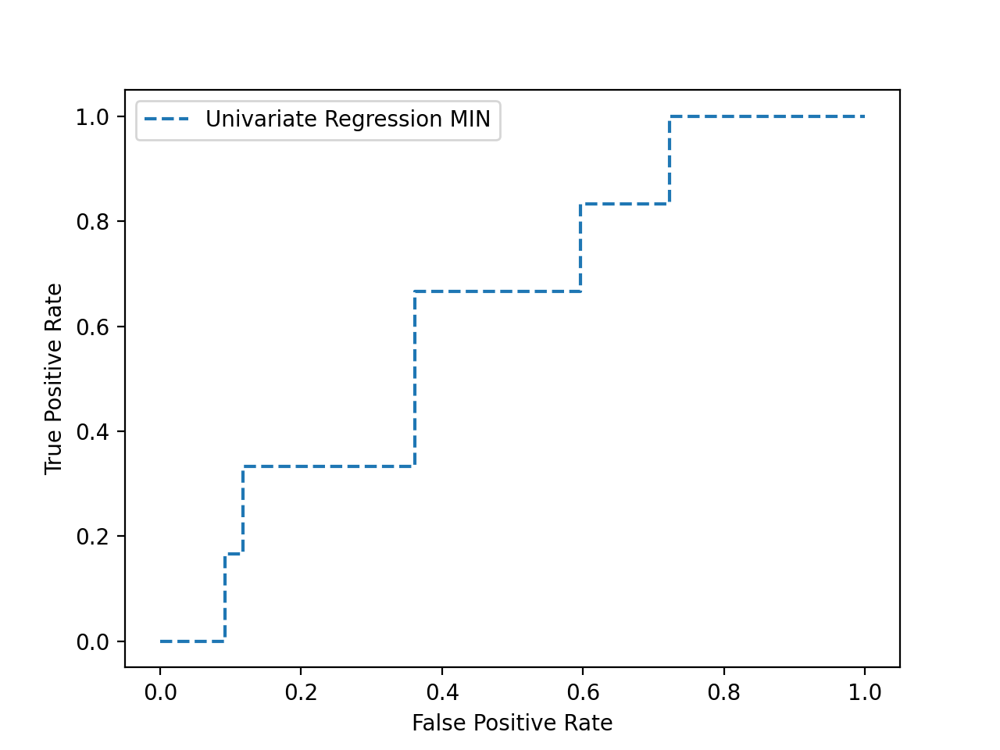

0.6246498599439776


In [34]:
##ROC curve

regr_probs = regr.predict(X_test)
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
%matplotlib notebook
from matplotlib import pyplot as pltr
regr_auc = roc_auc_score(y_test, regr_probs)

regr_fpr, regr_tpr, _ = roc_curve(y_test, regr_probs)

pltr.plot(regr_fpr, regr_tpr, linestyle='--', label='Univariate Regression MIN')
pltr.xlabel('False Positive Rate')
pltr.ylabel('True Positive Rate')
pltr.legend()
plt.savefig('plot.png', dpi=300, bbox_inches='tight')
plt.show()
print(regr_auc)

#fig.savefig('Univariate_Neuro.png')

# Ridge Regression 

In [35]:
alphas = 10**np.linspace(10,-2,100)*0.5
alphas
#number range  covers full range of scenarios from the null model containing only the intercept, to the least squares fit



array([5.00000000e+09, 3.78231664e+09, 2.86118383e+09, 2.16438064e+09,
       1.63727458e+09, 1.23853818e+09, 9.36908711e+08, 7.08737081e+08,
       5.36133611e+08, 4.05565415e+08, 3.06795364e+08, 2.32079442e+08,
       1.75559587e+08, 1.32804389e+08, 1.00461650e+08, 7.59955541e+07,
       5.74878498e+07, 4.34874501e+07, 3.28966612e+07, 2.48851178e+07,
       1.88246790e+07, 1.42401793e+07, 1.07721735e+07, 8.14875417e+06,
       6.16423370e+06, 4.66301673e+06, 3.52740116e+06, 2.66834962e+06,
       2.01850863e+06, 1.52692775e+06, 1.15506485e+06, 8.73764200e+05,
       6.60970574e+05, 5.00000000e+05, 3.78231664e+05, 2.86118383e+05,
       2.16438064e+05, 1.63727458e+05, 1.23853818e+05, 9.36908711e+04,
       7.08737081e+04, 5.36133611e+04, 4.05565415e+04, 3.06795364e+04,
       2.32079442e+04, 1.75559587e+04, 1.32804389e+04, 1.00461650e+04,
       7.59955541e+03, 5.74878498e+03, 4.34874501e+03, 3.28966612e+03,
       2.48851178e+03, 1.88246790e+03, 1.42401793e+03, 1.07721735e+03,
      

In [36]:
rr = Ridge(alpha=0.0001)  # higher the alpha value, more restriction on the coefficients; low alpha > more generalization, coefficients are barely


In [37]:
X_1 = np.nan_to_num(X)
X_1 


array([[  1.  ,  50.  ,   1.  , ...,   0.  ,   6.6 ,   7.  ],
       [  1.  , 104.  ,   0.  , ...,   1.  ,   0.9 ,   5.  ],
       [  1.  , 194.  ,   1.  , ...,   0.  ,   2.35,   5.  ],
       ...,
       [  0.  , 141.  ,   0.  , ...,   0.  ,  21.8 ,   3.  ],
       [  0.  ,  65.  ,   0.  , ...,   0.  ,   3.39,   3.  ],
       [  0.  ,  93.  ,   0.  , ...,   0.  ,   3.57,   2.  ]])

In [38]:
# imputing for roc curve i.e for missing values in ridge regression using mean
## updated imputer package with 0.23 upgrade
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(X)
X_2 = imp.fit_transform(X)

In [39]:
print(y)

[0 0 0 ... 0 0 0]


# Feature Ranking and ROC AUC Analysis 

In [40]:
X_train_1,X_test_1,y_train_1,y_test_1 = show_important_features(rr, X, y, is_imputation=True, num_features=None, cat_features=None, random_state=0, is_sampling=True)

[0.02049143 0.00505897 0.00654927 0.00071992 0.00069197 0.00204679
 0.00286926 0.00076357 0.00986347 0.01536373 0.00754615 0.02000734
 0.00812072 0.00083603 0.00206172 0.00578041]
[ 0 11  9  8 12 10  2 15  1  6 14  5 13  7  3  4]
(16,)
No. of important features =  16
Feature name : important score
STUDY  :  0.020491434965211244
PEAK GGT PROTOCOL 1 > 5 X ULN?  :  0.020007339331675235
PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN?  :  0.015363733583771185
PEAK CREATININE PROTOCOL 1  :  0.0098634700480402
PEAK ALT PROTOCOL 1  :  0.008120720828891903
LOWEST ALBUMIN PROTOCOL 1  :  0.007546148558527381
SEX  :  0.00654926660328734
CYTOGENETICS  :  0.005780408411796744
AGE AT DX (MONTHS)  :  0.005058966426825148
BILIRUBIN AT DX (UM/L)  :  0.0028692553970304587
WHITE CELL COUNT (X 10>9/L)  :  0.002061719634492924
PEAK URATE (MMOL/L)  :  0.0020467907523214336
FUNGAL INFECTION   :  0.0008360306044868186
GGT AT DX  :  0.0007635686477860722
FINAL RISK GROUP  :  0.0007199174397917903
CREATININE at DIAGNOSIS (

In [41]:
print(X_test)

[[-5.19083400e-01 -6.09177225e-01 -1.11290996e+00 ... -3.19827458e-01
  -3.63452699e-01 -1.26344983e+00]
 [-5.19083400e-01 -6.09177225e-01  8.98545284e-01 ... -1.77114897e-15
  -3.70422013e-01  1.30953422e+00]
 [-5.19083400e-01  2.00401698e+00  8.98545284e-01 ... -3.19827458e-01
   1.96772919e-01  1.30953422e+00]
 ...
 [-5.19083400e-01  1.28588727e+00 -1.11290996e+00 ... -3.19827458e-01
  -1.79570032e-01 -8.95880677e-01]
 [-5.19083400e-01 -2.30164326e-01 -1.11290996e+00 ... -3.19827458e-01
  -3.76962446e-01 -8.95880677e-01]
 [-5.19083400e-01  3.28380999e-01 -1.11290996e+00 ... -3.19827458e-01
  -3.75032482e-01 -1.26344983e+00]]


In [42]:
rr.fit(X_train,y_train)
Ridge_train_score = rr.score(X_train,y_train)
Ridge_test_score = rr.score(X_test, y_test)
print (rr.coef_)

[-0.02049143  0.00505896  0.00654927 -0.00071992 -0.00069197  0.00204679
  0.00286925 -0.00076357 -0.00986347 -0.01536373 -0.00754615  0.02000734
  0.00812072  0.00083603 -0.00206172  0.00578041]


In [43]:
##Retrieving column names from original data frame
feature_list = list(df.columns.values)
##getting rid of the Neurotoxity (y) # the method pop() removes and returns last element from the list.
feature_list.pop()
 

coef_feat = {'features' : feature_list, 'rr.coef_' : rr.coef_[:,]} #[:,] means rows are droped and column features 0-44 kept
coef_feat_rr = pd.DataFrame(data = coef_feat )
print(coef_feat_rr) 

                                features  rr.coef_
0   STUDY                                -0.020491
1   AGE AT DX (MONTHS)                    0.005059
2   SEX                                   0.006549
3   FINAL RISK GROUP                     -0.000720
4   CREATININE at DIAGNOSIS (UMOL/L)     -0.000692
5   PEAK URATE (MMOL/L)                   0.002047
6   BILIRUBIN AT DX (UM/L)                0.002869
7   GGT AT DX                            -0.000764
8   PEAK CREATININE PROTOCOL 1           -0.009863
9   PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN? -0.015364
10  LOWEST ALBUMIN PROTOCOL 1            -0.007546
11  PEAK GGT PROTOCOL 1 > 5 X ULN?        0.020007
12  PEAK ALT PROTOCOL 1                   0.008121
13  FUNGAL INFECTION                      0.000836
14  WHITE CELL COUNT (X 10>9/L)          -0.002062
15  CYTOGENETICS                          0.005780


<IPython.core.display.Javascript object>


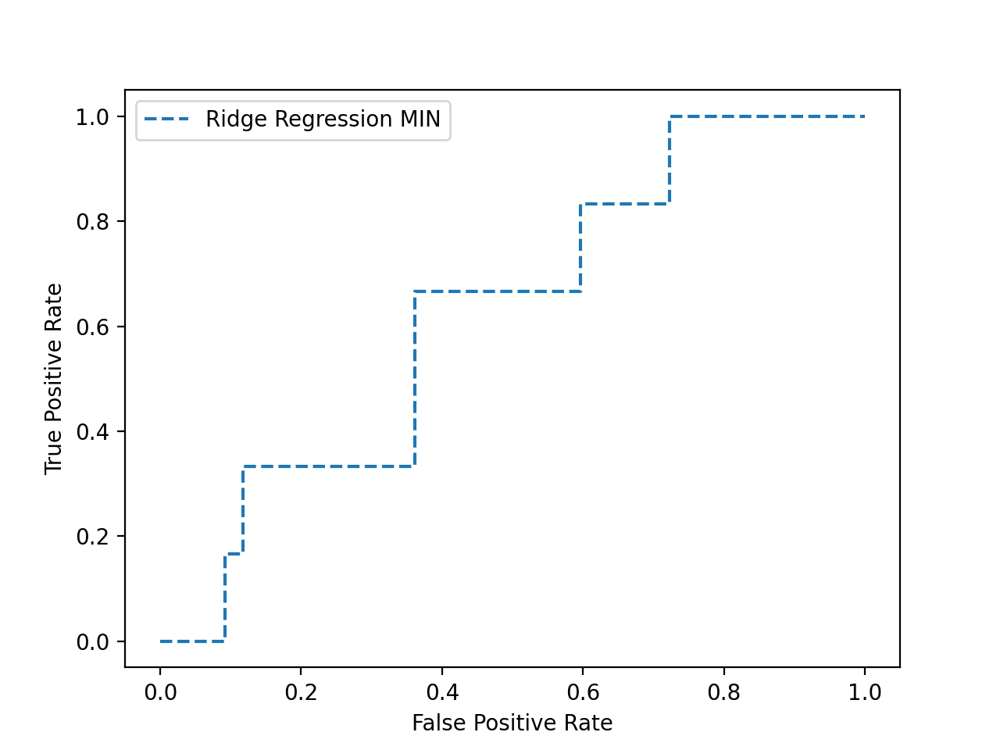

0.6246498599439776


In [44]:
##ROC curve Ridge Regression 
rr_probs = rr.predict(X_test)

%matplotlib notebook

rr_auc = roc_auc_score(y_test, rr_probs)

rr_fpr, rr_tpr, _ = roc_curve(y_test, rr_probs)


pltr.plot(rr_fpr, rr_tpr, linestyle='--', label='Ridge Regression MIN')
pltr.xlabel('False Positive Rate')
pltr.ylabel('True Positive Rate')
pltr.legend()
plt.show()
print(rr_auc)

# LASSO Regression 

In [45]:
%matplotlib inline

In [46]:
alphas = 10**np.linspace(6,-2,50)*0.5
alphas

array([5.00000000e+05, 3.43324423e+05, 2.35743318e+05, 1.61872877e+05,
       1.11149824e+05, 7.63208984e+04, 5.24056567e+04, 3.59842837e+04,
       2.47085668e+04, 1.69661089e+04, 1.16497591e+04, 7.99929360e+03,
       5.49270571e+03, 3.77156003e+03, 2.58973734e+03, 1.77824015e+03,
       1.22102655e+03, 8.38416468e+02, 5.75697700e+02, 3.95302161e+02,
       2.71433772e+02, 1.86379686e+02, 1.27977396e+02, 8.78755312e+01,
       6.03396320e+01, 4.14321386e+01, 2.84493301e+01, 1.95346997e+01,
       1.34134790e+01, 9.21034985e+00, 6.32427608e+00, 4.34255687e+00,
       2.98181166e+00, 2.04745753e+00, 1.40588435e+00, 9.65348864e-01,
       6.62855683e-01, 4.55149089e-01, 3.12527596e-01, 2.14596713e-01,
       1.47352585e-01, 1.01179482e-01, 6.94747747e-02, 4.77047738e-02,
       3.27564278e-02, 2.24921633e-02, 1.54442180e-02, 1.06047544e-02,
       7.28174239e-03, 5.00000000e-03])

In [47]:
##lasso regression - notes: Many regression methods limit the magnitude or norm of the coefficients to constrain 
# the solution space. I understand the main benefit of LASSO to be penalising very small coefficients 
#(setting them to zero if small enough) based on the assumption that these are more likely to be low signal to 
#noise and therefore add more noise than signal to the prediction when applying to independent data.


## L1 Lasso shrinks coefficients to zero

lasso = Lasso(alpha=.0009)
lasso.fit(X_train,y_train)

print(lasso.score(X_train,y_train))
print(lasso.score(X_test,y_test))
print(lasso.coef_)

0.02365411122785077
0.004236191461540195
[-0.01918158  0.00349236  0.00526511 -0.          0.          0.
  0.00192673  0.         -0.00693618 -0.01364919 -0.00677221  0.01798193
  0.00699731  0.         -0.00048056  0.00495936]


# Feature Ranking and ROC AUC Analysis 

In [48]:
X_train,X_test,y_train,y_test = show_important_features(lasso, X, y, is_imputation=True, num_features=None, cat_features=None, random_state=10, is_sampling=True)

[0.02049143 0.00505897 0.00654927 0.00071992 0.00069197 0.00204679
 0.00286926 0.00076357 0.00986347 0.01536373 0.00754615 0.02000734
 0.00812072 0.00083603 0.00206172 0.00578041]
[ 0 11  9  8 12 10  2 15  1  6 14  5 13  7  3  4]
(16,)
No. of important features =  16
Feature name : important score
STUDY  :  0.020491434965211244
PEAK GGT PROTOCOL 1 > 5 X ULN?  :  0.020007339331675235
PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN?  :  0.015363733583771185
PEAK CREATININE PROTOCOL 1  :  0.0098634700480402
PEAK ALT PROTOCOL 1  :  0.008120720828891903
LOWEST ALBUMIN PROTOCOL 1  :  0.007546148558527381
SEX  :  0.00654926660328734
CYTOGENETICS  :  0.005780408411796744
AGE AT DX (MONTHS)  :  0.005058966426825148
BILIRUBIN AT DX (UM/L)  :  0.0028692553970304587
WHITE CELL COUNT (X 10>9/L)  :  0.002061719634492924
PEAK URATE (MMOL/L)  :  0.0020467907523214336
FUNGAL INFECTION   :  0.0008360306044868186
GGT AT DX  :  0.0007635686477860722
FINAL RISK GROUP  :  0.0007199174397917903
CREATININE at DIAGNOSIS (

In [49]:
coef_feat = {'features' : feature_list, 'lasso.coef_' : lasso.coef_[:,]} #[:,] means rows are droped and column features 0-44 kept
coef_feat_lasso = pd.DataFrame(data = coef_feat )
print(coef_feat_lasso) 

                                features  lasso.coef_
0   STUDY                                -0.019182   
1   AGE AT DX (MONTHS)                    0.003492   
2   SEX                                   0.005265   
3   FINAL RISK GROUP                     -0.000000   
4   CREATININE at DIAGNOSIS (UMOL/L)      0.000000   
5   PEAK URATE (MMOL/L)                   0.000000   
6   BILIRUBIN AT DX (UM/L)                0.001927   
7   GGT AT DX                             0.000000   
8   PEAK CREATININE PROTOCOL 1           -0.006936   
9   PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN? -0.013649   
10  LOWEST ALBUMIN PROTOCOL 1            -0.006772   
11  PEAK GGT PROTOCOL 1 > 5 X ULN?        0.017982   
12  PEAK ALT PROTOCOL 1                   0.006997   
13  FUNGAL INFECTION                      0.000000   
14  WHITE CELL COUNT (X 10>9/L)          -0.000481   
15  CYTOGENETICS                          0.004959   


<IPython.core.display.Javascript object>


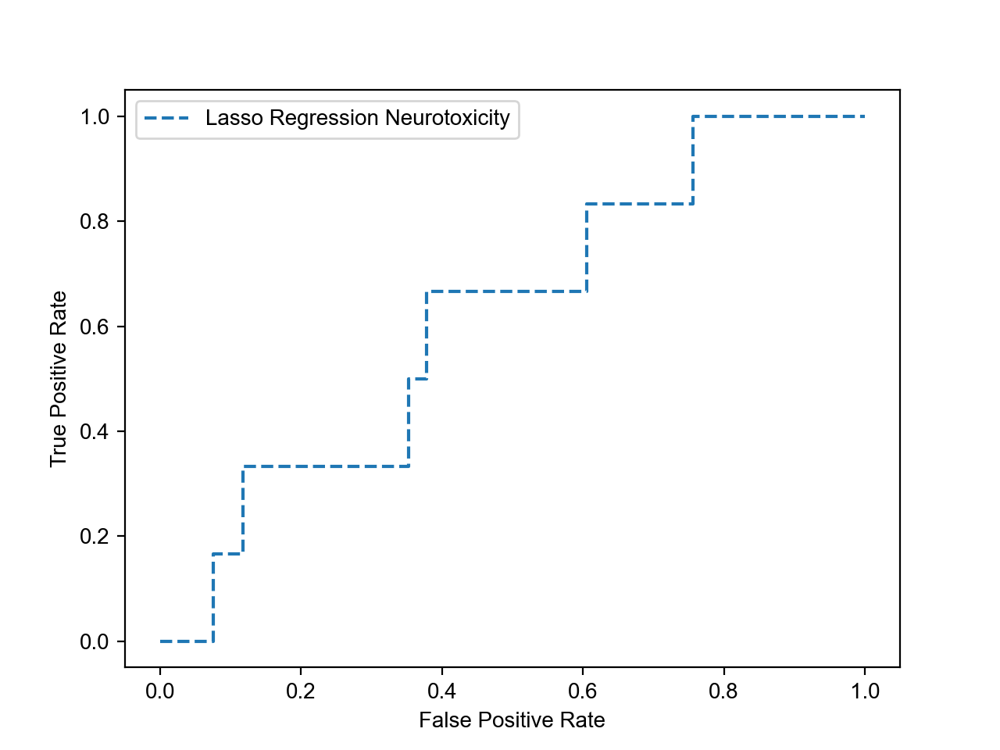

0.6246498599439776


In [50]:
##ROC curve Lasso Regression 
lasso_probs = lasso.predict(X_test)
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
%matplotlib notebook
from matplotlib import pyplot as pltr
lasso_auc = roc_auc_score(y_test, lasso_probs)

rr_fpr, rr_tpr, _ = roc_curve(y_test, lasso_probs)


pltr.plot(rr_fpr, rr_tpr, linestyle='--', label='Lasso Regression Neurotoxicity')
pltr.xlabel('False Positive Rate')
pltr.ylabel('True Positive Rate')
pltr.legend()
plt.show()
print(rr_auc)

# Machine Learning Algorithms 

#  ROC Curve for each Classifier with Cross Validation 

In [51]:
## For ROC Curve generation with cross-validation for machine learning algorithms
# classifier: the classifier used (using constructor of classes for classifiers)
# X: features to split into training and testing sets using k-fold cross-validation
# y: classes corresponding to samples stored in X
# cat_features: indices of categorical features in X
# num_features: indices of numerical features in X
# k_fold: number of folds to split
def draw_roc_curve_cross_validation(classifier, X, y, cat_features, num_features, k_fold=10):
    cv = StratifiedKFold(n_splits=k_fold)
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)

    fig, ax = plt.subplots()
    for i, (train_index, test_index) in enumerate(cv.split(X, y)):
        Xtr, Xtest = X[train_index], X[test_index]
        ytr, ytest = y[train_index], y[test_index]

        Xtr, Xtest = data_imputation(Xtr, Xtest, cat_features, num_features) # data imputation

        Xtr, Xtest = standar_scaler(Xtr, Xtest, num_features) # standarization scale

        classifier.fit(Xtr, ytr)
        viz = plot_roc_curve(classifier, Xtest, ytest,
                             name='ROC fold {}'.format(i),
                             alpha=0.3, lw=1, ax=ax)
        interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)

    ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    ax.plot(mean_fpr, mean_tpr, color='b',
            label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
            lw=2, alpha=.8)

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                    label=r'$\pm$ 1 std. dev.')

    ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05], title="ROC Curve")
    ax.legend(loc="lower right")
    plt.show()


# Fit Classifier and Plot Metrics 

In [52]:
# classifier: the classifier used (using constructor of classes for classifiers)
# X: features to split into training and testing sets using k-fold cross-validation
# y: classes corresponding to samples stored in X
# cat_features: indices of categorical features in X
# num_features: indices of numerical features in X
# k_fold: number of folds to split
from sklearn.metrics import f1_score
from sklearn.metrics import plot_confusion_matrix
def display_confusion_matrix_f1_score(classifier, X, y, cat_features, num_features, k_fold=10):
    cv = StratifiedKFold(n_splits=k_fold)
    for i, (train_index, test_index) in enumerate(cv.split(X, y)):
        Xtr, Xtest = X[train_index], X[test_index]
        ytr, ytest = y[train_index], y[test_index]

        Xtr, Xtest = data_imputation(Xtr, Xtest, cat_features, num_features) # data imputation

        Xtr, Xtest = standar_scaler(Xtr, Xtest, num_features) # standarization scale

        classifier.fit(Xtr, ytr)
        
        y_pred = classifier.predict(Xtest)
        
        f1_result = f1_score(ytest, y_pred, pos_label=1) # pos_label is the class with lower number of samples (positive class)
        
        print('Fold :', i, ', F1 = ', f1_result)
        
        disp = plot_confusion_matrix(classifier, Xtest, ytest, cmap=plt.cm.Blues)
        
        disp.ax_.set_title('Confusion matrix')
        

# XGBoost and Scoring

In [31]:
# Using gradient boosted tree
xg_classifier = xgb.XGBClassifier(objective ='binary:logistic', learning_rate = 0.05, n_estimators = 100)
avg_acc_xgb, min_acc_xgb, max_acc_xgb, avg_f1_xgb, min_f1_xgb, max_f1_xgb = model_training_and_evaluation(xg_classifier, X, y, True, num_features)

[08:20:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[08:20:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[08:20:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' t

In [54]:
# Display result:
print("XGBoost with 10-fold cross-validation:")
print("Average accuracy = ", avg_acc_xgb)
print("Min accuracy = ", min_acc_xgb)
print("Max accuracy = ", max_acc_xgb)
print("Average F1 = ", avg_f1_xgb)
print("Min F1 = ", min_f1_xgb)
print("Max F1 = ", max_f1_xgb)

XGBoost with 10-fold cross-validation:
Average accuracy =  0.9576380952380953
Min accuracy =  0.952
Max accuracy =  0.96
Average F1 =  0.0
Min F1 =  0.0
Max F1 =  0.0


# ROC curve XGBoost

<IPython.core.display.Javascript object>


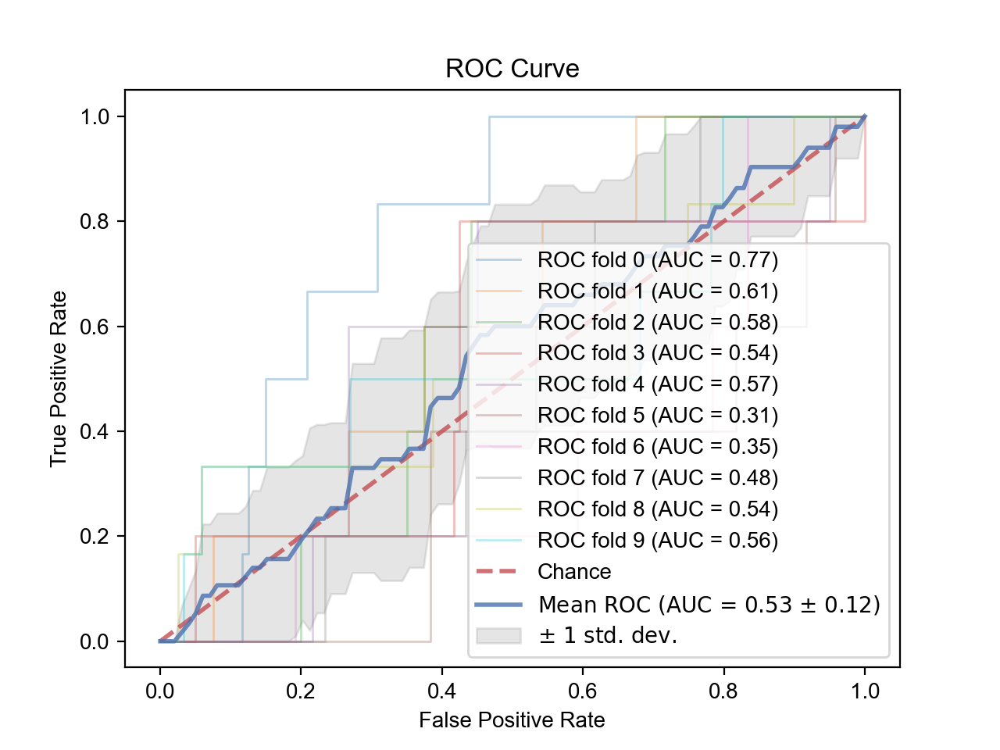

In [55]:
# Call function to draw ROC curve for XGBoost 
draw_roc_curve_cross_validation(classifier=xg_classifier, X=X, y=y, cat_features=cat_features, num_features=num_features, k_fold=10)

# Confusion matrix with n_10 splits StratifiedKFold XGBoost

Confusion matrices of XGBoost:
Iteration  1 :


<IPython.core.display.Javascript object>


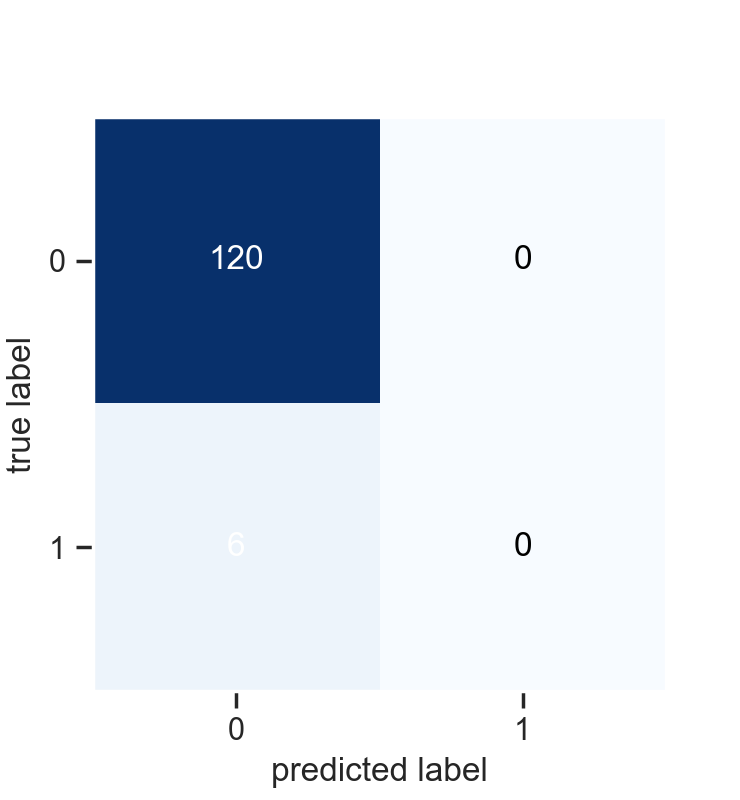

Iteration  2 :


<IPython.core.display.Javascript object>


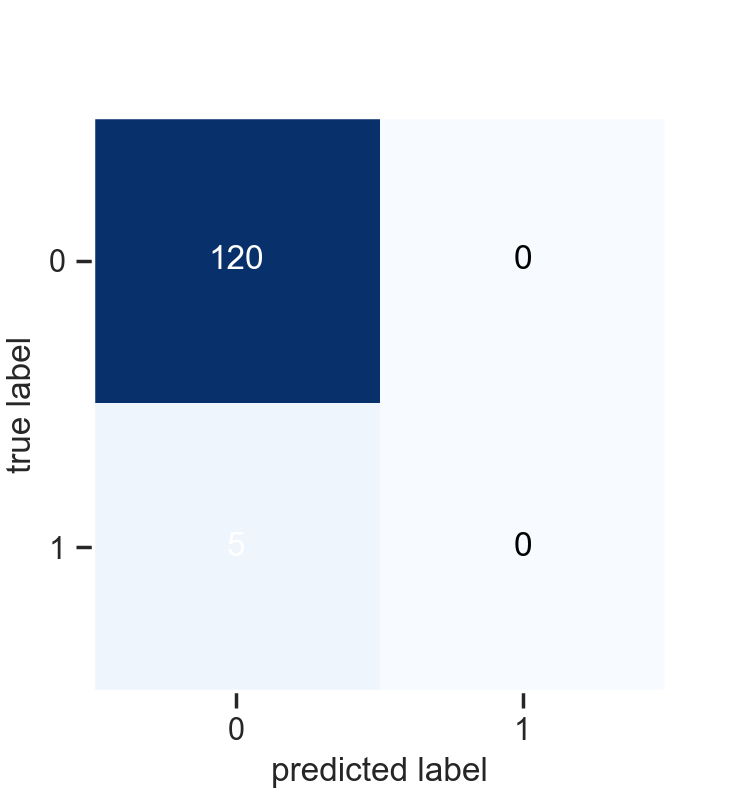

Iteration  3 :


<IPython.core.display.Javascript object>


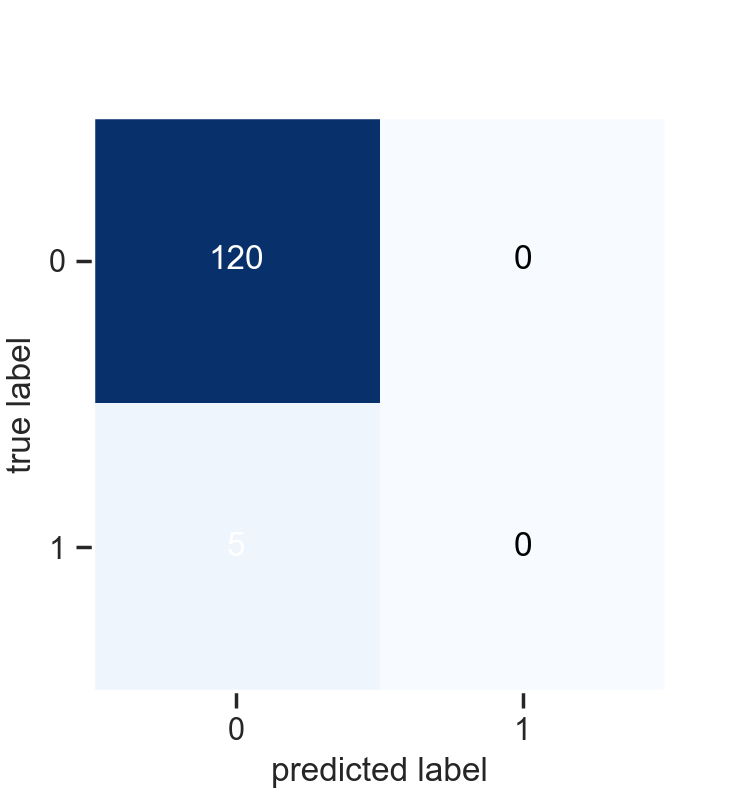

Iteration  4 :


<IPython.core.display.Javascript object>


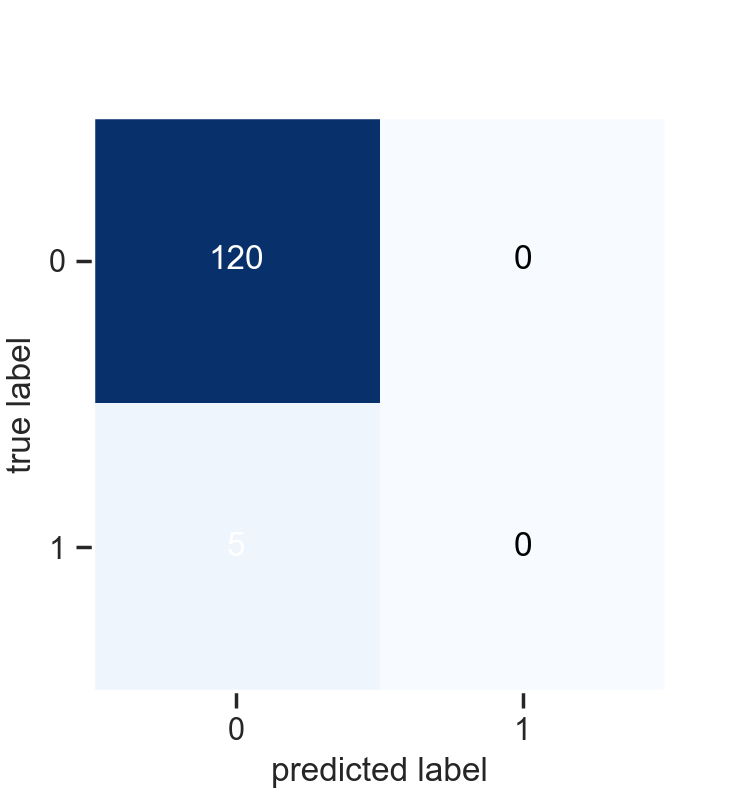

Iteration  5 :


<IPython.core.display.Javascript object>


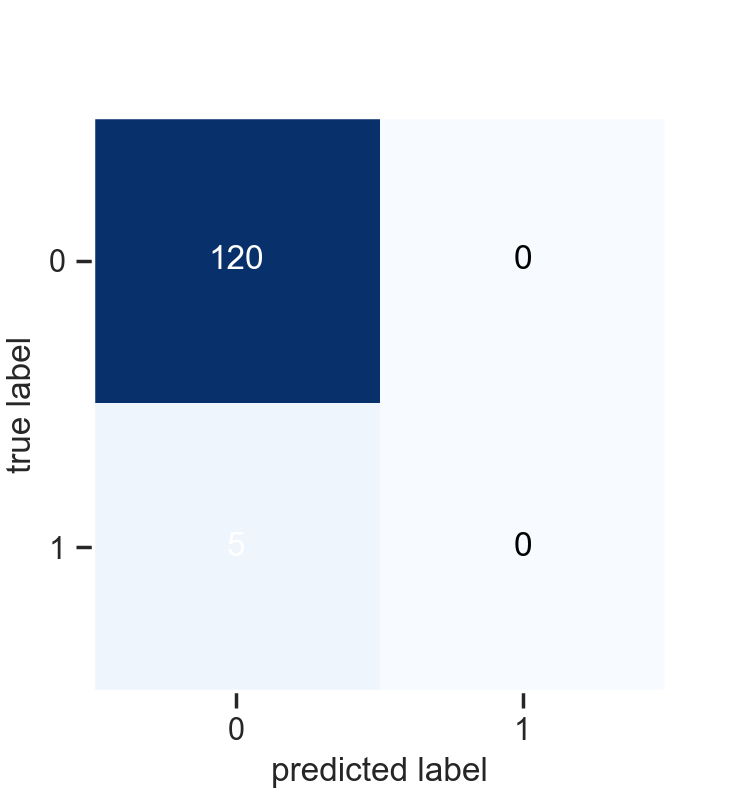

Iteration  6 :


<IPython.core.display.Javascript object>


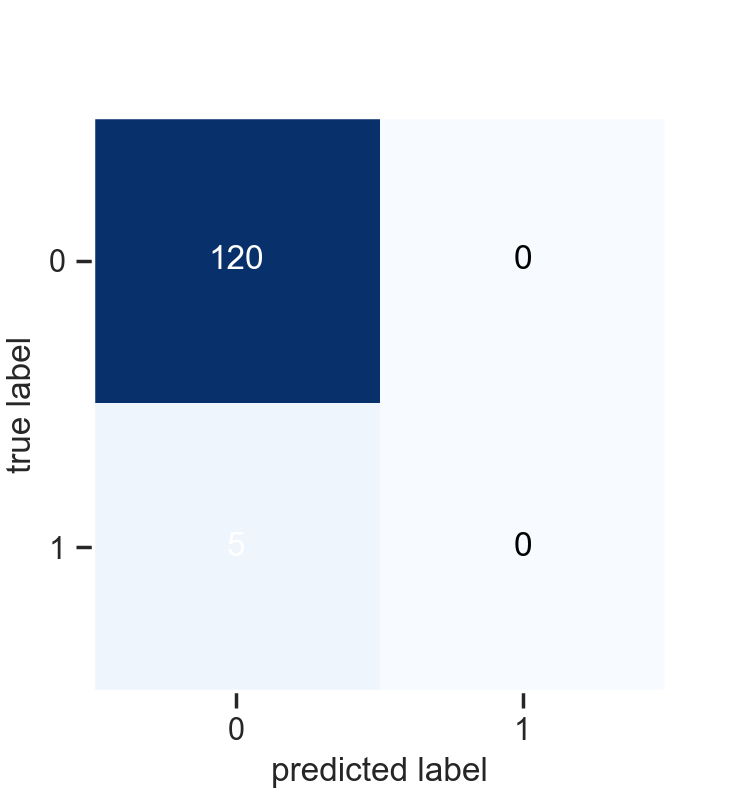

Iteration  7 :


<IPython.core.display.Javascript object>


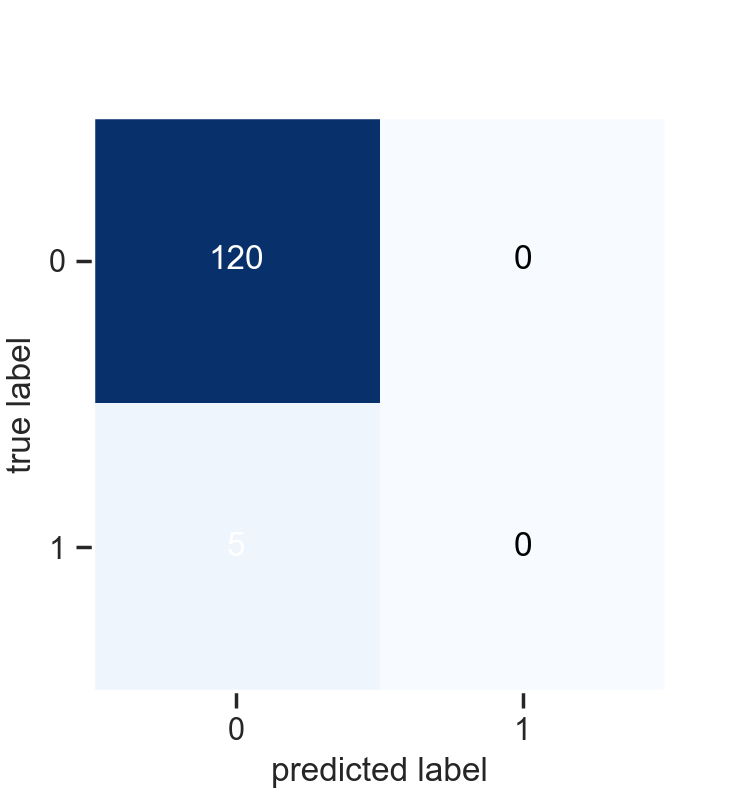

Iteration  8 :


<IPython.core.display.Javascript object>


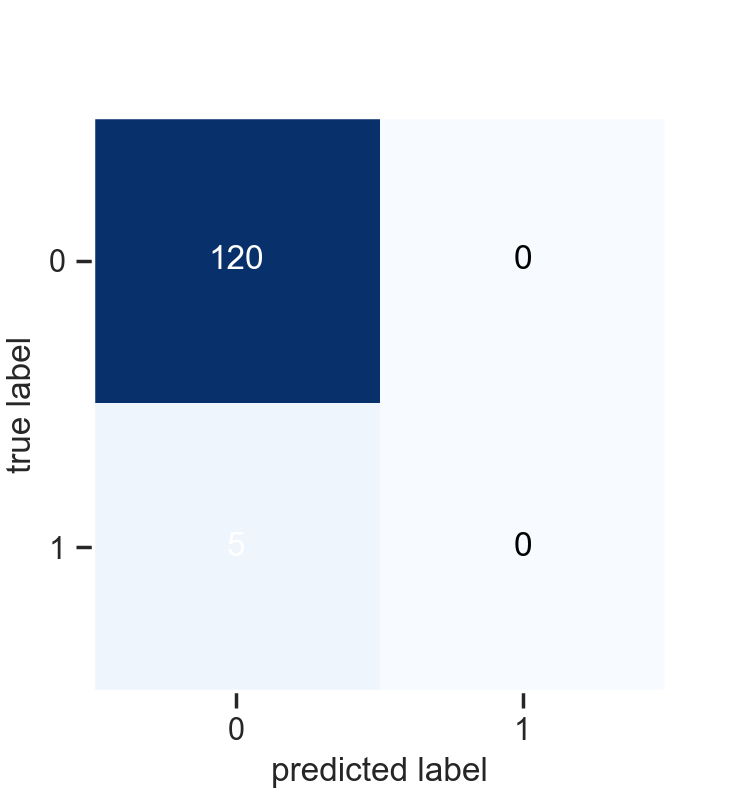

Iteration  9 :


<IPython.core.display.Javascript object>


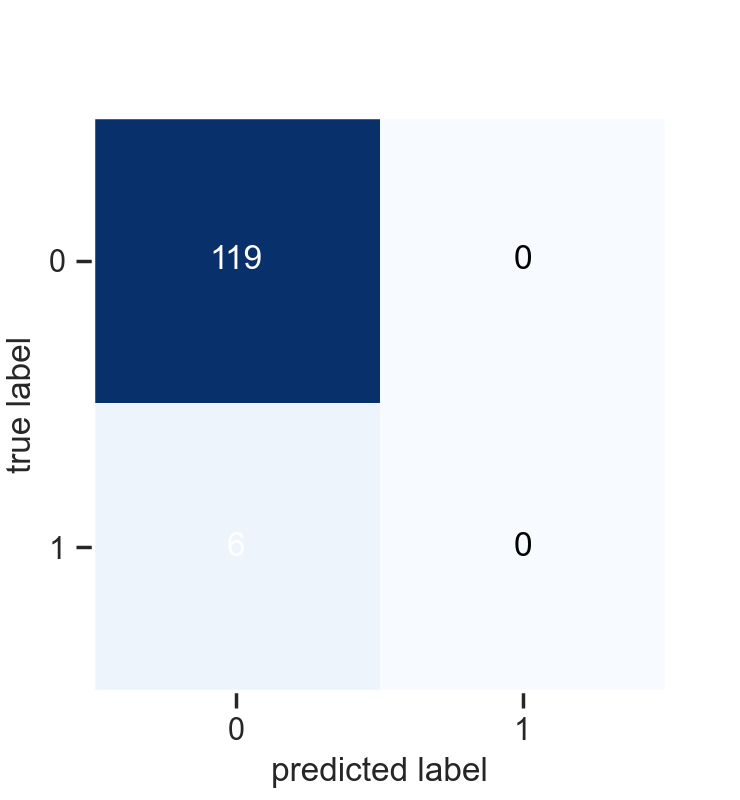

Iteration  10 :


<IPython.core.display.Javascript object>


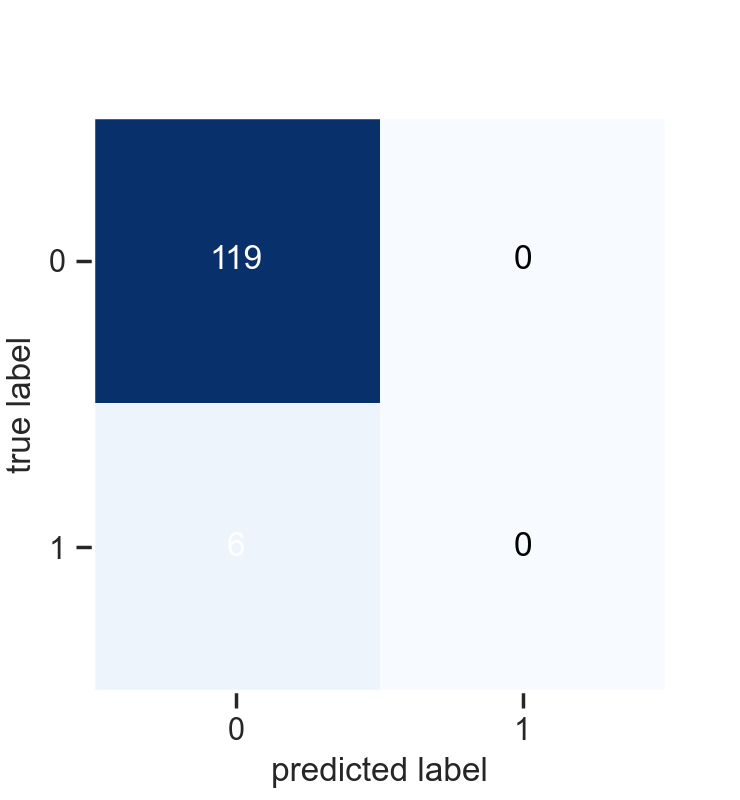

In [56]:
from sklearn.metrics import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix
def show_confusion_matrix(model, X, y, is_imputation=True, num_features=None, cat_features=None, random_state=10):
    """
        Show confusion matrix for each run on each fold
    """
    #skf = StratifiedKFold(n_splits=num_split_validation, random_state=random_state, shuffle=False)
    skf = StratifiedKFold(n_splits=10,shuffle=True,random_state=10)
    
    loop = 1
    for train_index, test_index in skf.split(X, y):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        
        # Feature scaling
        X_train, X_test = standar_scaler(X_train, X_test, num_features)
        
        if is_imputation:
            X_train, X_test = data_imputation(X_train, X_test, cat_features, num_features)
        
        # Training model
        model.fit(X_train, y_train)
        
        # get prediction
        try:
            y_pred = model.predict(X_test)
            print("Iteration ", loop, ":")
            confm = confusion_matrix(y_test, y_pred)
            sns.set(font_scale=1.0)
            fig, ax = plot_confusion_matrix(conf_mat=confm)
            fig.set_size_inches(3.7, 4, forward=True)
            plt.show()
            loop = loop + 1
        except Exception as ex:
            print(ex)

print("Confusion matrices of XGBoost:")
show_confusion_matrix(xg_classifier, X, y, True, num_features)


# Light GBM and Scoring

In [57]:
#use LGBM
lightGBMClassifier = lgbm.LGBMClassifier(learning_rate = 0.05, metric = 'binary_logloss', n_estimators = 100)
avg_acc_lgbm, min_acc_lgbm, max_acc_lgbm, avg_f1_lgbm, min_f1_lgbm, max_f1_lgbm = model_training_and_evaluation(lightGBMClassifier, X, y, True, num_features)

In [58]:
# Display result:
print("lgbm with 10-fold cross-validation:")
print("Average accuracy = ", avg_acc_lgbm)
print("Min accuracy = ", min_acc_lgbm)
print("Max accuracy = ", max_acc_lgbm)
print("Average F1 = ", avg_f1_lgbm)
print("Min F1 = ", min_f1_lgbm)
print("Max F1 = ", max_f1_lgbm)

lgbm with 10-fold cross-validation:
Average accuracy =  0.9568380952380953
Min accuracy =  0.952
Max accuracy =  0.96
Average F1 =  0.0
Min F1 =  0.0
Max F1 =  0.0


# ROC curve LightGBM

<IPython.core.display.Javascript object>


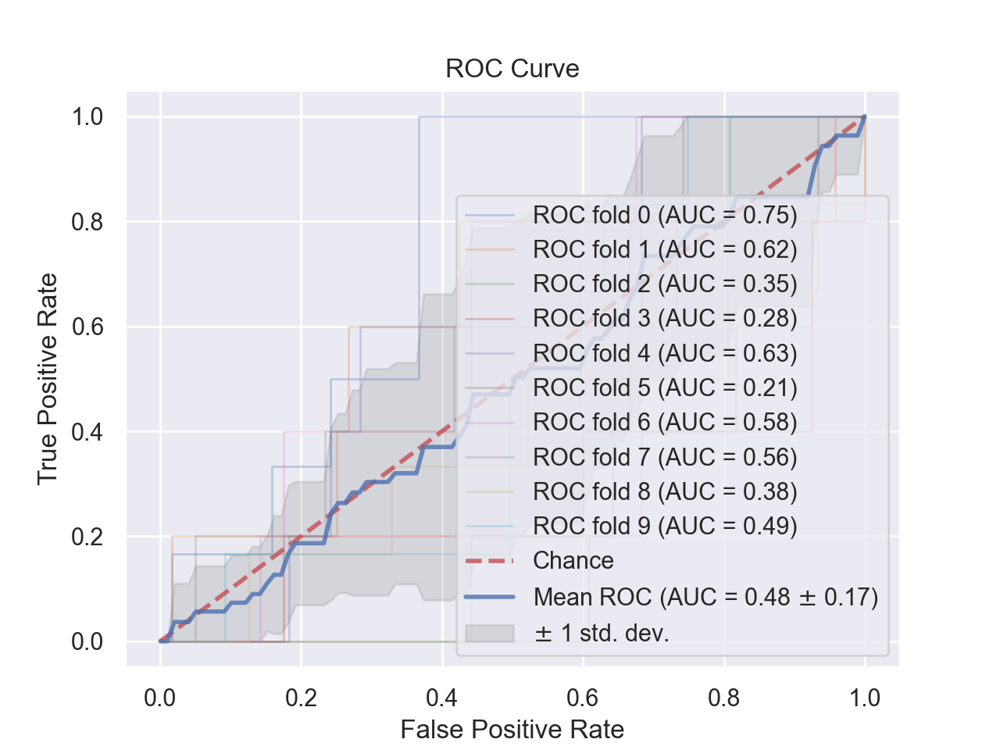

In [59]:
# Call function to draw ROC curve for LightGBM 
draw_roc_curve_cross_validation(classifier=lightGBMClassifier, X=X, y=y, cat_features=cat_features, num_features=num_features, k_fold=10)

# Confusion matrix with n_10 splits StratifiedKFold LightBGM

Confusion matrices of LightGBM:
Iteration  1 :


<IPython.core.display.Javascript object>


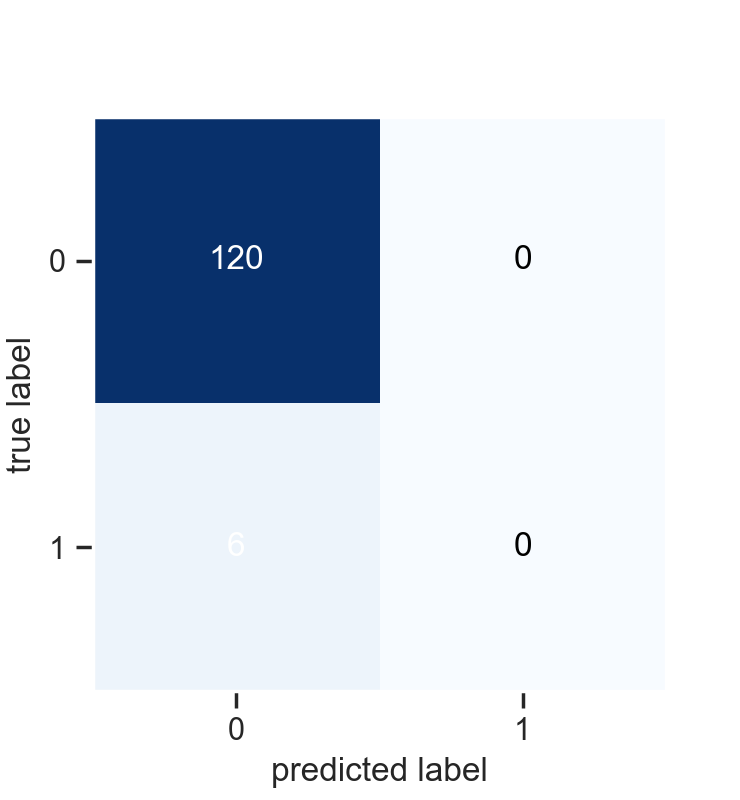

Iteration  2 :


<IPython.core.display.Javascript object>


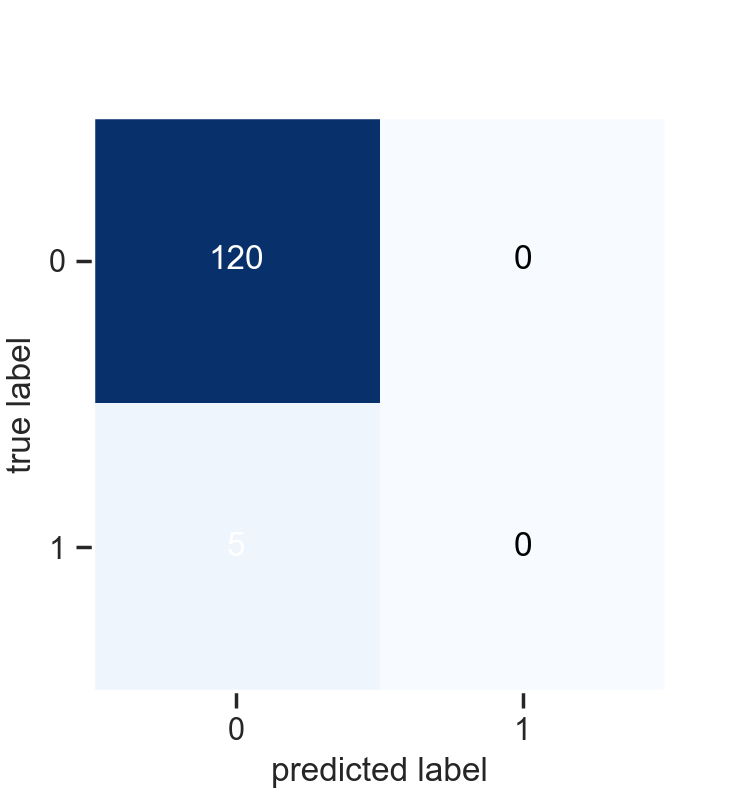

Iteration  3 :


<IPython.core.display.Javascript object>


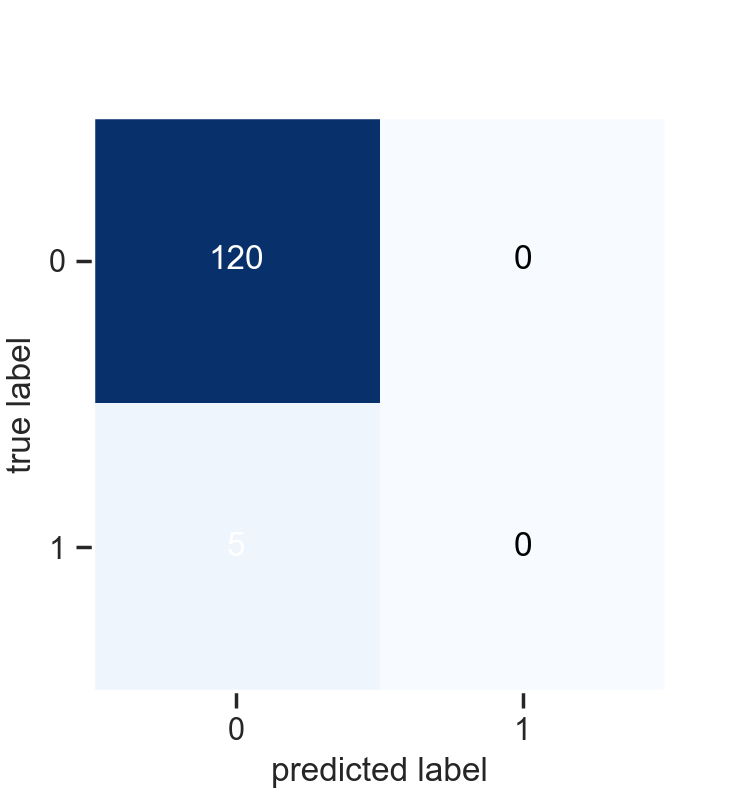

Iteration  4 :


<IPython.core.display.Javascript object>


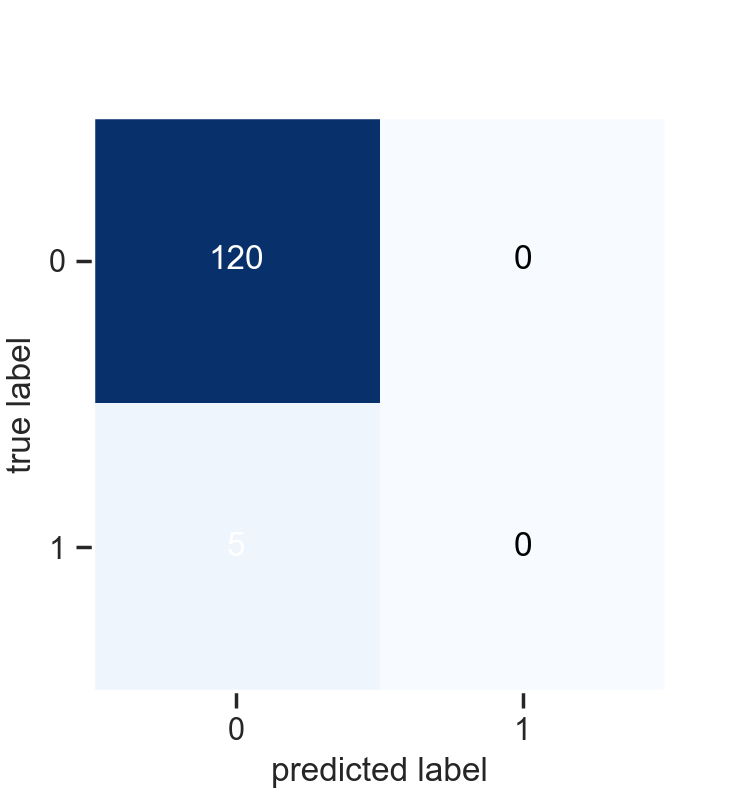

Iteration  5 :


<IPython.core.display.Javascript object>


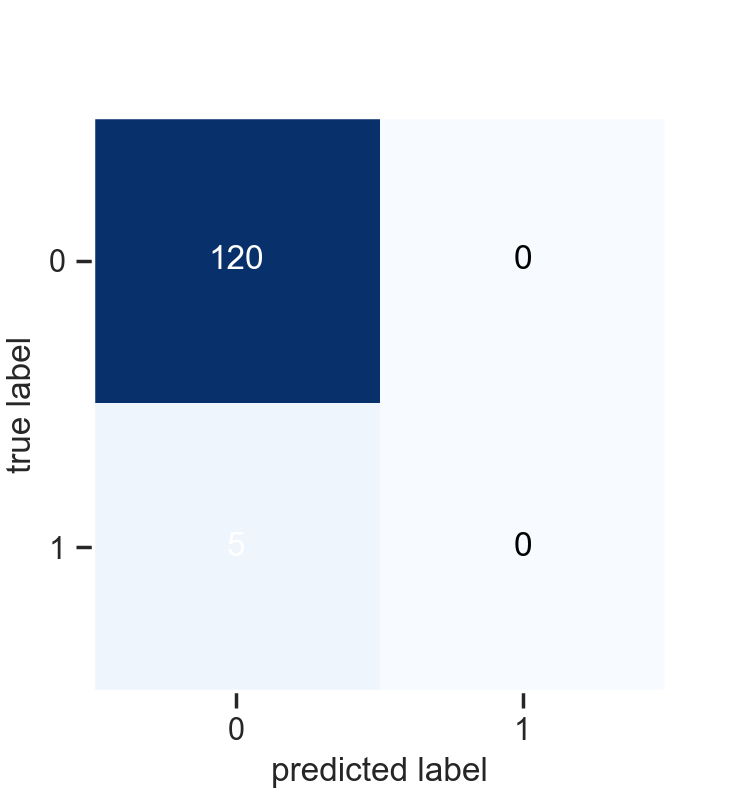

Iteration  6 :


<IPython.core.display.Javascript object>


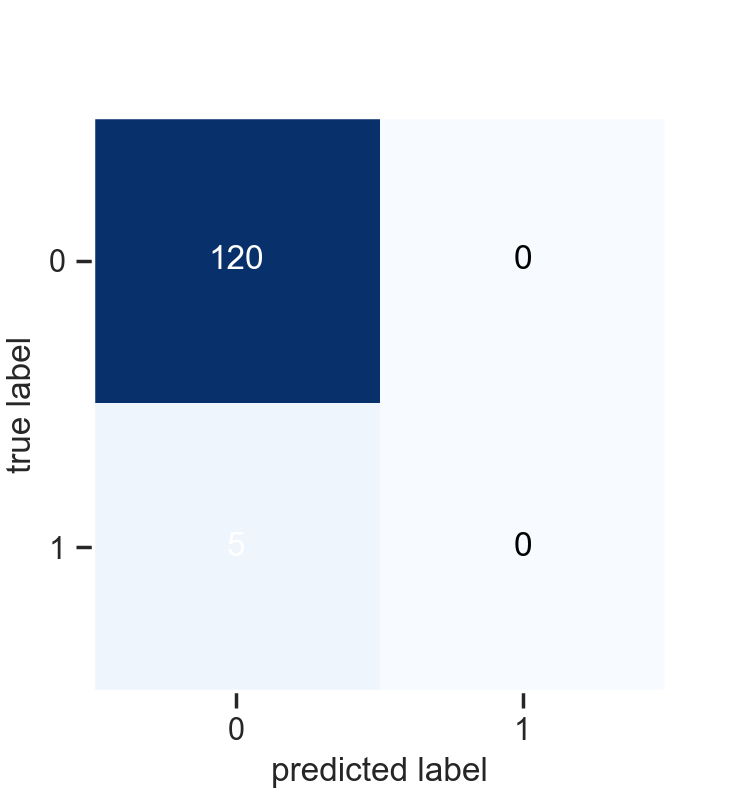

Iteration  7 :


<IPython.core.display.Javascript object>


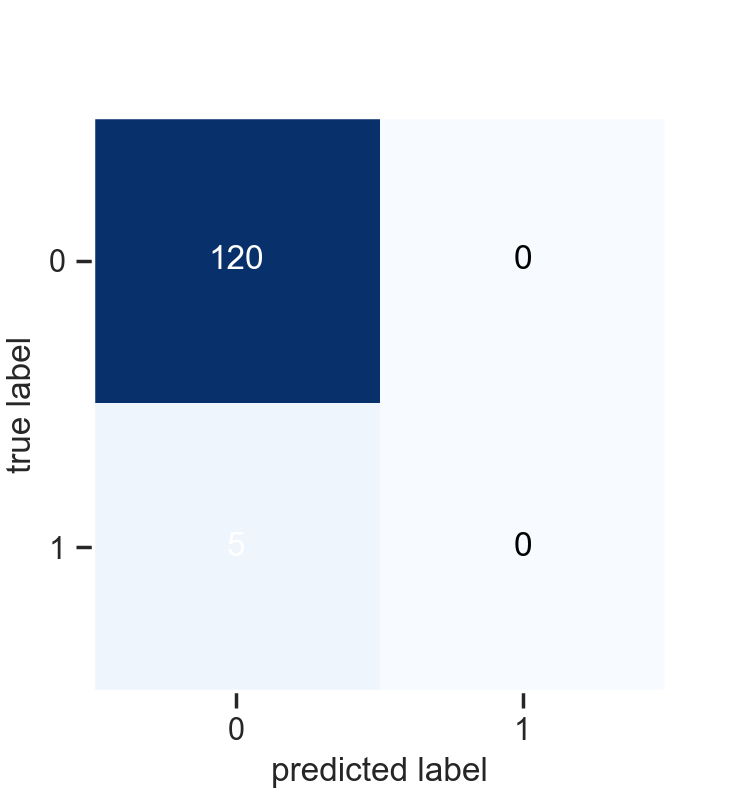

Iteration  8 :


<IPython.core.display.Javascript object>


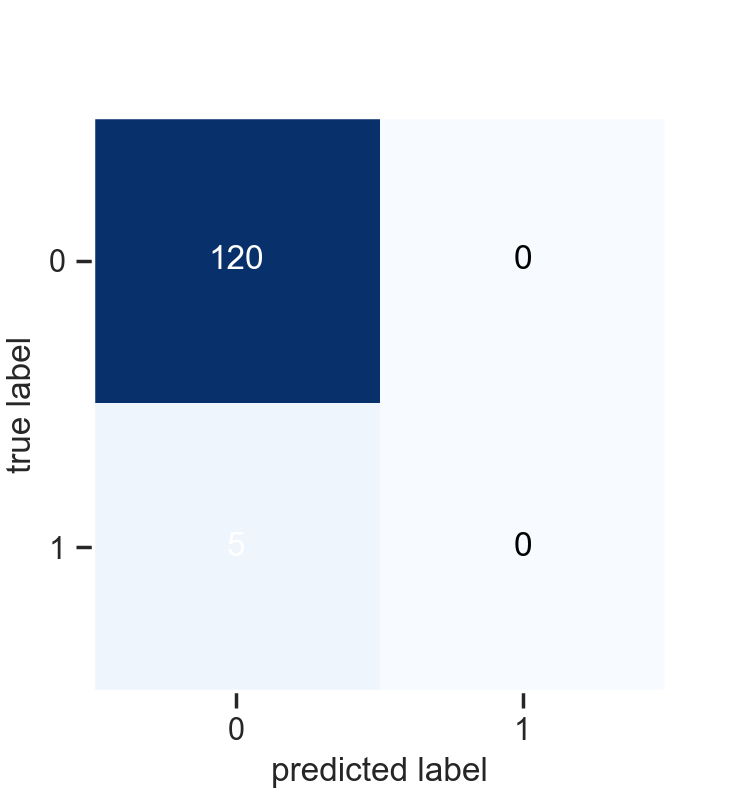

Iteration  9 :


<IPython.core.display.Javascript object>


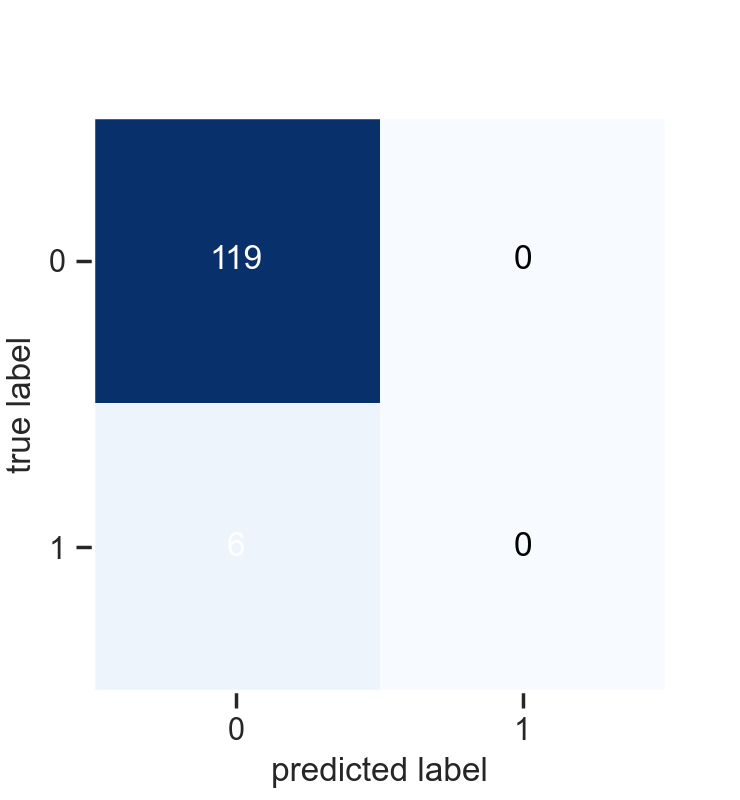

Iteration  10 :


<IPython.core.display.Javascript object>


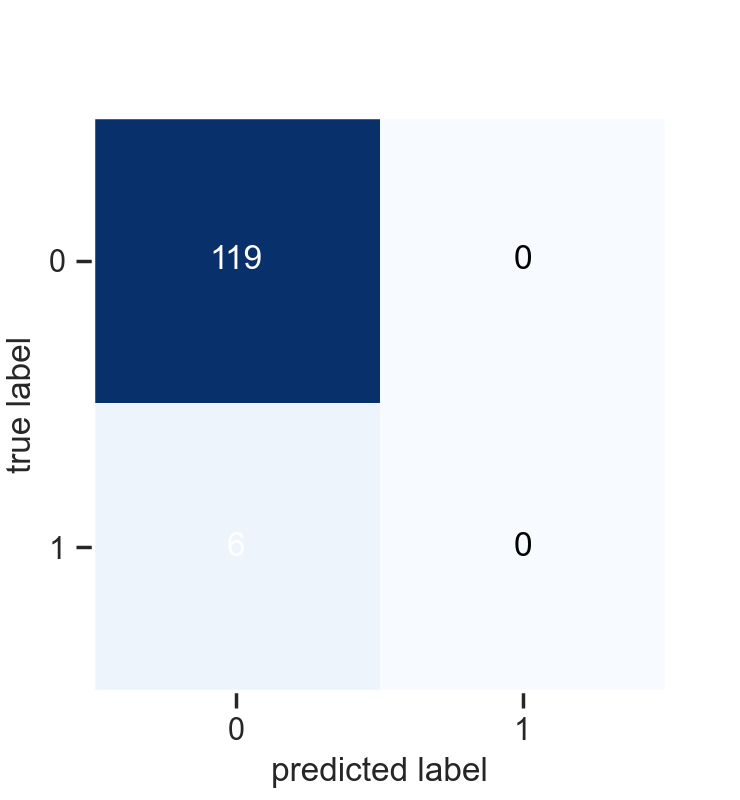

In [60]:
print("Confusion matrices of LightGBM:")
show_confusion_matrix(lightGBMClassifier, X, y, True, num_features)

# Logistic Regression and Scoring

In [61]:
#logisitic regression 
logReg = LogisticRegression(solver='lbfgs')
avg_acc_lrg, min_acc_lrg, max_acc_lrg, avg_f1_lrg, min_f1_lrg, max_f1_lrg = model_training_and_evaluation(logReg, X, y, True, num_features, cat_features, rd_state)

# Logistic regression result:
print("LogisticRegression classifier with", num_split_validation,"-fold cross-validation:")
print("Average accuracy = ", avg_acc_lrg)
print("Min accuracy = ", min_acc_lrg)
print("Max accuracy = ", max_acc_lrg)
print("Average F1 = ", avg_f1_lrg)
print("Min F1 = ", min_f1_lrg)
print("Max F1 = ", max_f1_lrg)

LogisticRegression classifier with 10 -fold cross-validation:
Average accuracy =  0.9576380952380953
Min accuracy =  0.952
Max accuracy =  0.96
Average F1 =  0.0
Min F1 =  0.0
Max F1 =  0.0


# ROC Curve Logistic Regression 

<IPython.core.display.Javascript object>


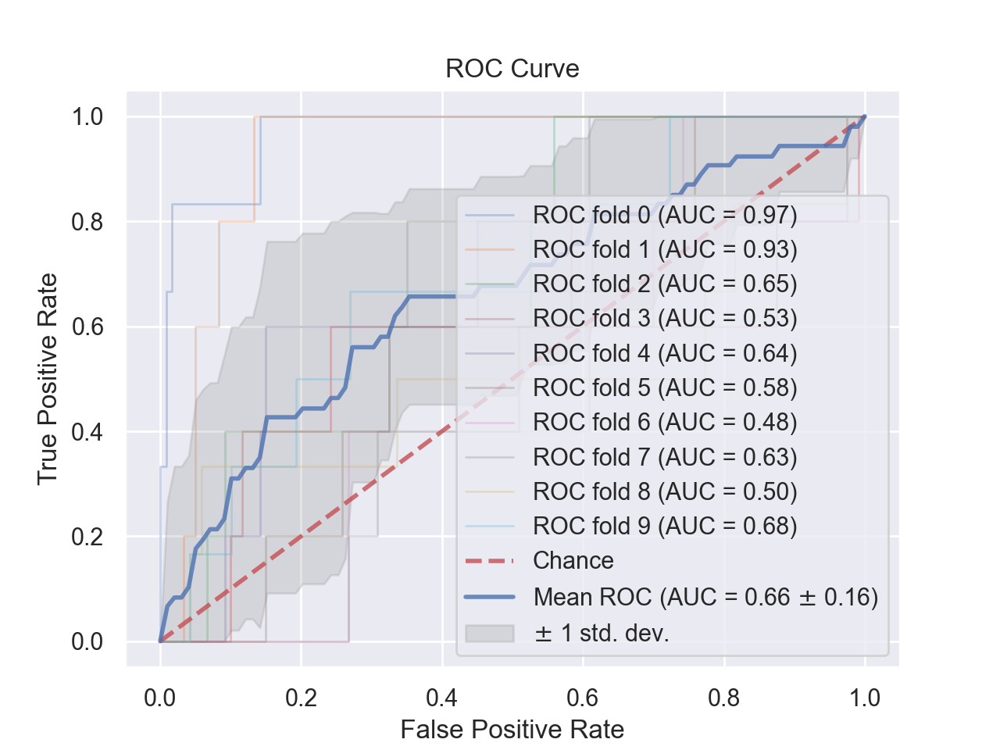

In [62]:
# Call function to draw ROC curve for LightGBM 
draw_roc_curve_cross_validation(classifier=logReg, X=X, y=y, cat_features=cat_features, num_features=num_features, k_fold=10)

# Confusion matrix with n_10 splits StratifiedKFold Logistic Regression

Confusion matrices of LightGBM:
Iteration  1 :


<IPython.core.display.Javascript object>


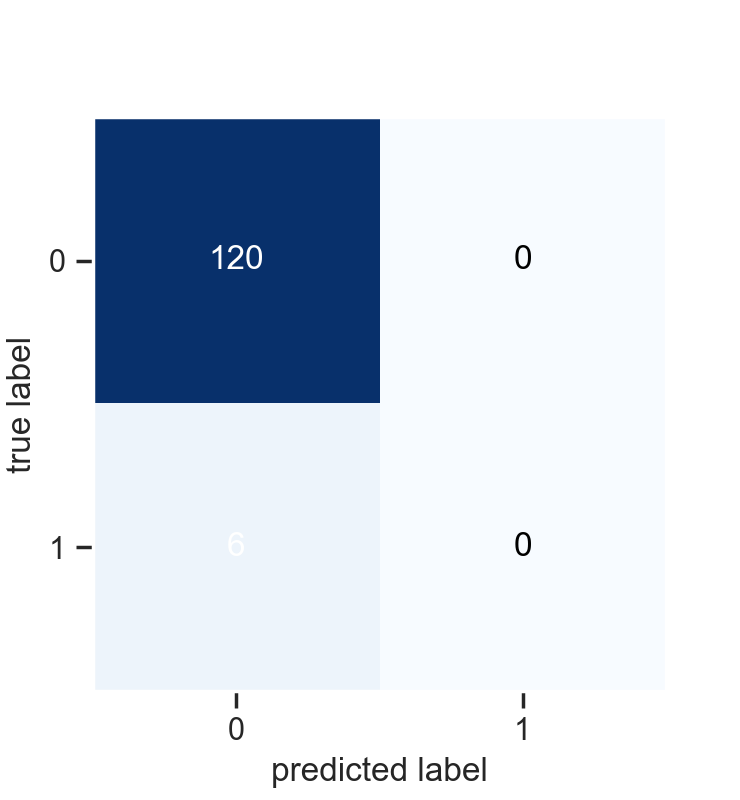

Iteration  2 :


<IPython.core.display.Javascript object>


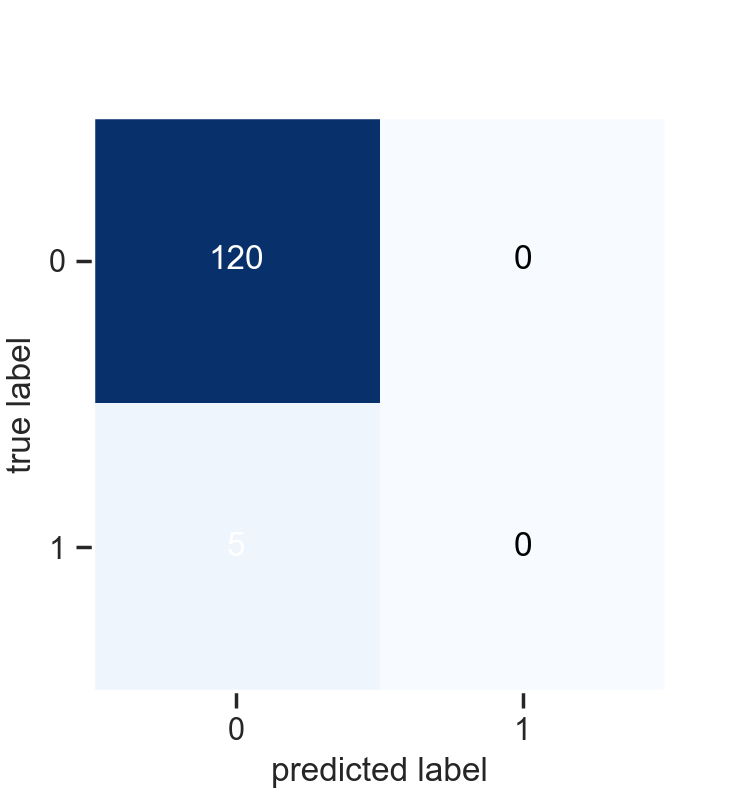

Iteration  3 :


<IPython.core.display.Javascript object>


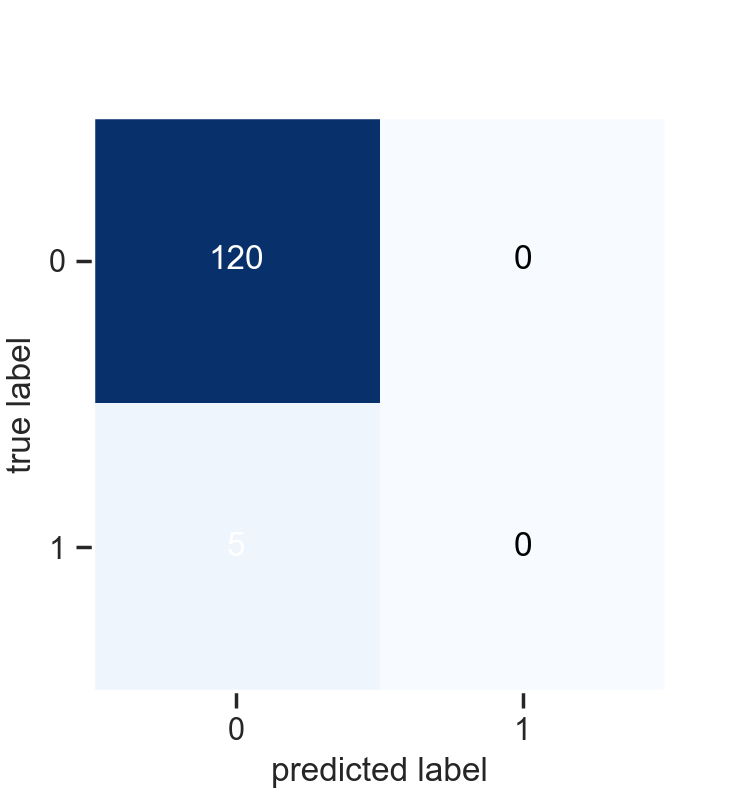

Iteration  4 :


<IPython.core.display.Javascript object>


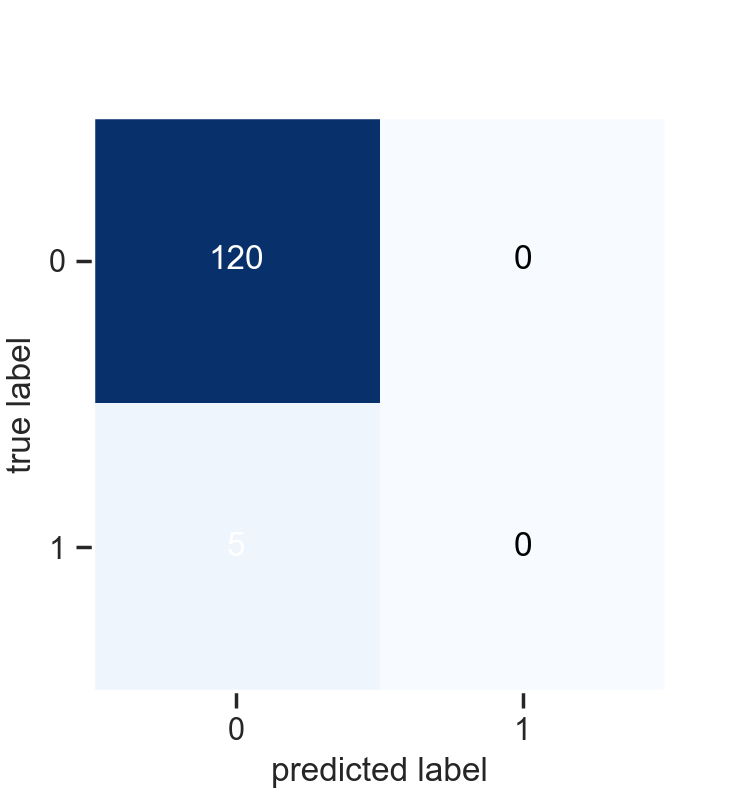

Iteration  5 :


<IPython.core.display.Javascript object>


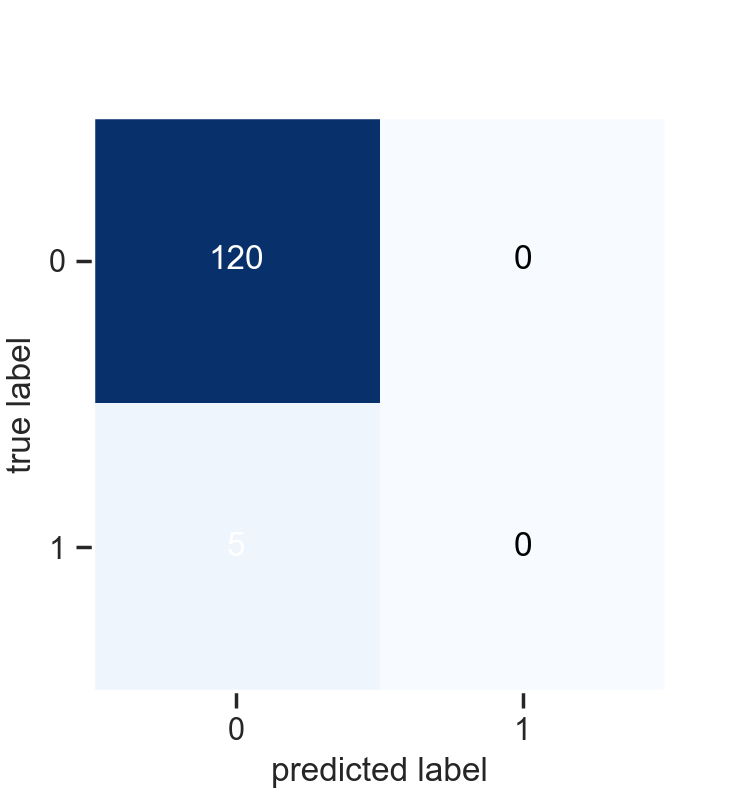

Iteration  6 :


<IPython.core.display.Javascript object>


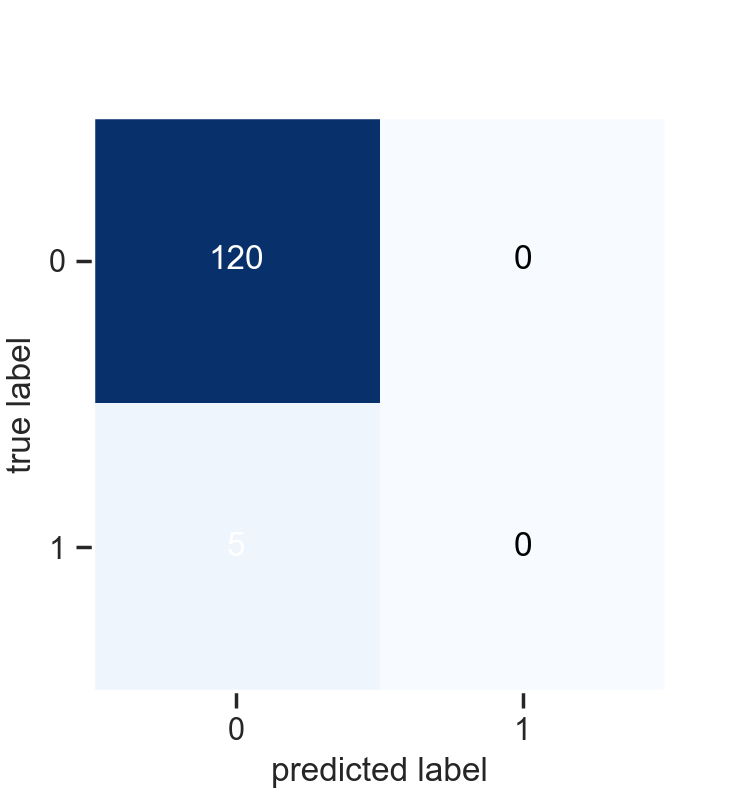

Iteration  7 :


<IPython.core.display.Javascript object>


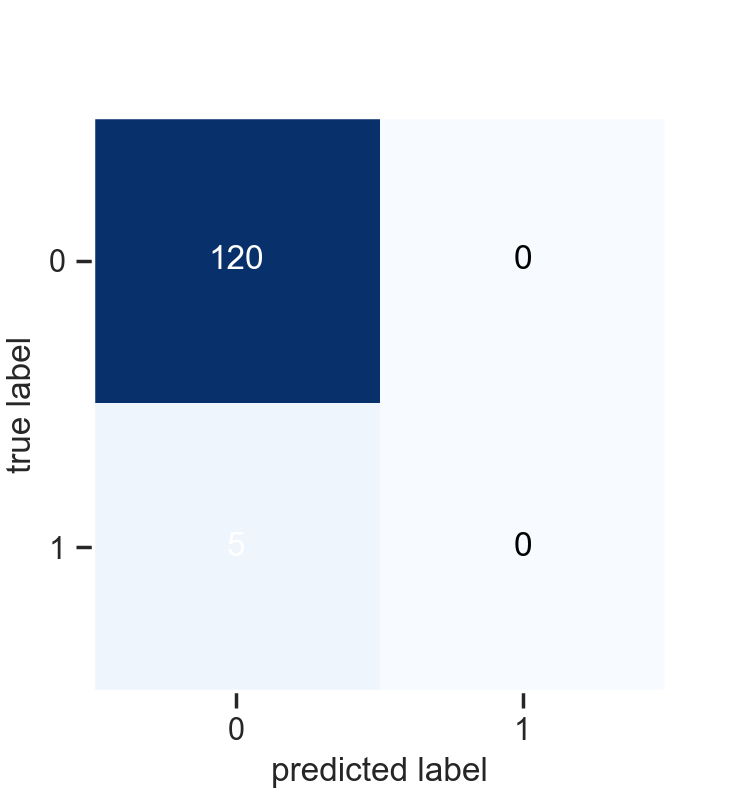

Iteration  8 :


<IPython.core.display.Javascript object>


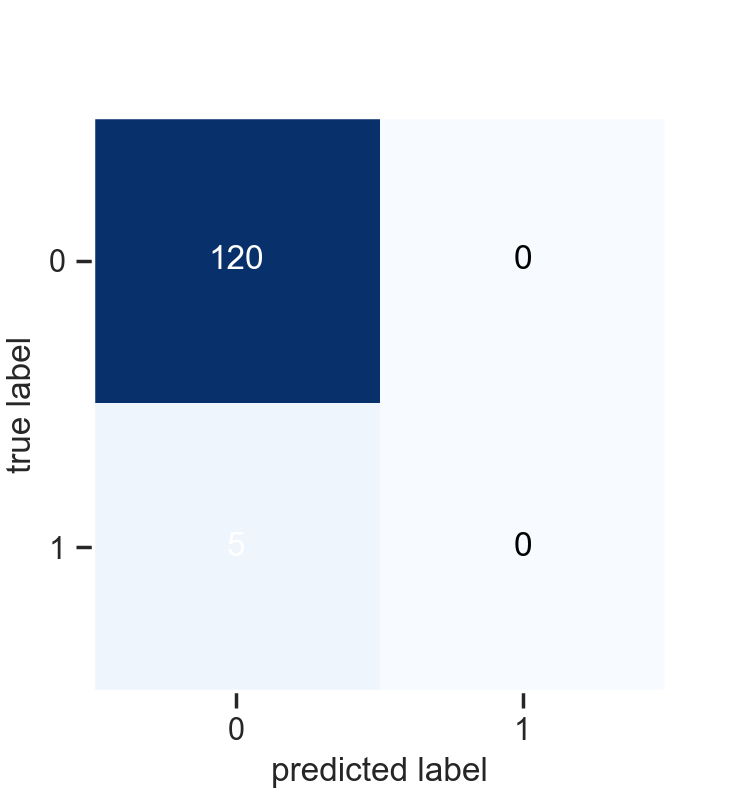

Iteration  9 :


<IPython.core.display.Javascript object>


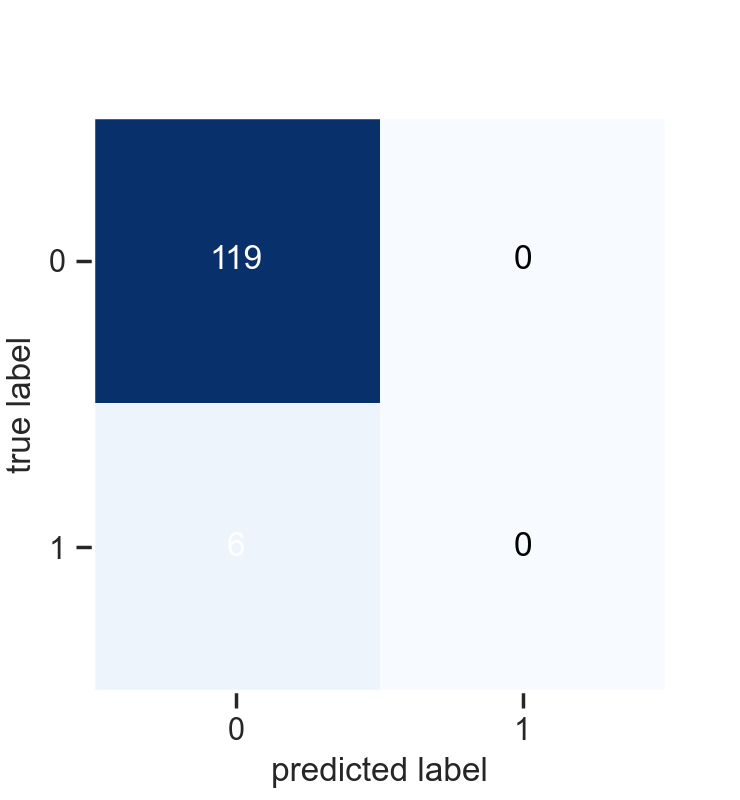

Iteration  10 :


<IPython.core.display.Javascript object>


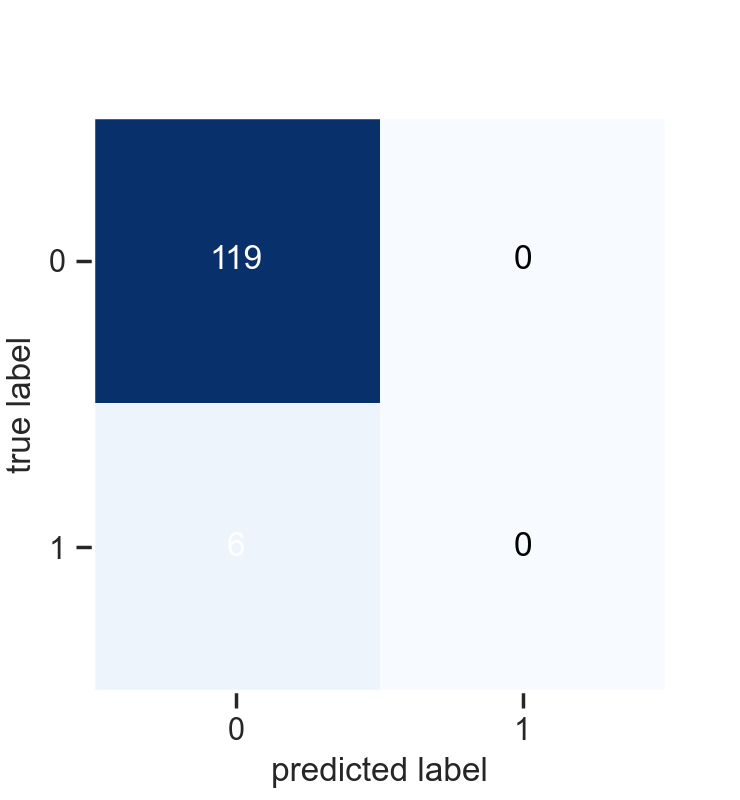

In [63]:
print("Confusion matrices of LightGBM:")
show_confusion_matrix(logReg, X, y, True, num_features)

# Random Forest and Scoring

In [64]:
# Random forest
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=10)
avg_acc_rf, min_acc_rf, max_acc_rf, avg_f1_rf, min_f1_rf, max_f1_rf = model_training_and_evaluation(rf_classifier, X, y, True, num_features, cat_features)

In [65]:
# Display result:
print("Random forest with 10-fold cross-validation:")
print("Average accuracy = ", avg_acc_rf)
print("Min accuracy = ", min_acc_rf)
print("Max accuracy = ", max_acc_rf)
print("Average F1 = ", avg_f1_rf)
print("Min F1 = ", min_f1_rf)
print("Max F1 = ", max_f1_rf)

Random forest with 10-fold cross-validation:
Average accuracy =  0.9576380952380953
Min accuracy =  0.952
Max accuracy =  0.96
Average F1 =  0.0
Min F1 =  0.0
Max F1 =  0.0


# ROC curve Random Forest

<IPython.core.display.Javascript object>


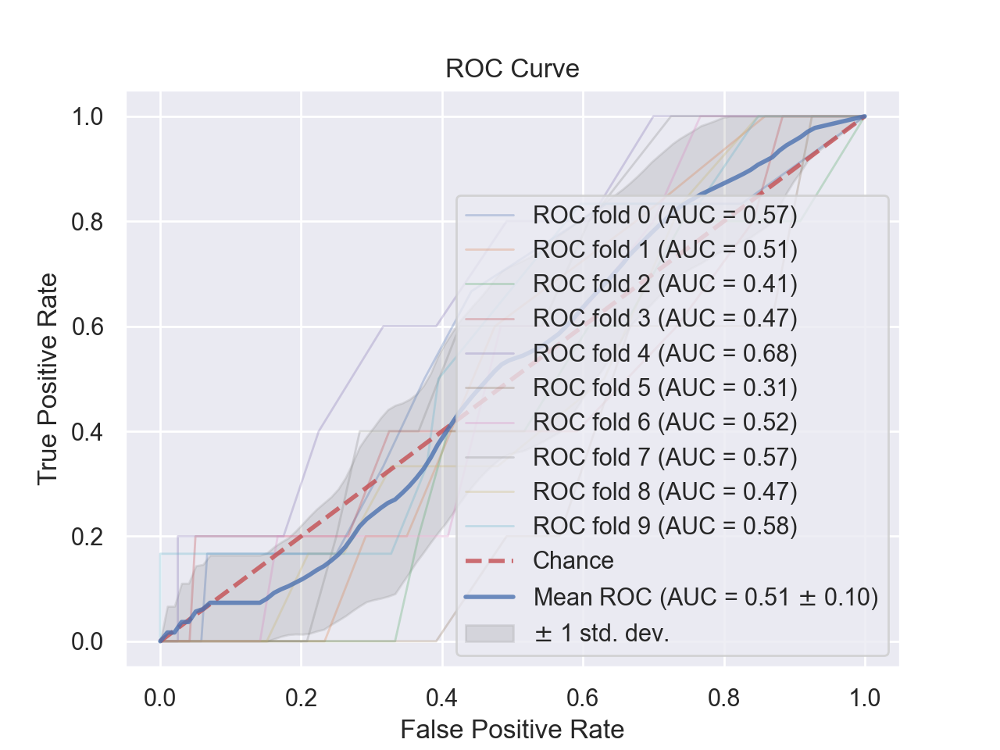

In [66]:
# Call function to draw ROC curve for XGBoost 
draw_roc_curve_cross_validation(classifier=rf_classifier, X=X, y=y, cat_features=cat_features, num_features=num_features, k_fold=10)

# Confusion matrix with n_10 splits StratifiedKFold Random Forest

Confusion matrices of Random Forest:
Iteration  1 :


<IPython.core.display.Javascript object>


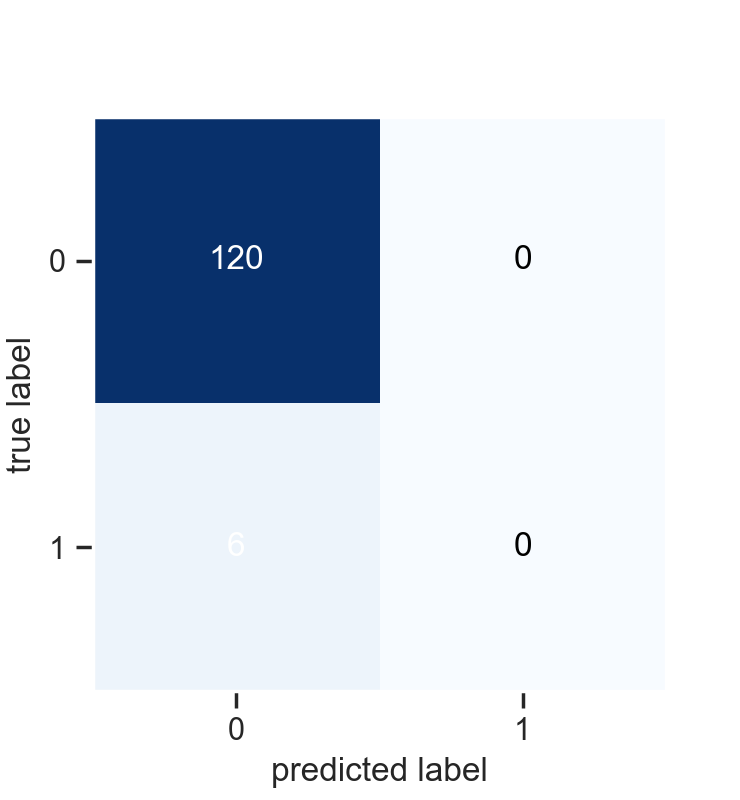

Iteration  2 :


<IPython.core.display.Javascript object>


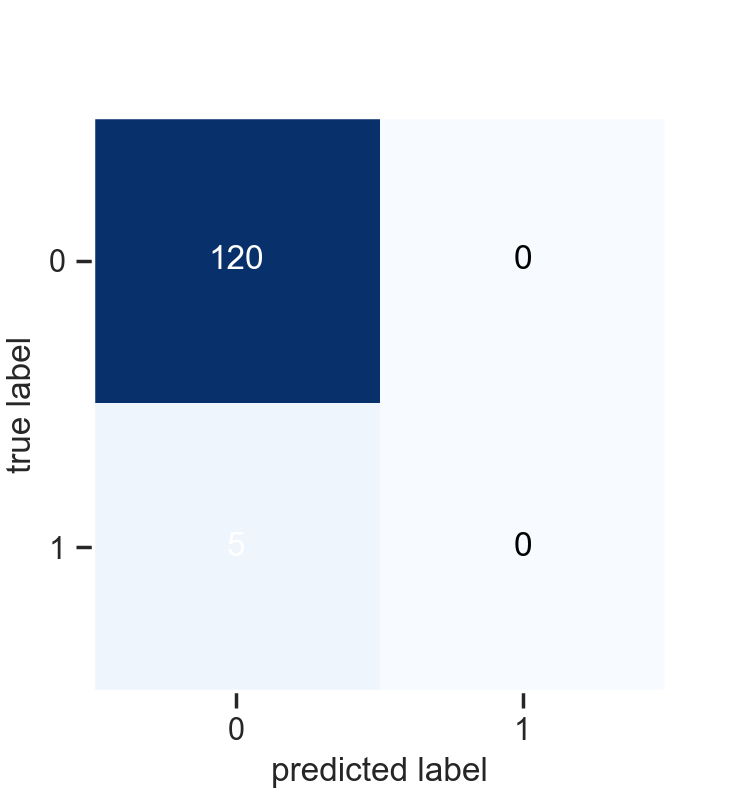

Iteration  3 :


<IPython.core.display.Javascript object>


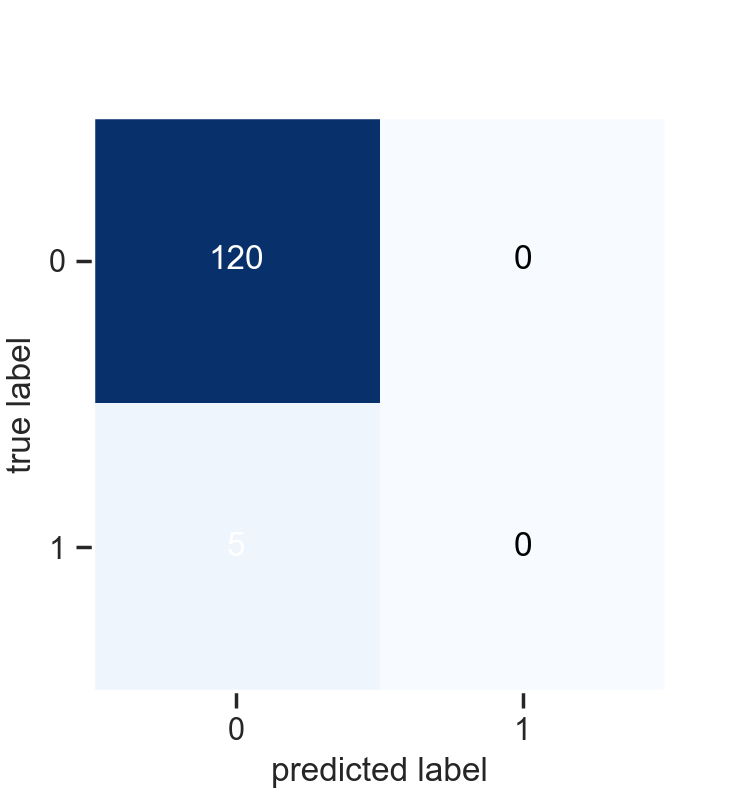

Iteration  4 :


<IPython.core.display.Javascript object>


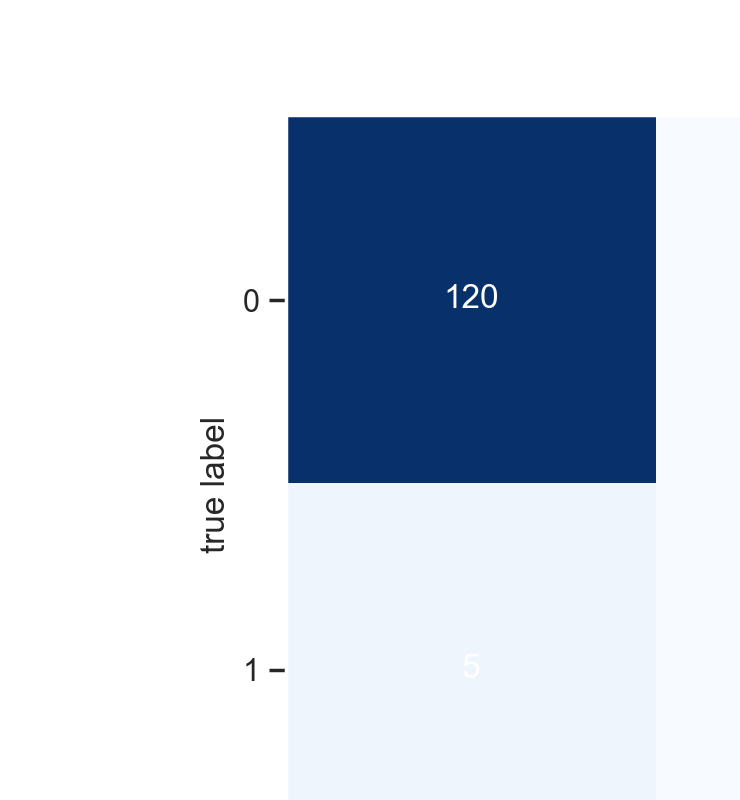

Iteration  5 :


<IPython.core.display.Javascript object>


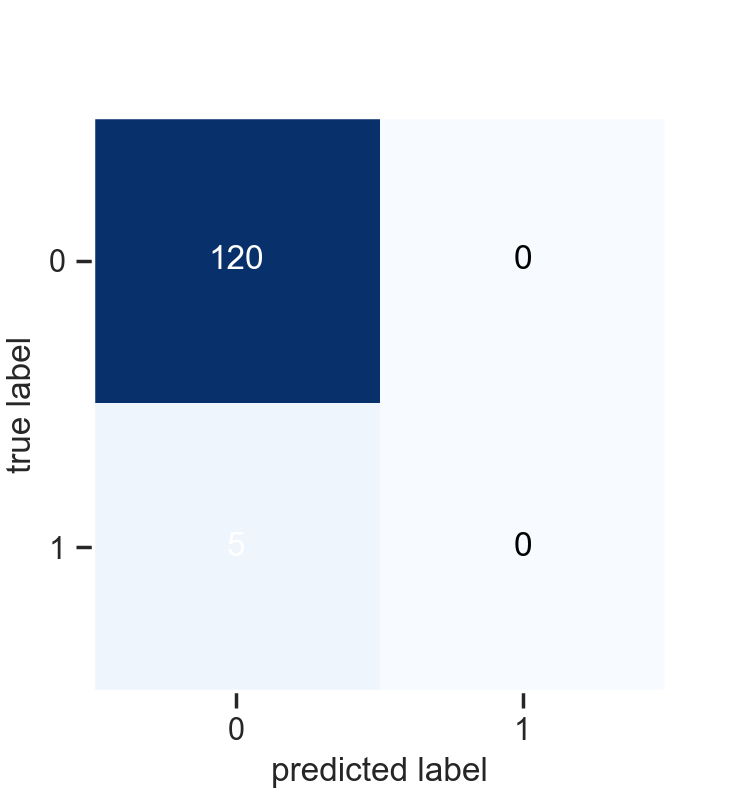

Iteration  6 :


<IPython.core.display.Javascript object>


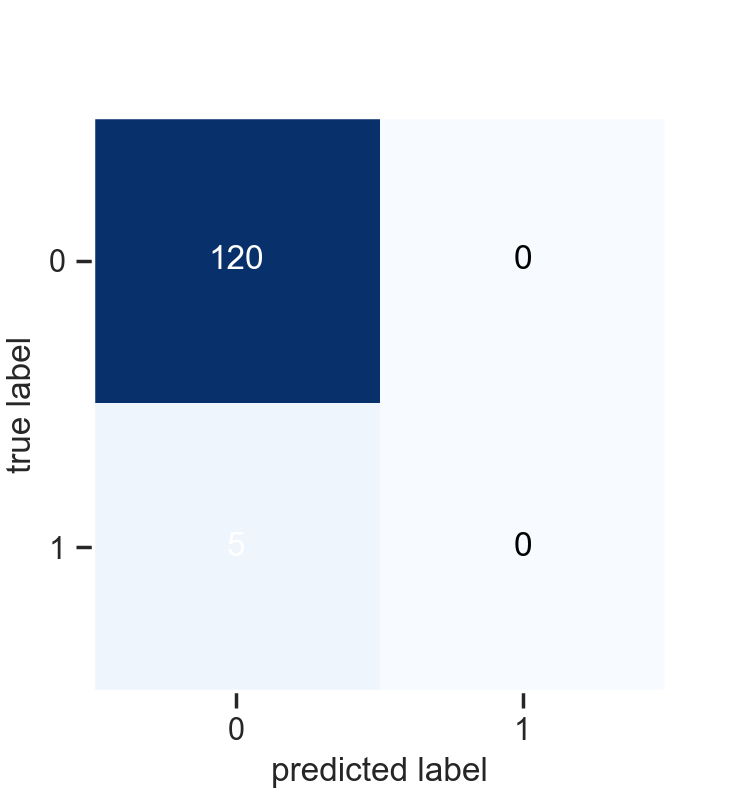

Iteration  7 :


<IPython.core.display.Javascript object>


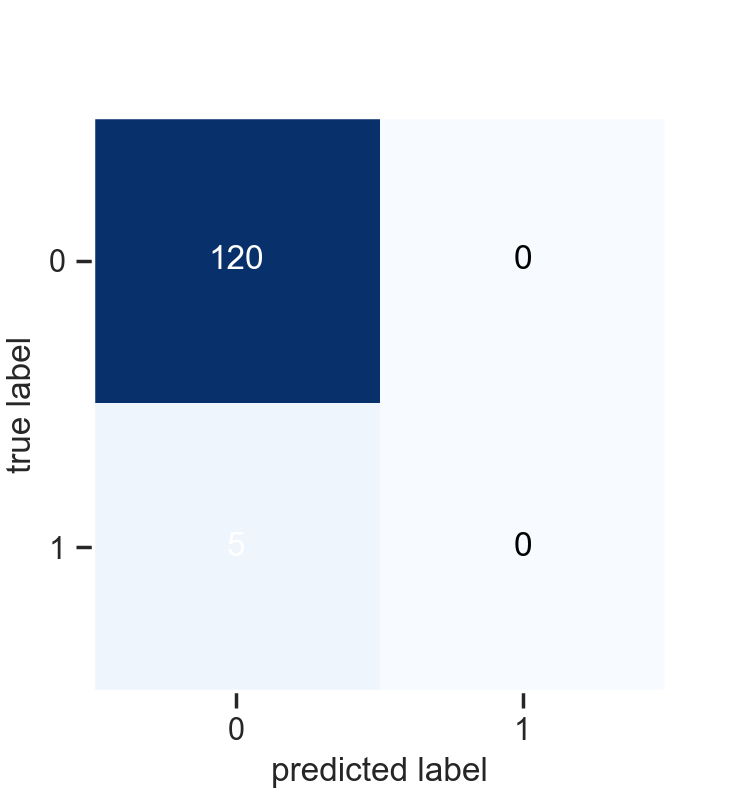

Iteration  8 :


<IPython.core.display.Javascript object>


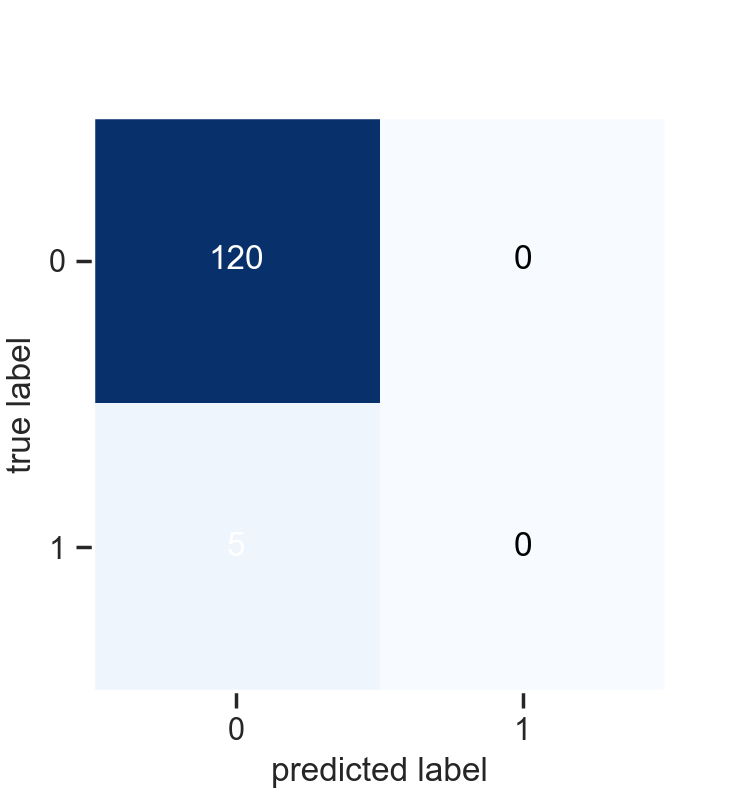

Iteration  9 :


<IPython.core.display.Javascript object>


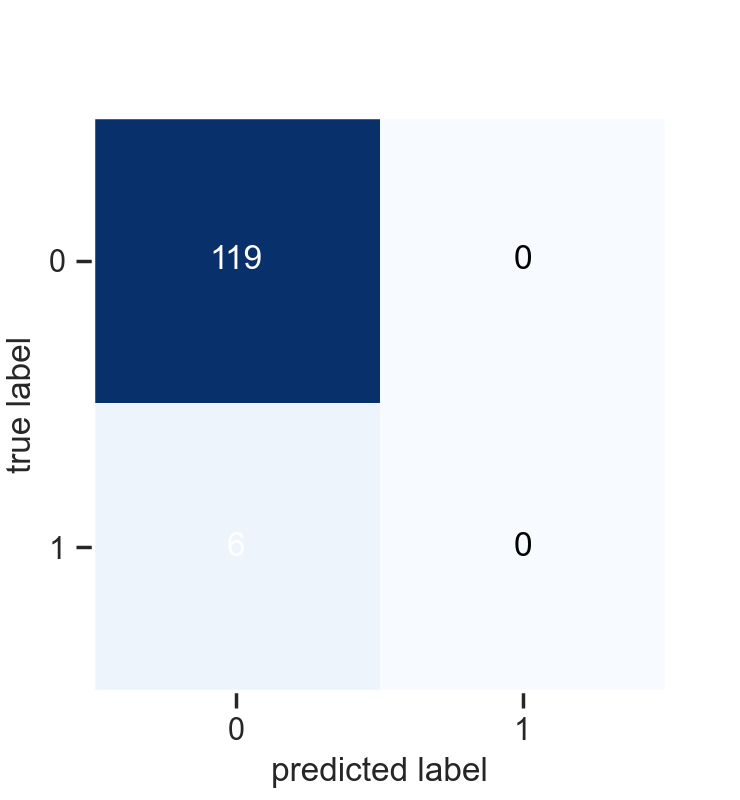

Iteration  10 :


<IPython.core.display.Javascript object>


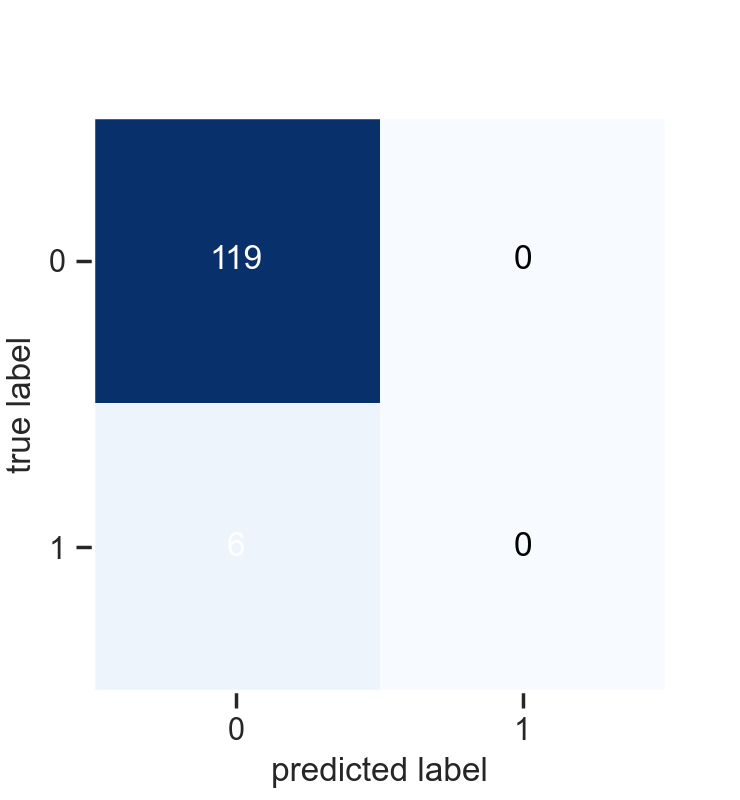

In [67]:
print("Confusion matrices of Random Forest:")
show_confusion_matrix(rf_classifier, X, y, True, num_features)

# Extremley Randomised Trees and Scoring 

In [68]:
# extremely randomised trees
# Extremely Randomized Trees
extree = ExtraTreesClassifier(n_estimators=100, random_state=10)
avg_acc_extr, min_acc_extr, max_acc_extr, avg_f1_extr, min_f1_extr, max_f1_extr = model_training_and_evaluation(extree, X, y, True, num_features, cat_features)

In [69]:
# Display result:
print("Extremely Randomized Trees with 10-fold cross-validation:")
print("Average accuracy = ", avg_acc_extr)
print("Min accuracy = ", min_acc_extr)
print("Max accuracy = ", max_acc_extr)
print("Average F1 = ", avg_f1_extr)
print("Min F1 = ", min_f1_extr)
print("Max F1 = ", max_f1_extr)

Extremely Randomized Trees with 10-fold cross-validation:
Average accuracy =  0.9576380952380953
Min accuracy =  0.952
Max accuracy =  0.96
Average F1 =  0.0
Min F1 =  0.0
Max F1 =  0.0


# ROC Curve Extremely Randomised Trees

<IPython.core.display.Javascript object>


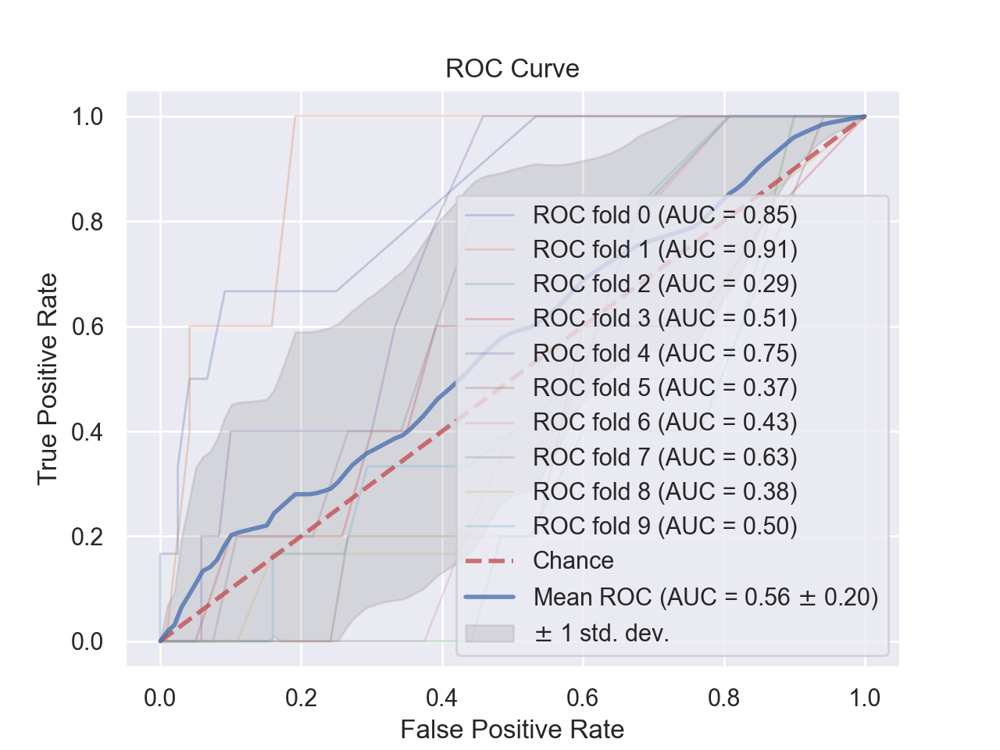

In [70]:
# Call function to draw ROC curve  
draw_roc_curve_cross_validation(classifier=extree, X=X, y=y, cat_features=cat_features, num_features=num_features, k_fold=10)

# Confusion matrix with n_10 splits StratifiedKFold Extremley Randomised Trees

Confusion matrices of Extremlely Randomised Trees:
Iteration  1 :


<IPython.core.display.Javascript object>


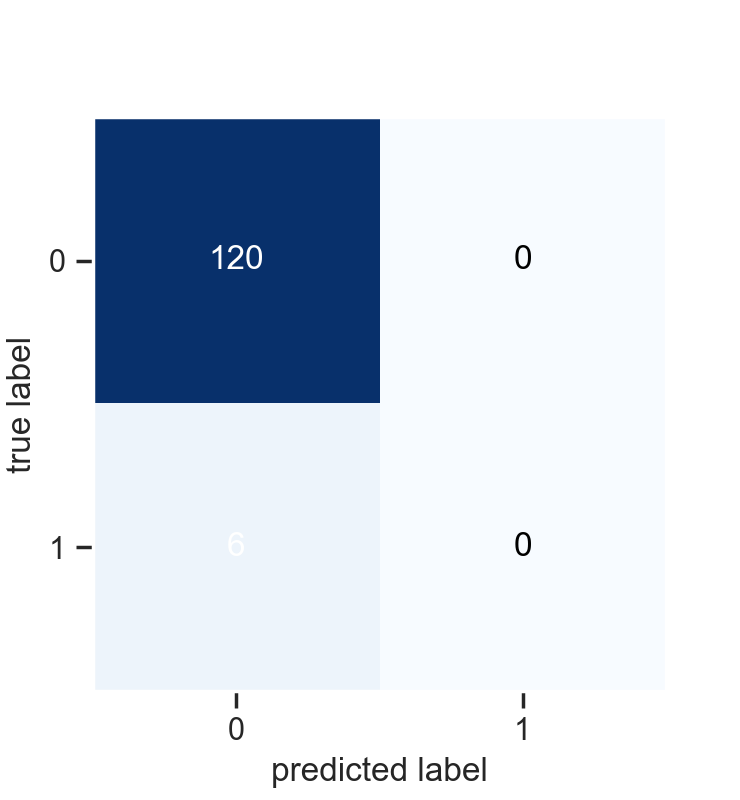

Iteration  2 :


<IPython.core.display.Javascript object>


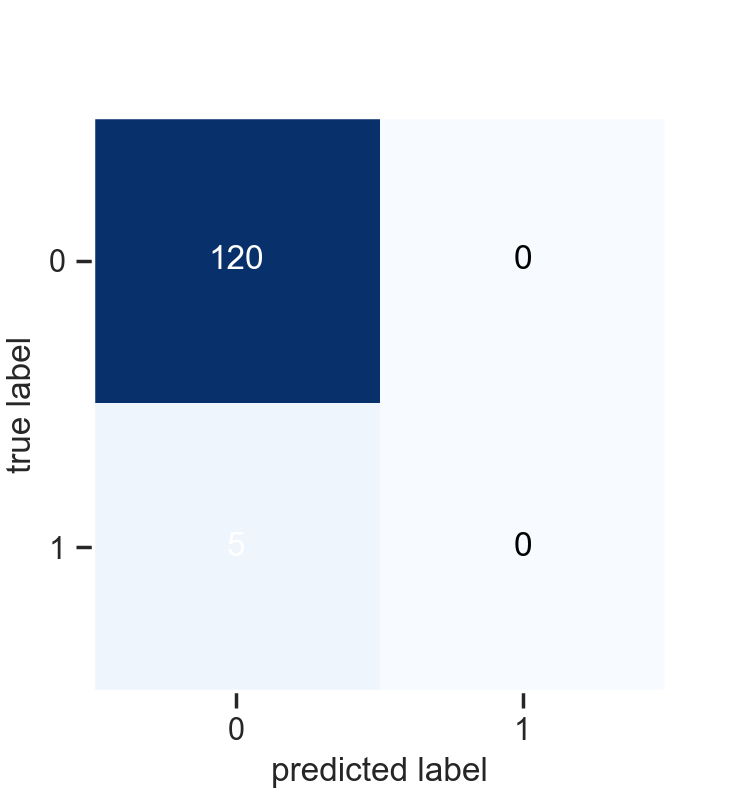

Iteration  3 :


<IPython.core.display.Javascript object>


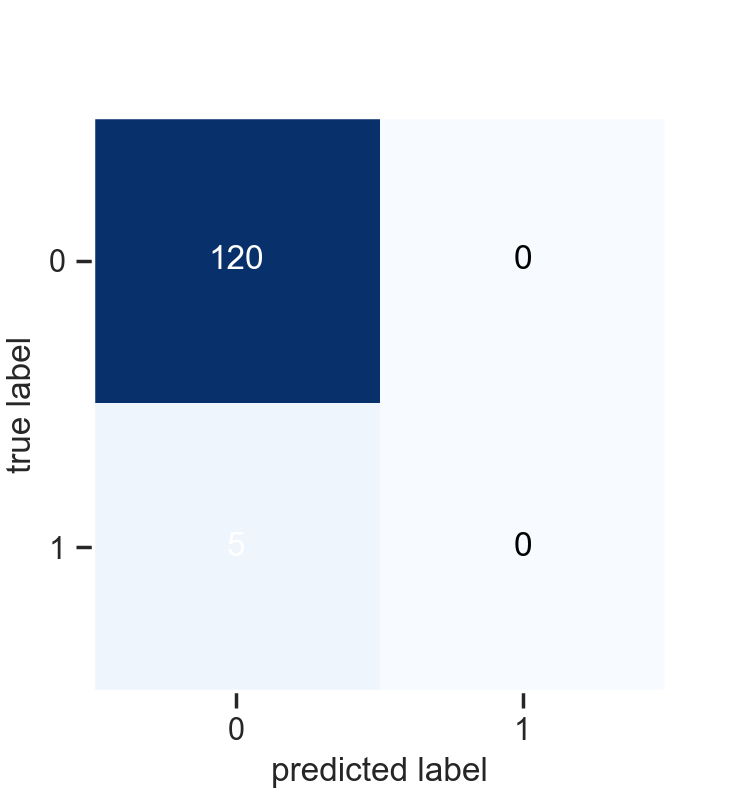

Iteration  4 :


<IPython.core.display.Javascript object>


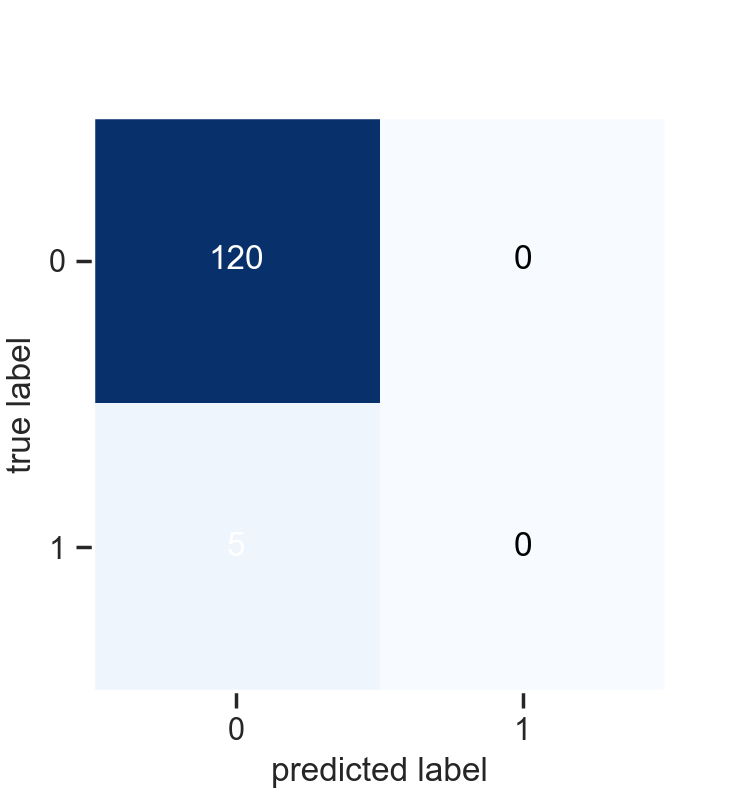

Iteration  5 :


<IPython.core.display.Javascript object>


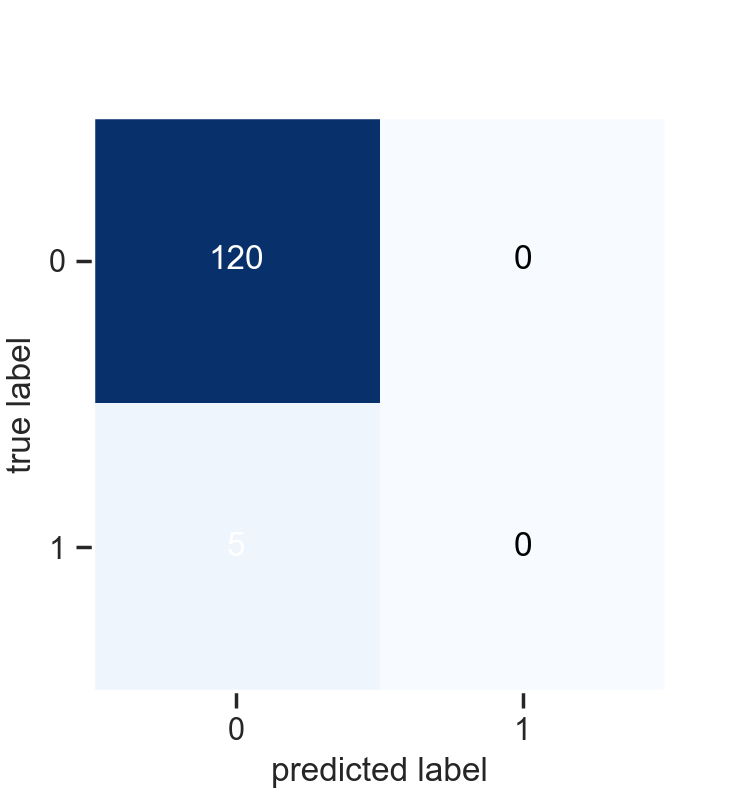

Iteration  6 :


<IPython.core.display.Javascript object>


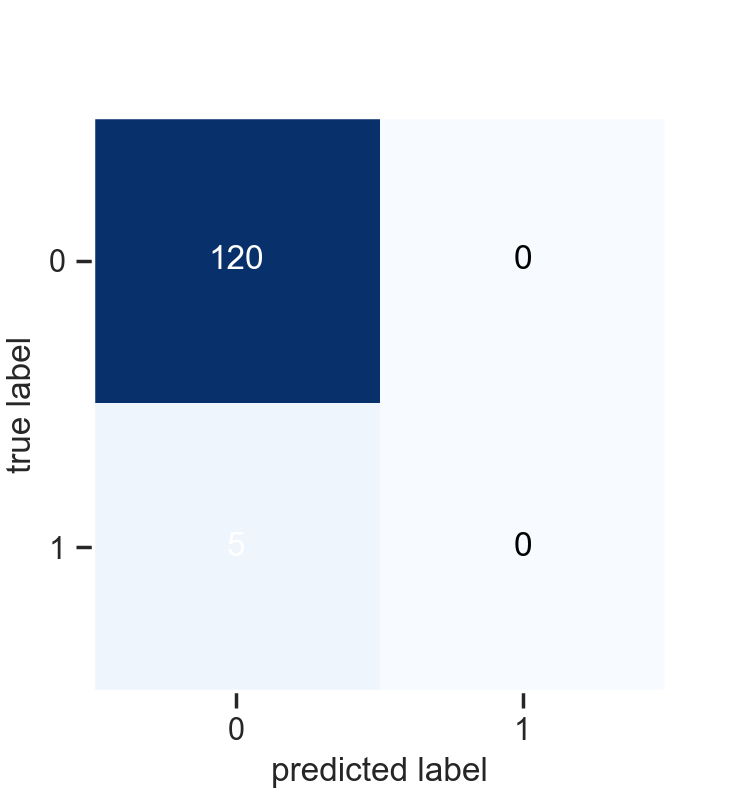

Iteration  7 :


<IPython.core.display.Javascript object>


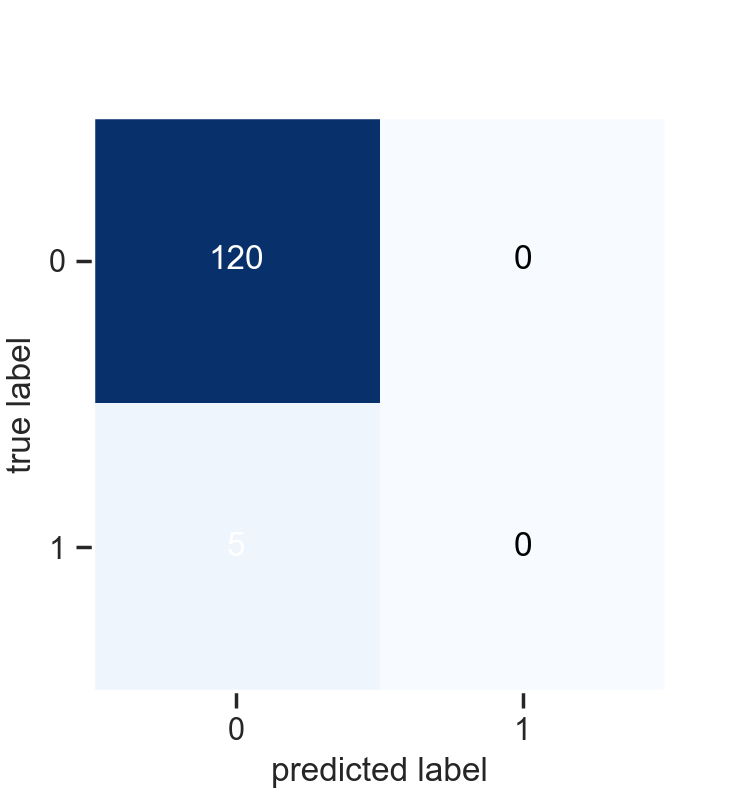

Iteration  8 :


<IPython.core.display.Javascript object>

Iteration  9 :


<IPython.core.display.Javascript object>


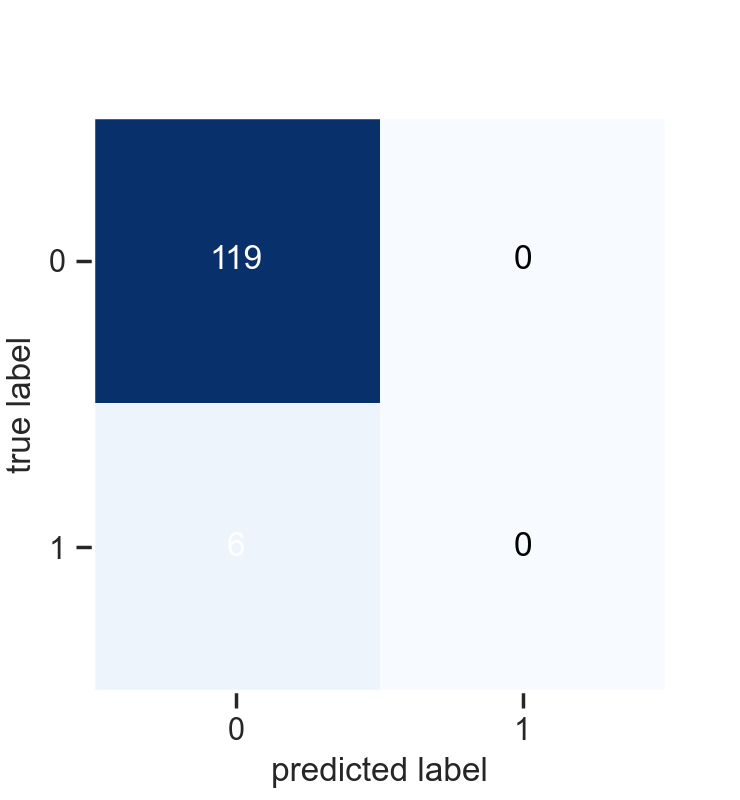

Iteration  10 :


<IPython.core.display.Javascript object>

In [71]:
print("Confusion matrices of Extremlely Randomised Trees:")
show_confusion_matrix(extree, X, y, True, num_features)

# KNN and Scoring

In [72]:
# K-nearest neighbors
knn = KNeighborsClassifier(n_neighbors=3)
avg_acc_knn, min_acc_knn, max_acc_knn, avg_f1_knn, min_f1_knn, max_f1_knn = model_training_and_evaluation(knn, X, y, True, num_features, cat_features)

In [73]:
# Display result:
print("3-nearest neighbors with 10-fold cross-validation:")
print("Average accuracy = ", avg_acc_knn)
print("Min accuracy = ", min_acc_knn)
print("Max accuracy = ", max_acc_knn)
print("Average F1 = ", avg_f1_knn)
print("Min F1 = ", min_f1_knn)
print("Max F1 = ", max_f1_knn)

3-nearest neighbors with 10-fold cross-validation:
Average accuracy =  0.9536380952380952
Min accuracy =  0.944
Max accuracy =  0.96
Average F1 =  0.0
Min F1 =  0.0
Max F1 =  0.0


# ROC Curve KNN

<IPython.core.display.Javascript object>


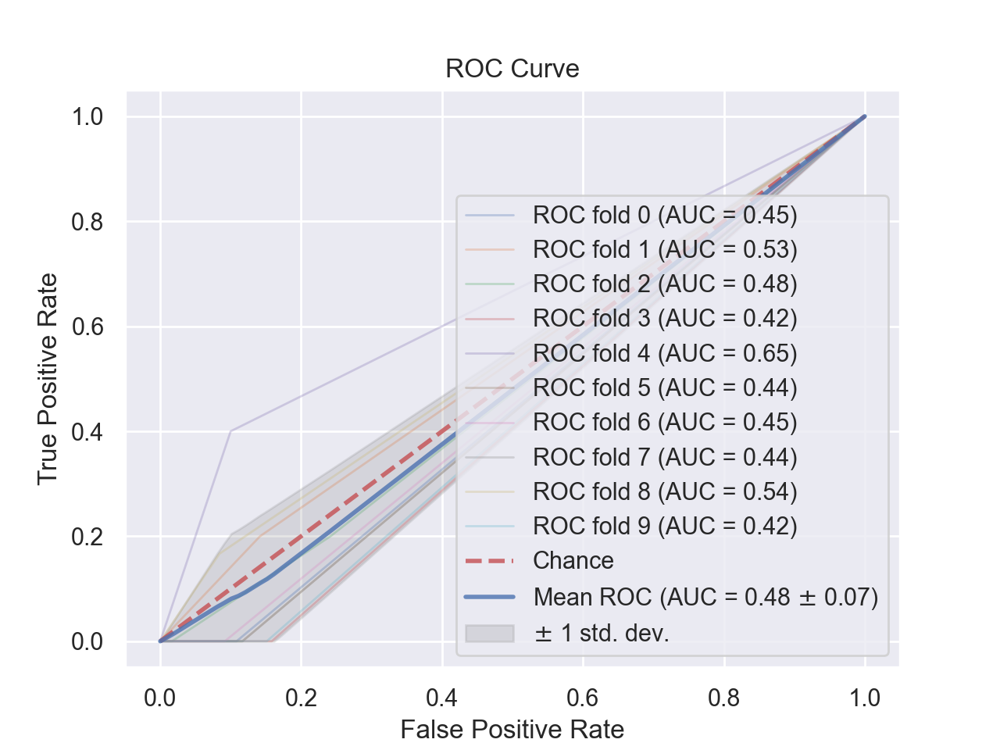

In [74]:
# Call function to draw ROC curve for XGBoost 
draw_roc_curve_cross_validation(classifier=knn, X=X, y=y, cat_features=cat_features, num_features=num_features, k_fold=10)

# Confusion matrix with n_10 splits StratifiedKFold KNN

Confusion matrices of KNN:
Iteration  1 :


<IPython.core.display.Javascript object>

Iteration  2 :


<IPython.core.display.Javascript object>


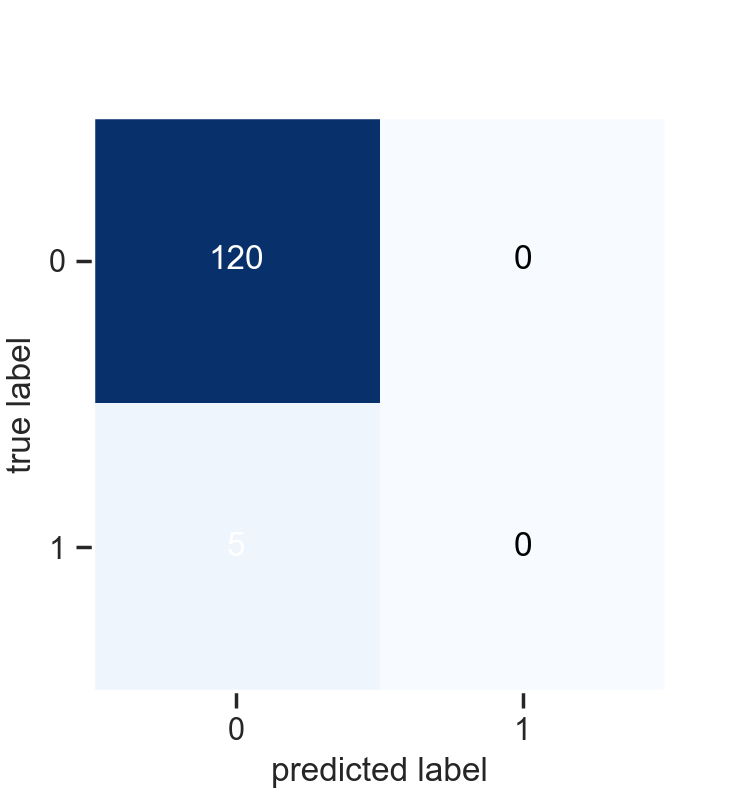

Iteration  3 :


<IPython.core.display.Javascript object>


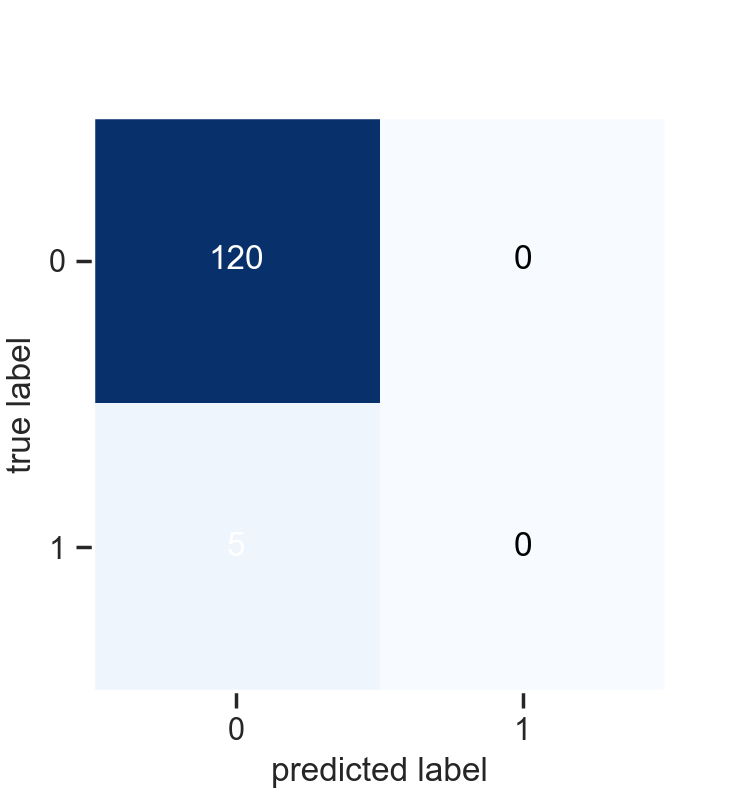

Iteration  4 :


<IPython.core.display.Javascript object>

Iteration  5 :


<IPython.core.display.Javascript object>


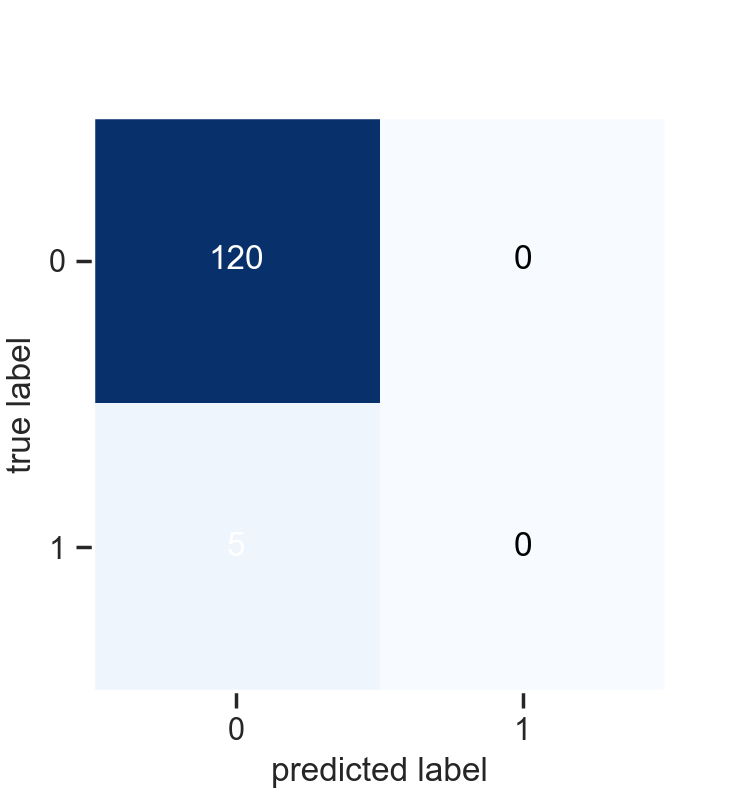

Iteration  6 :


<IPython.core.display.Javascript object>


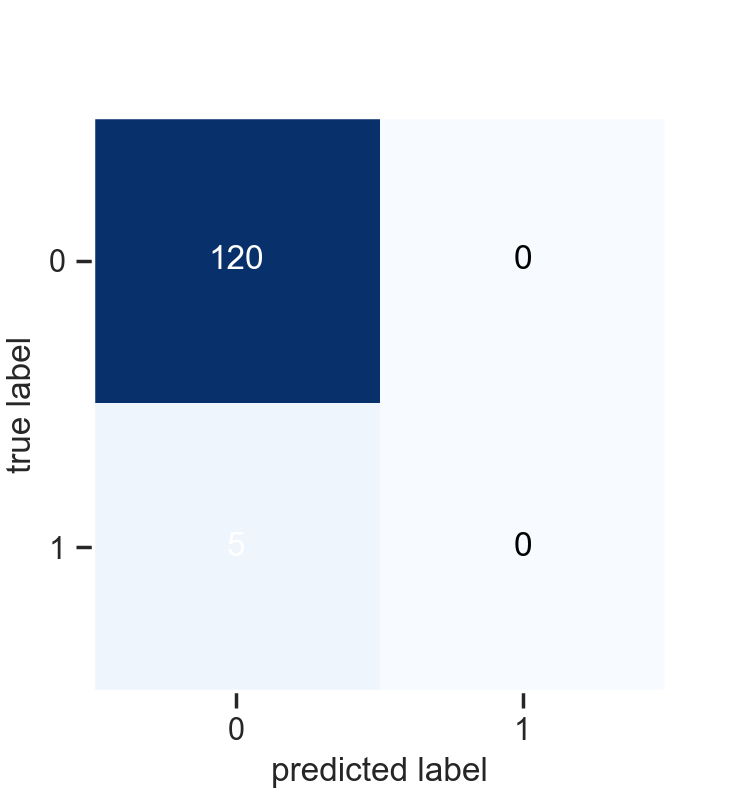

Iteration  7 :


<IPython.core.display.Javascript object>

Iteration  8 :


<IPython.core.display.Javascript object>


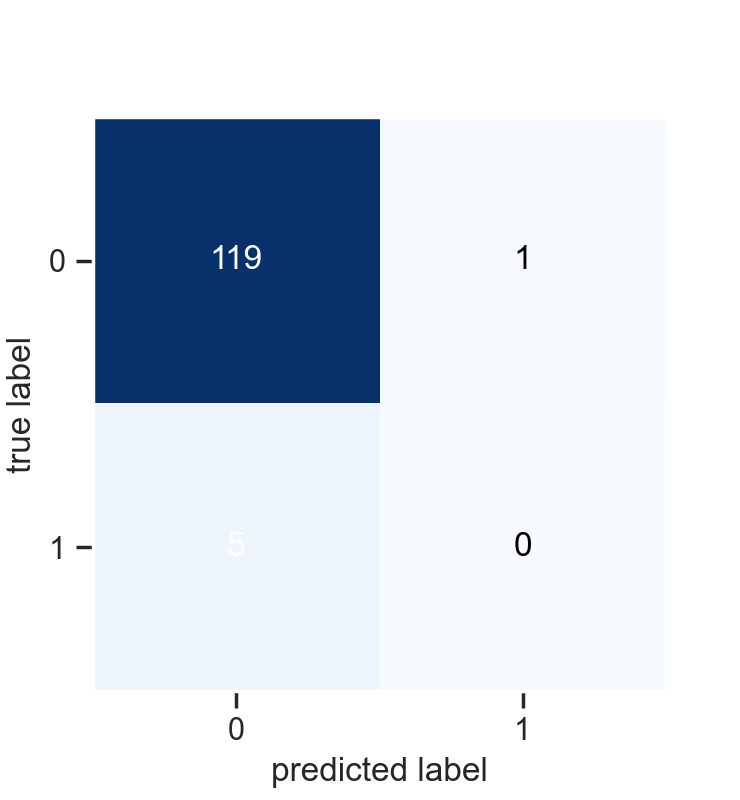

Iteration  9 :


<IPython.core.display.Javascript object>


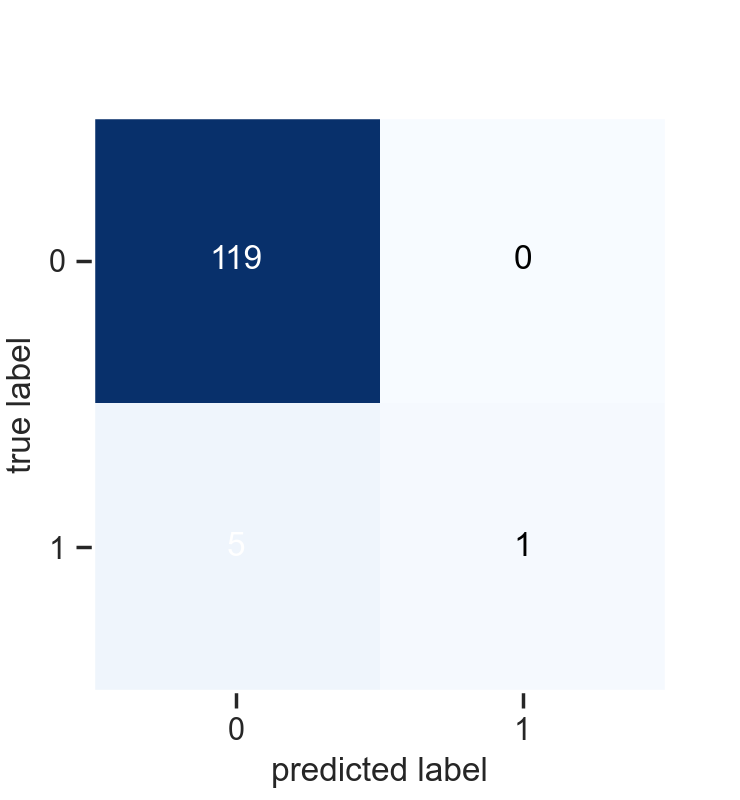

Iteration  10 :


<IPython.core.display.Javascript object>


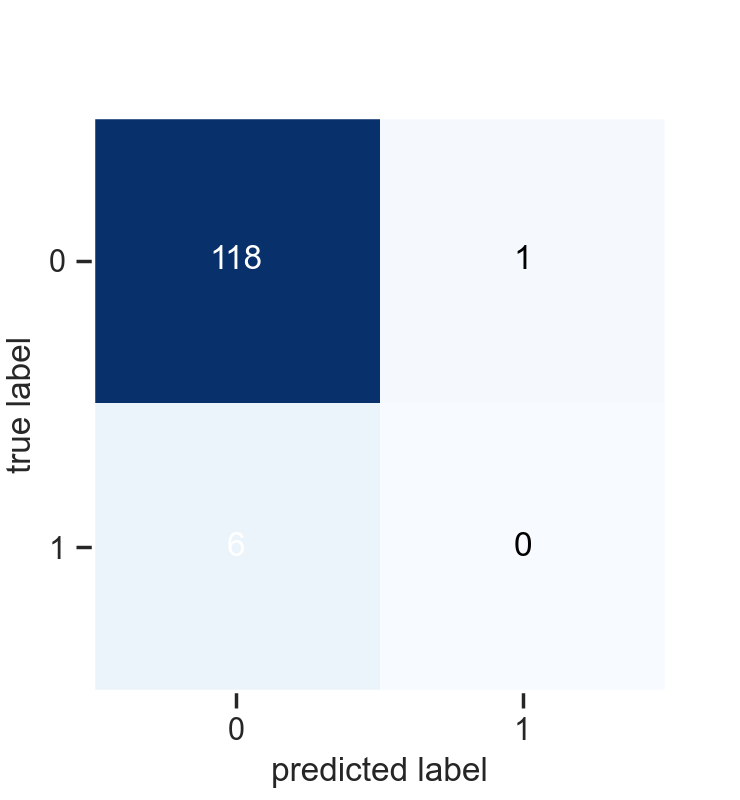

In [75]:
print("Confusion matrices of KNN:")
show_confusion_matrix(knn, X, y, True, num_features)

# Decision Tree and Scoring

In [76]:
# Decision tree
dt = DecisionTreeClassifier(random_state=10)
avg_acc_dt, min_acc_dt, max_acc_dt, avg_f1_dt, min_f1_dt, max_f1_dt = model_training_and_evaluation(dt, X, y, True, num_features, cat_features)

In [77]:
# Display result:
print("Decision tree classifier with 10-fold cross-validation:")
print("Average accuracy = ", avg_acc_dt)
print("Min accuracy = ", min_acc_dt)
print("Max accuracy = ", max_acc_dt)
print("Average F1 = ", avg_f1_dt)
print("Min F1 = ", min_f1_dt)
print("Max F1 = ", max_f1_dt)

Decision tree classifier with 10-fold cross-validation:
Average accuracy =  0.8936571428571429
Min accuracy =  0.848
Max accuracy =  0.9285714285714286
Average F1 =  0.03543474069789859
Min F1 =  0.0
Max F1 =  0.15384615384615385


# ROC Curve Decision Tree

<IPython.core.display.Javascript object>


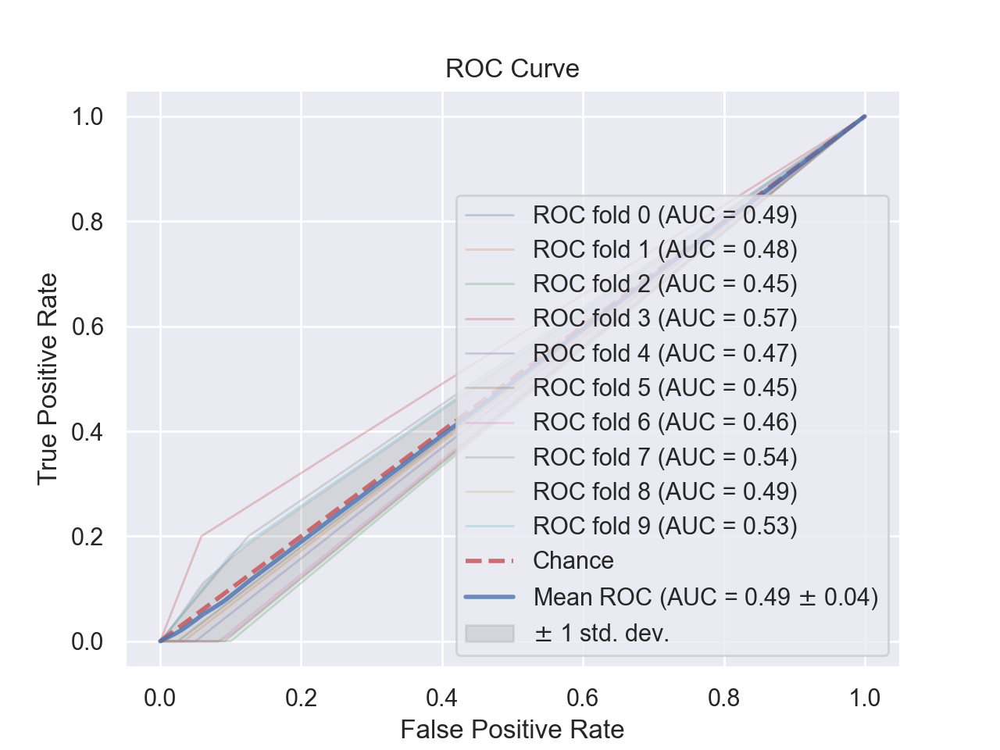

In [78]:
# Call function to draw ROC curve for XGBoost 
draw_roc_curve_cross_validation(classifier=dt, X=X, y=y, cat_features=cat_features, num_features=num_features, k_fold=10)

# Confusion matrix with n_10 splits StratifiedKFold Decision Tree

Confusion matrices of Decision Tree:
Iteration  1 :


<IPython.core.display.Javascript object>


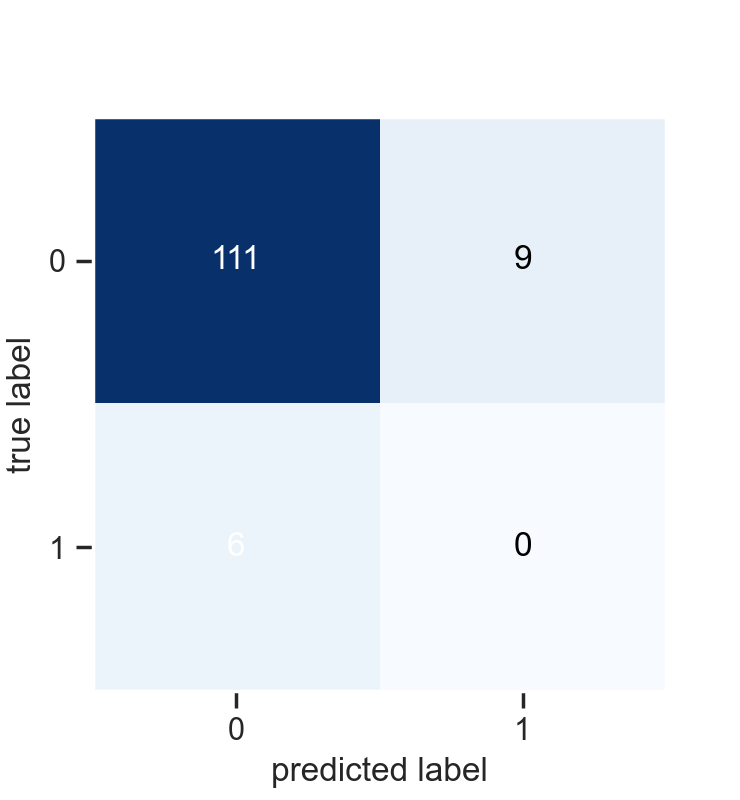

Iteration  2 :


<IPython.core.display.Javascript object>

Iteration  3 :


<IPython.core.display.Javascript object>

Iteration  4 :


<IPython.core.display.Javascript object>

Iteration  5 :


<IPython.core.display.Javascript object>

Iteration  6 :


<IPython.core.display.Javascript object>


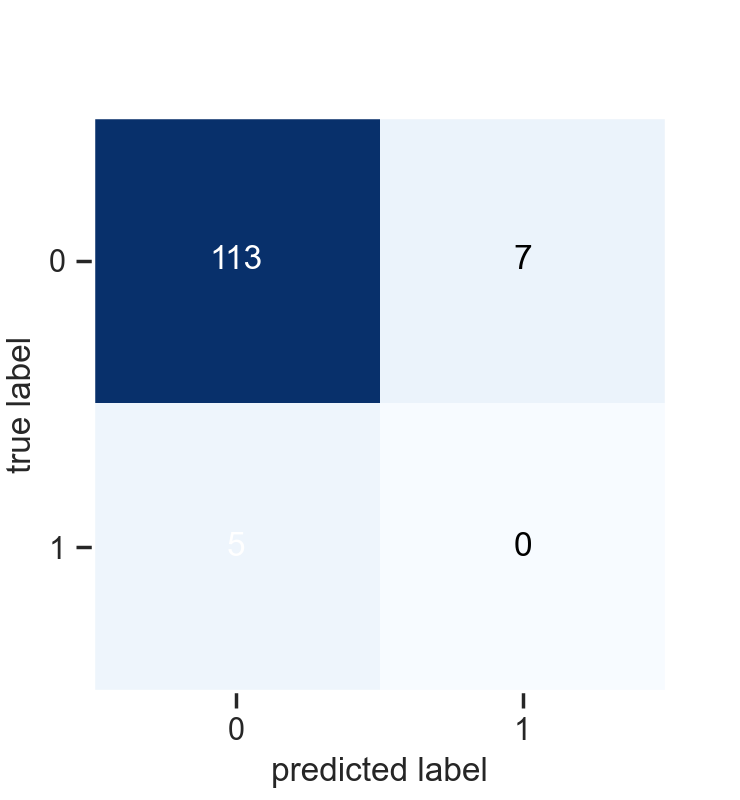

Iteration  7 :


<IPython.core.display.Javascript object>


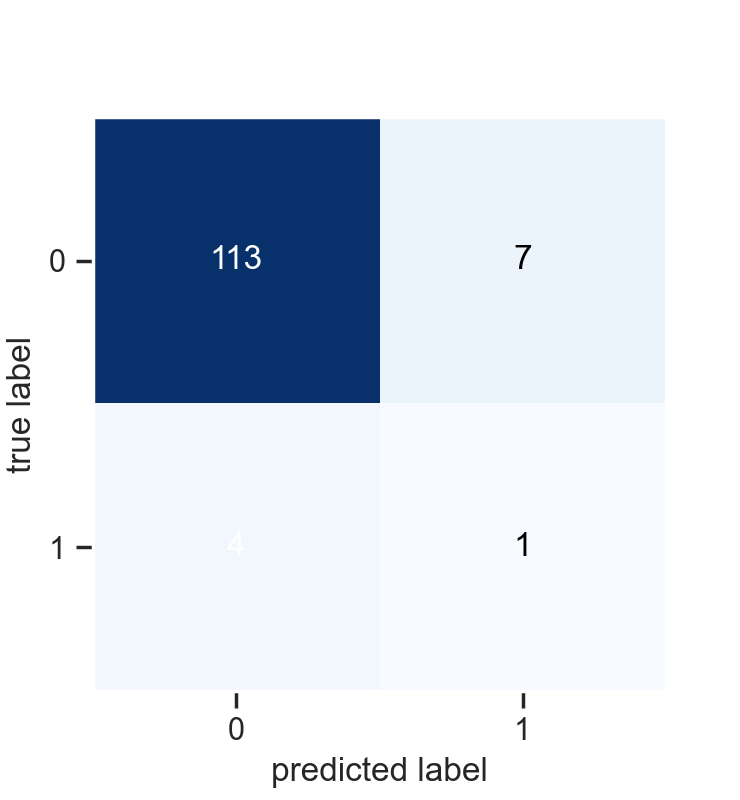

Iteration  8 :


<IPython.core.display.Javascript object>


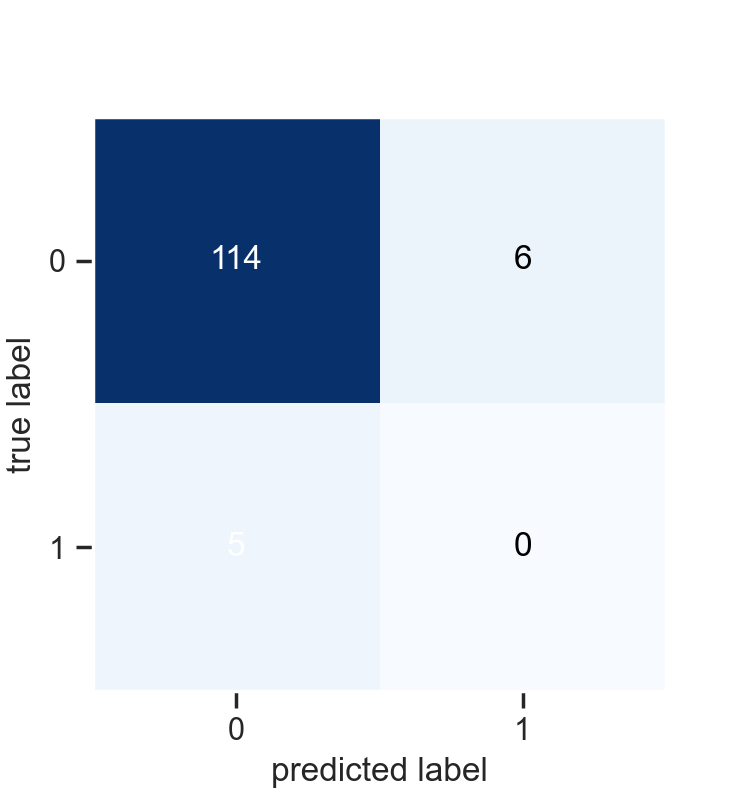

Iteration  9 :


<IPython.core.display.Javascript object>


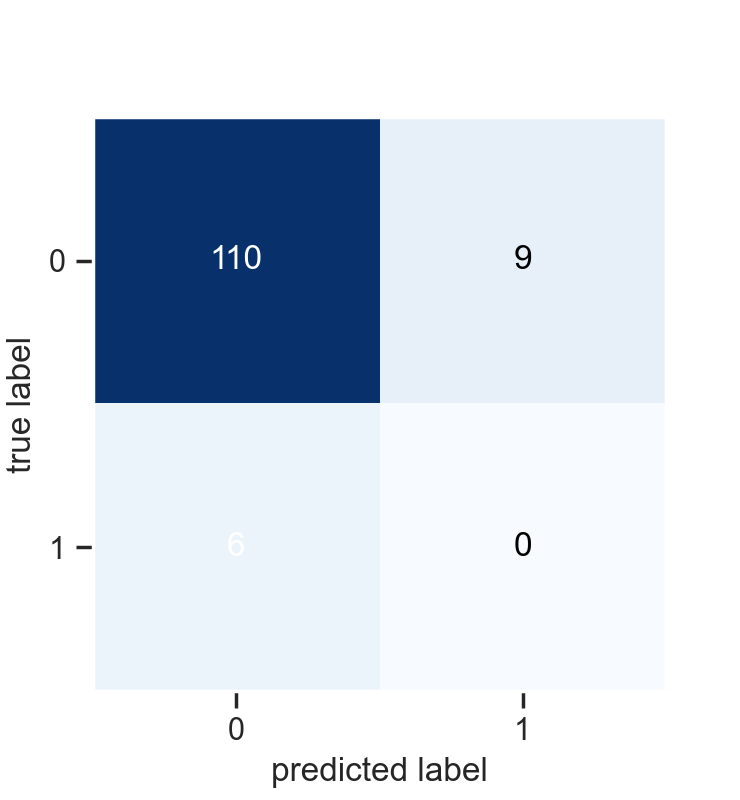

Iteration  10 :


<IPython.core.display.Javascript object>


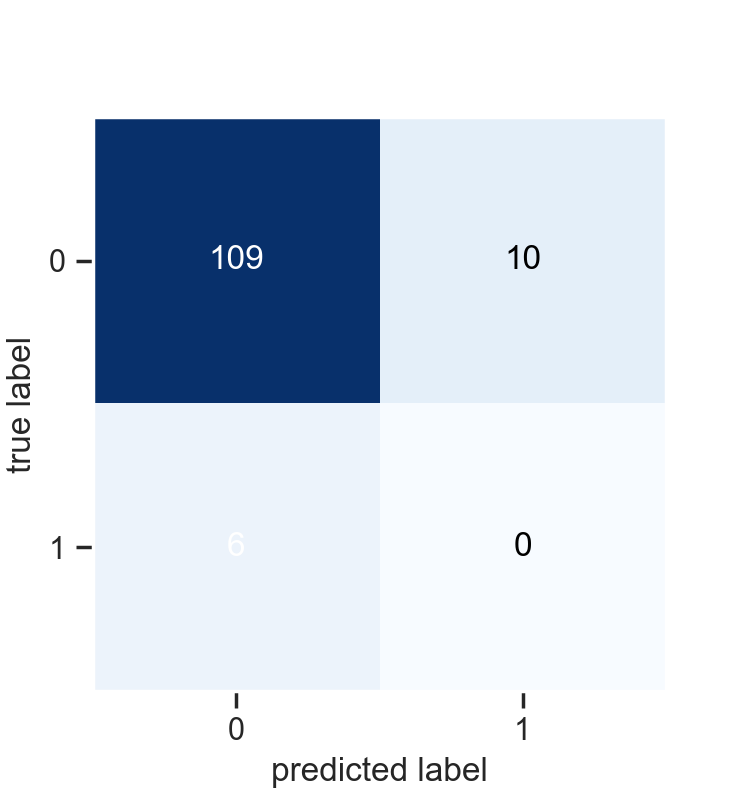

In [79]:
print("Confusion matrices of Decision Tree:")
show_confusion_matrix(dt, X, y, True, num_features)

# Gaussian Naive Bayes and Scoring 

In [80]:
# Gaussian Naive Bayes
gnb = GaussianNB()
avg_acc_gnb, min_acc_gnb, max_acc_gnb, avg_f1_gnb, min_f1_gnb, max_f1_gnb = model_training_and_evaluation(gnb, X, y, True, num_features, cat_features)

In [81]:
# Gaussian Naive Bayes result:
print("Gaussian Naive Bayes classifier with 10-fold cross-validation:")
print("Average accuracy = ", avg_acc_gnb)
print("Min accuracy = ", min_acc_gnb)
print("Max accuracy = ", max_acc_gnb)
print("Average F1 = ", avg_f1_gnb)
print("Min F1 = ", min_f1_gnb)
print("Max F1 = ", max_f1_gnb)

Gaussian Naive Bayes classifier with 10-fold cross-validation:
Average accuracy =  0.7336380952380952
Min accuracy =  0.2
Max accuracy =  0.9523809523809523
Average F1 =  0.046769046680272555
Min F1 =  0.0
Max F1 =  0.12903225806451613


# ROC Curve Gaussian Naive Bayes

In [82]:
# Call function to draw ROC curve for GNB 
draw_roc_curve_cross_validation(classifier=gnb, X=X, y=y, cat_features=cat_features, num_features=num_features, k_fold=10)

<IPython.core.display.Javascript object>

# Confusion matrix with n_10 splits StratifiedKFold GNB

Iteration  3 :


<IPython.core.display.Javascript object>


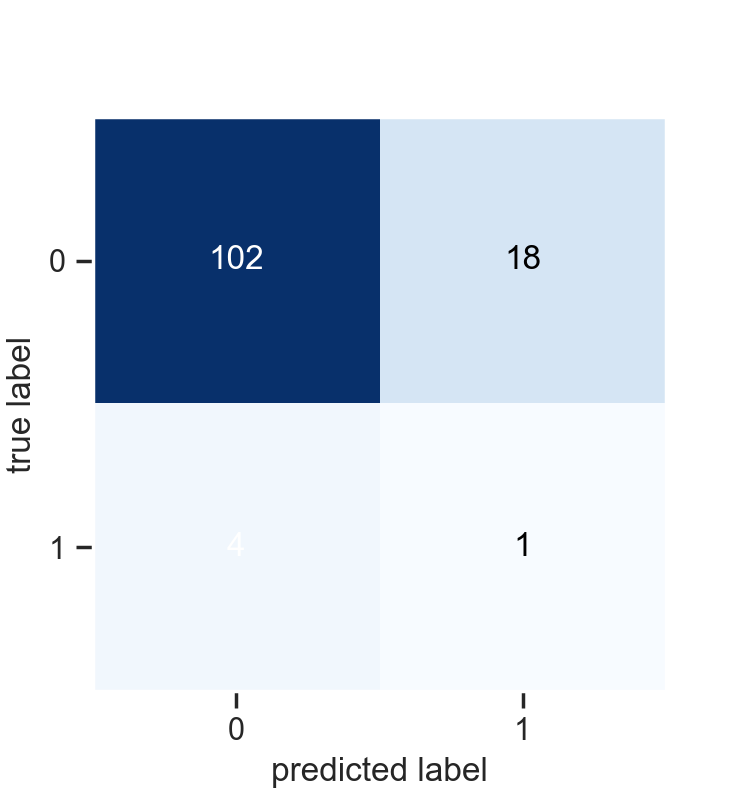

Iteration  4 :


<IPython.core.display.Javascript object>


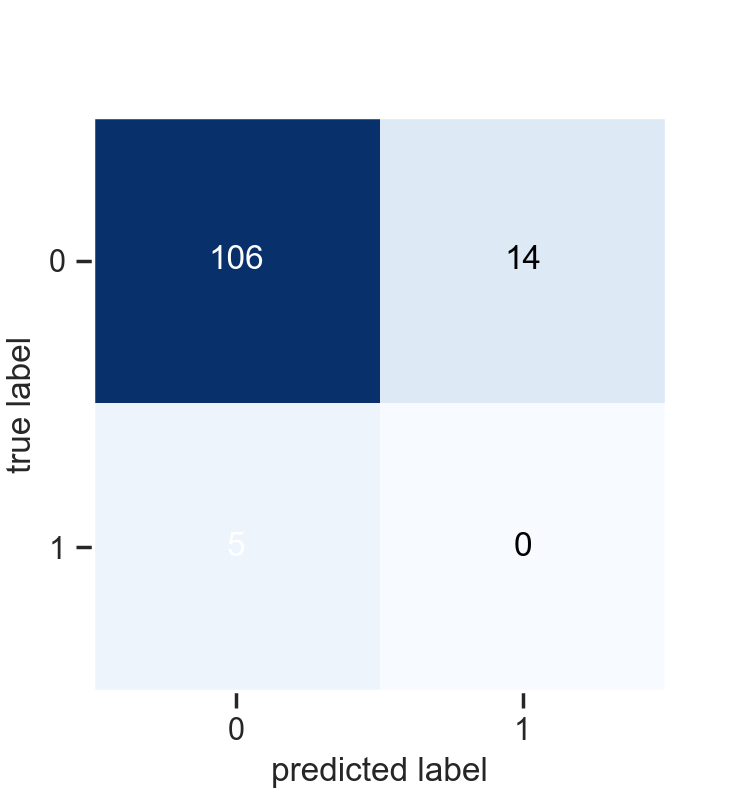

Iteration  5 :


<IPython.core.display.Javascript object>


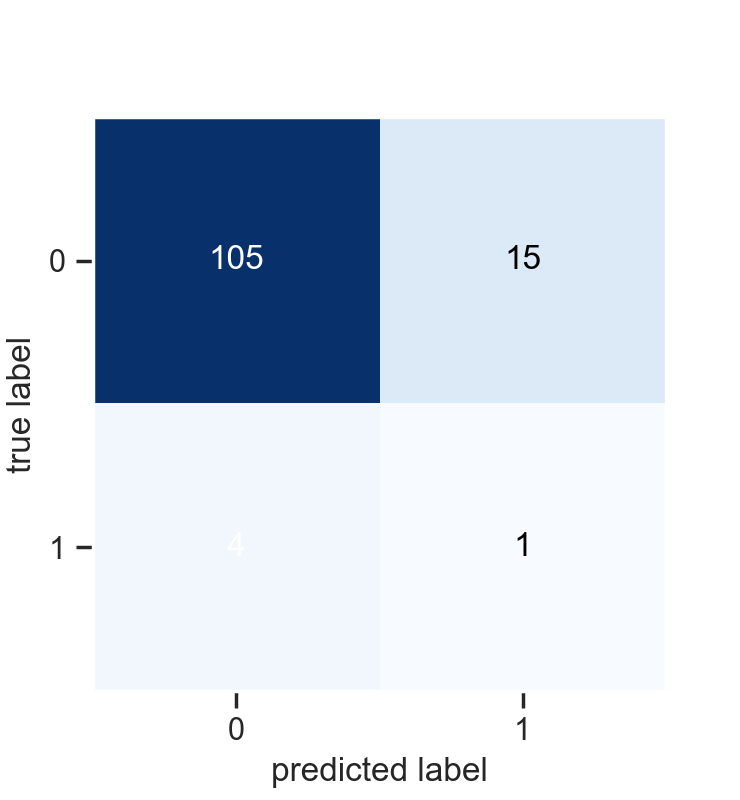

Iteration  6 :


<IPython.core.display.Javascript object>


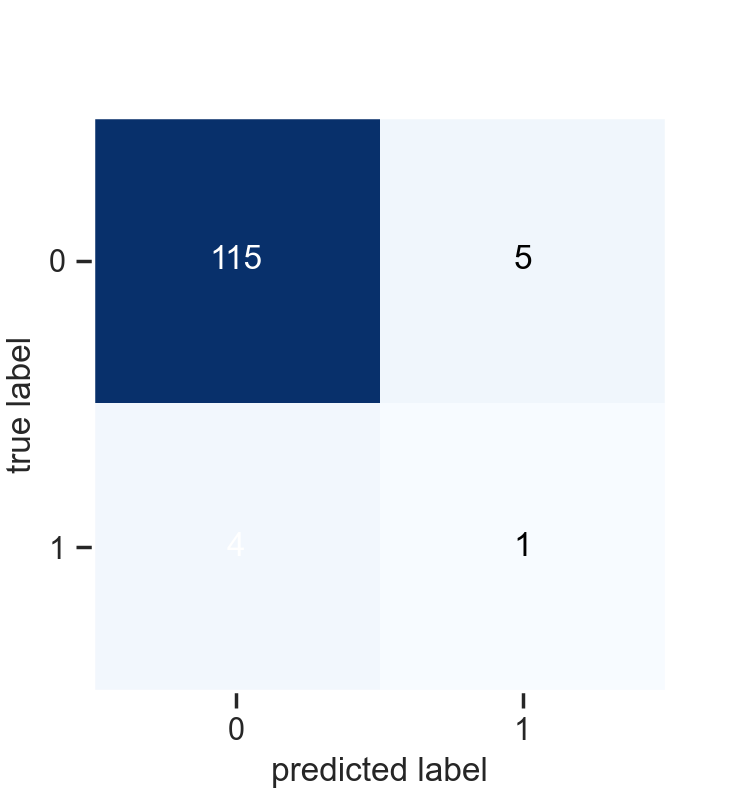

Iteration  7 :


<IPython.core.display.Javascript object>


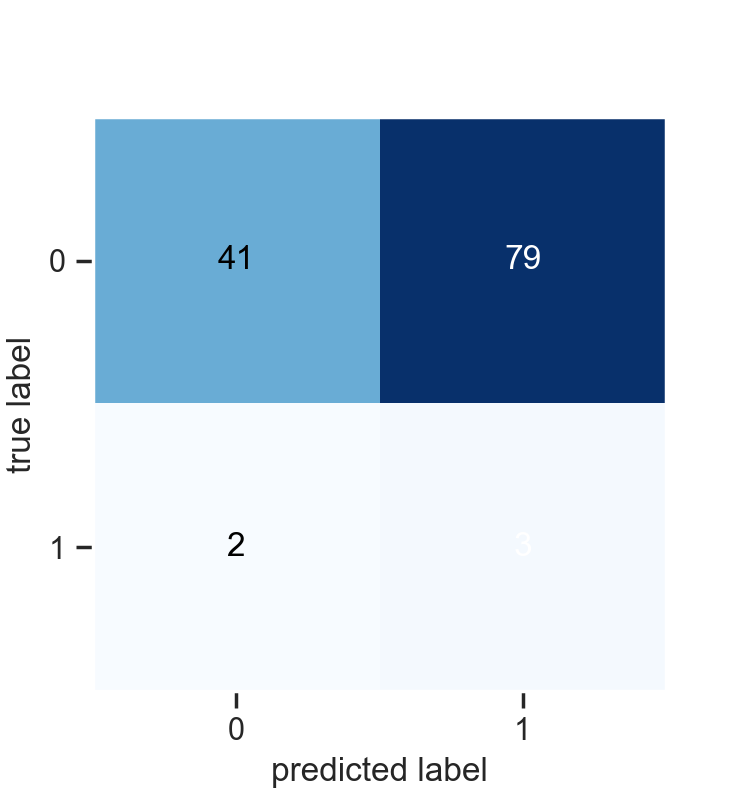

In [83]:
print("Confusion matrices of Gaussian Naive Bayes:")
show_confusion_matrix(gnb, X, y, True, num_features)

# Gaussian Process and Scoring

In [87]:
# Gaussian Process Classifier
from sklearn.gaussian_process.kernels import RBF
gpc = GaussianProcessClassifier(kernel=1.0 * RBF(length_scale=1.0))
avg_acc_gpc, min_acc_gpc, max_acc_gpc, avg_f1_gpc, min_f1_gpc, max_f1_gpc = model_training_and_evaluation(gpc, X, y, True, num_features, cat_features)

In [88]:
print("Gaussian Process Classifier with 10-fold cross-validation:")
print("Average accuracy = ", avg_acc_gpc)
print("Min accuracy = ", min_acc_gpc)
print("Max accuracy = ", max_acc_gpc)
print("Average F1 = ", avg_f1_gpc)
print("Min F1 = ", min_f1_gpc)
print("Max F1 = ", max_f1_gpc)

Gaussian Process Classifier with 10-fold cross-validation:
Average accuracy =  0.7761777777777776
Min accuracy =  0.776
Max accuracy =  0.7777777777777778
Average F1 =  0.0
Min F1 =  0.0
Max F1 =  0.0


# ROC Curve Gaussian Process

<IPython.core.display.Javascript object>


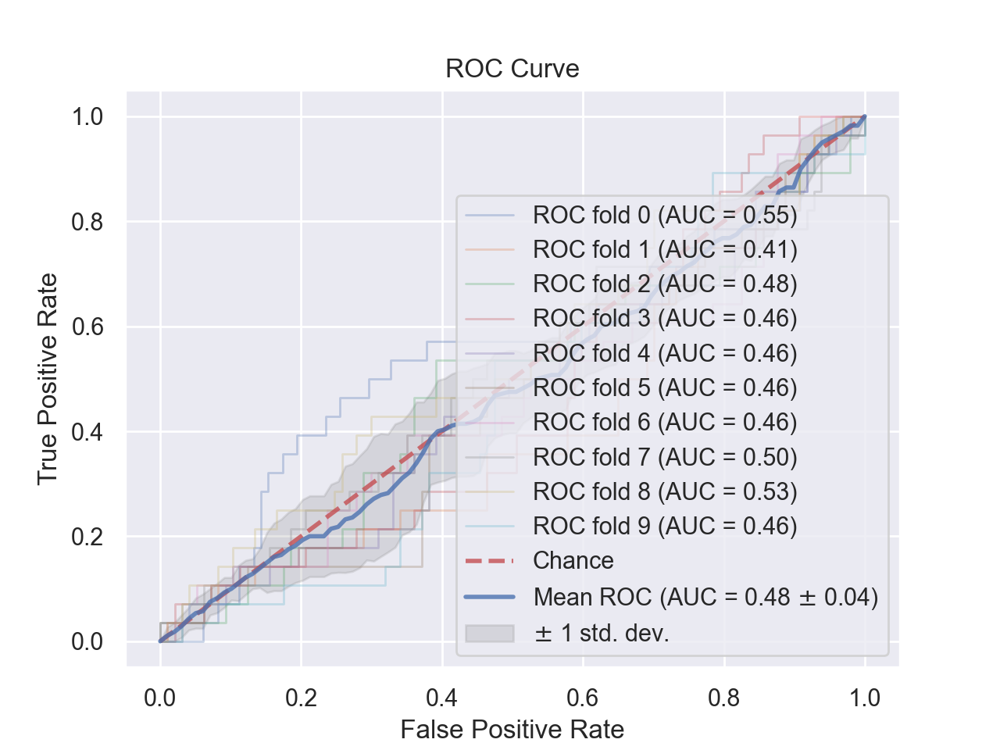

In [89]:
# Call function to draw ROC curve for gnb 
draw_roc_curve_cross_validation(classifier=gpc, X=X, y=y, cat_features=cat_features, num_features=num_features, k_fold=10)

# Confusion matrix with n_10 splits StratifiedKFold GPC

Confusion matrices of Decision Tree:
Iteration  1 :


<IPython.core.display.Javascript object>


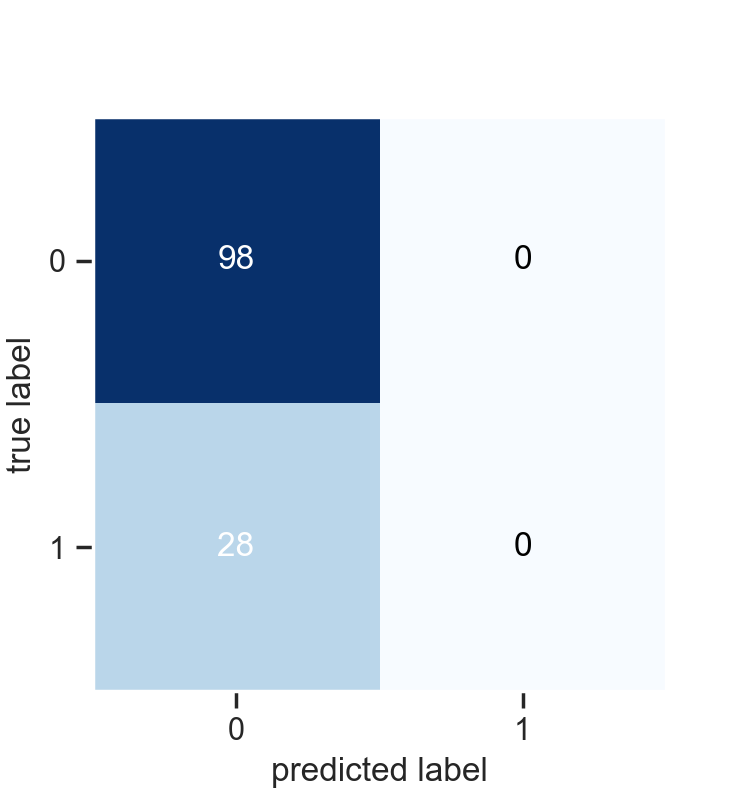

Iteration  2 :


<IPython.core.display.Javascript object>


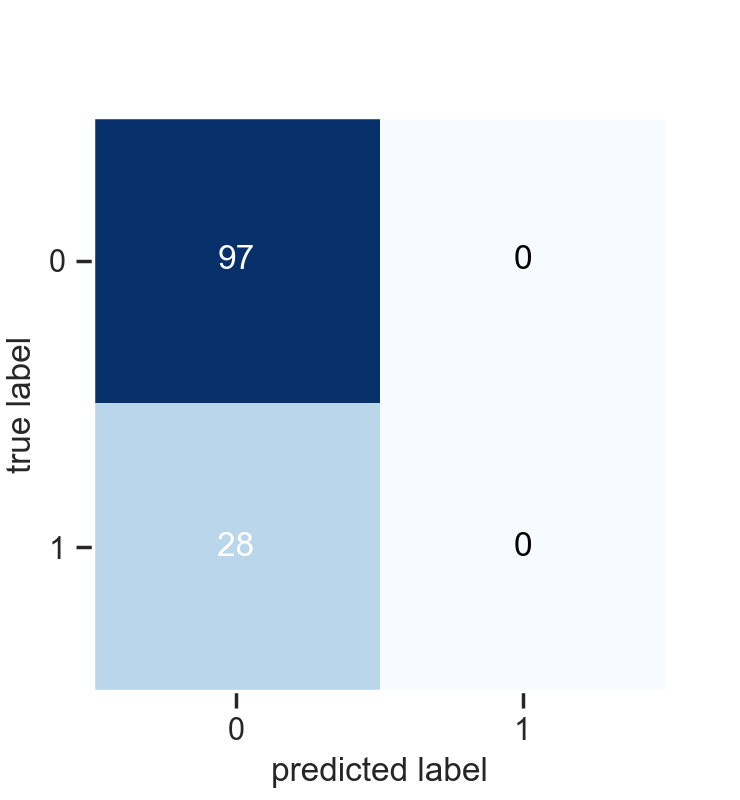

Iteration  3 :


<IPython.core.display.Javascript object>


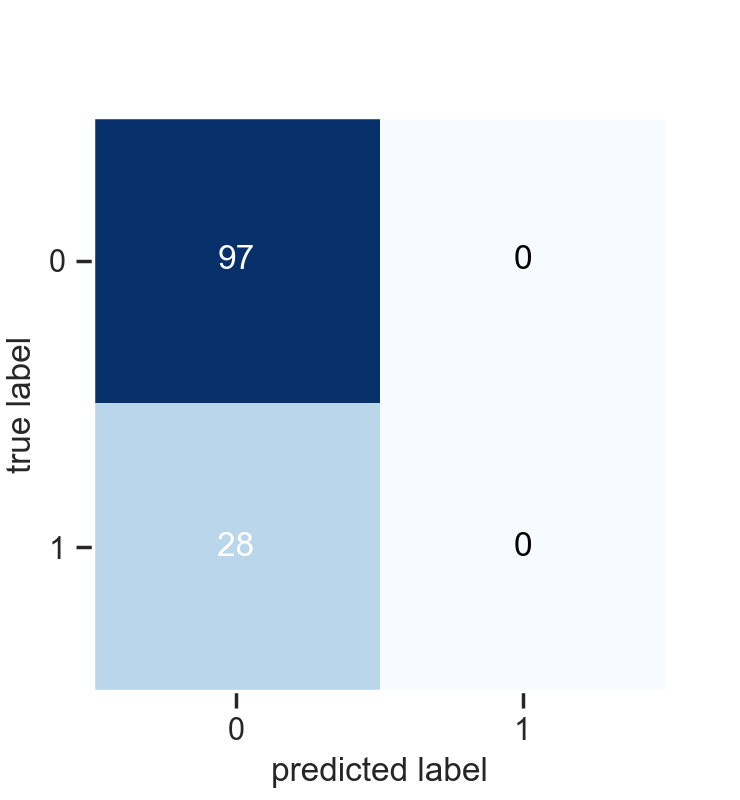

Iteration  4 :


<IPython.core.display.Javascript object>


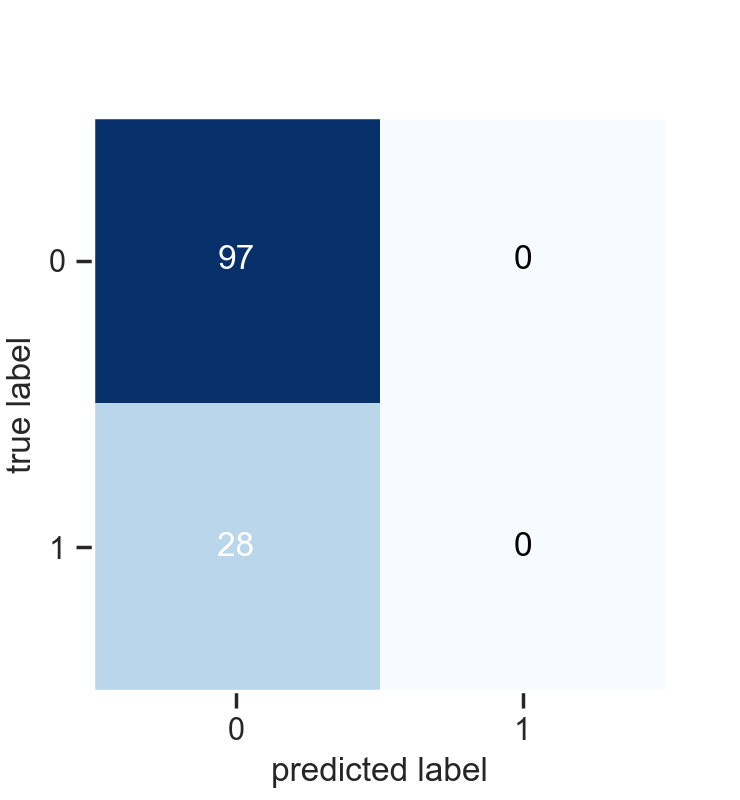

Iteration  5 :


<IPython.core.display.Javascript object>


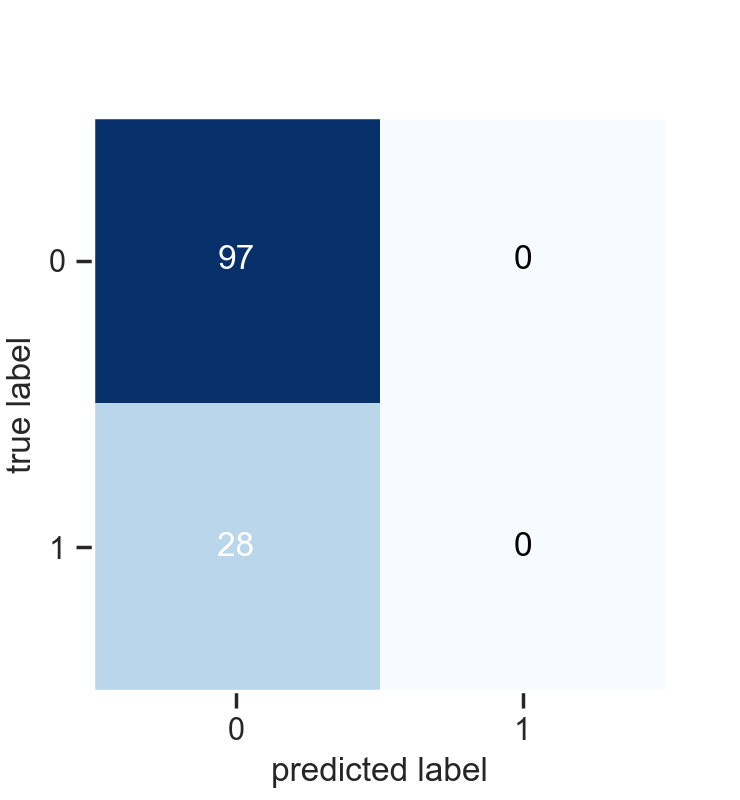

Iteration  6 :


<IPython.core.display.Javascript object>


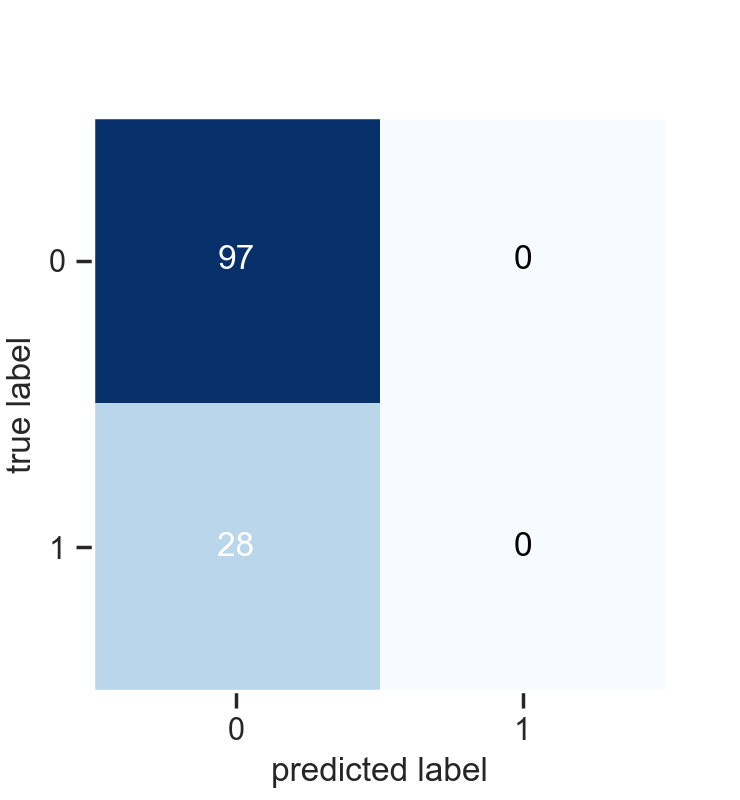

Iteration  7 :


<IPython.core.display.Javascript object>


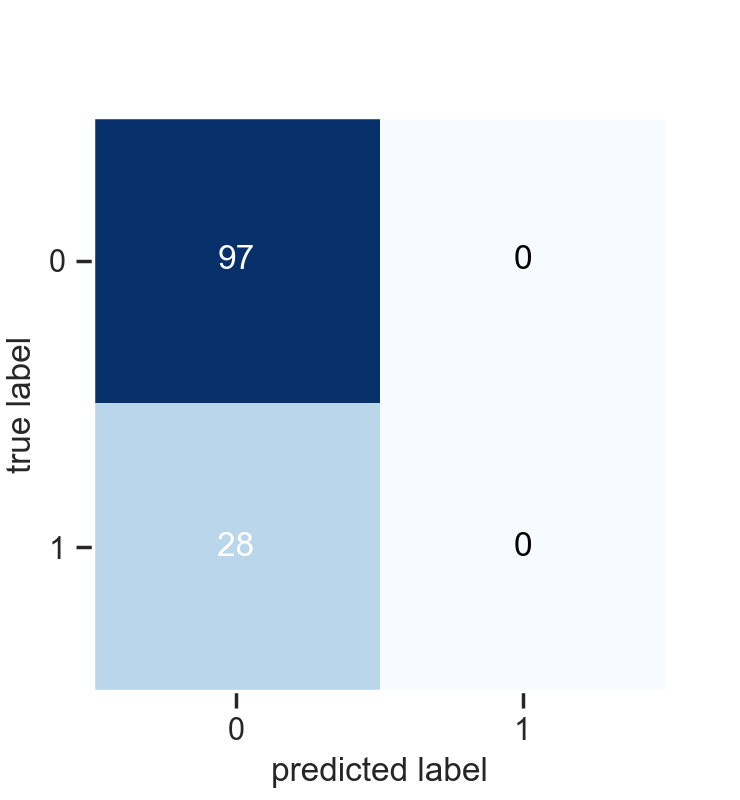

Iteration  8 :


<IPython.core.display.Javascript object>


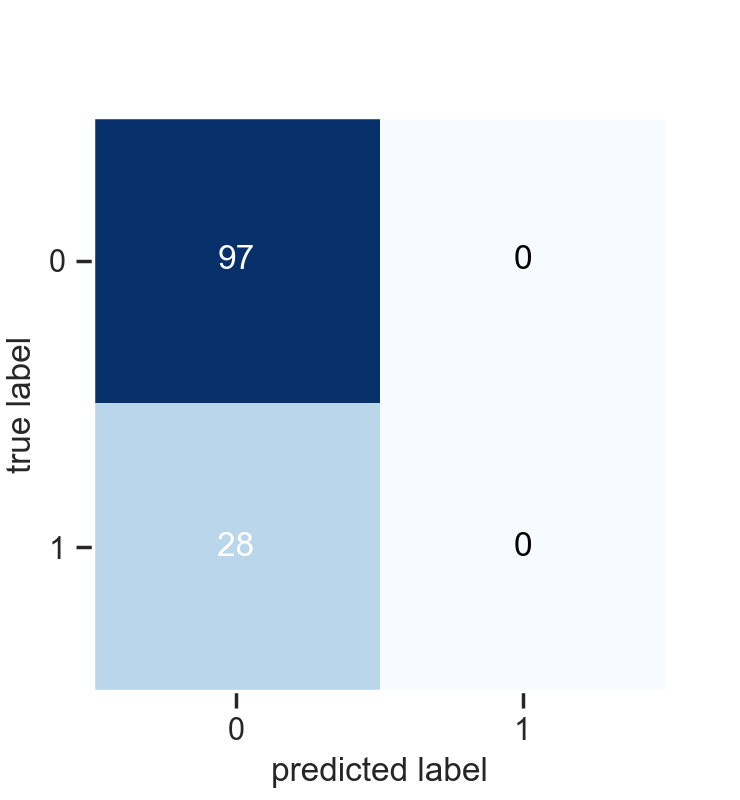

Iteration  9 :


<IPython.core.display.Javascript object>


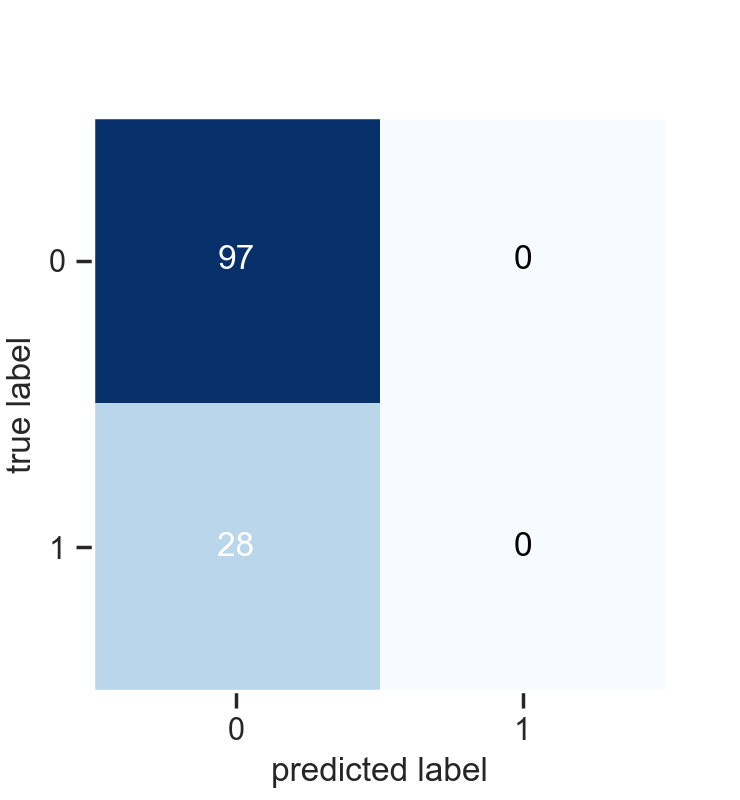

Iteration  10 :


<IPython.core.display.Javascript object>


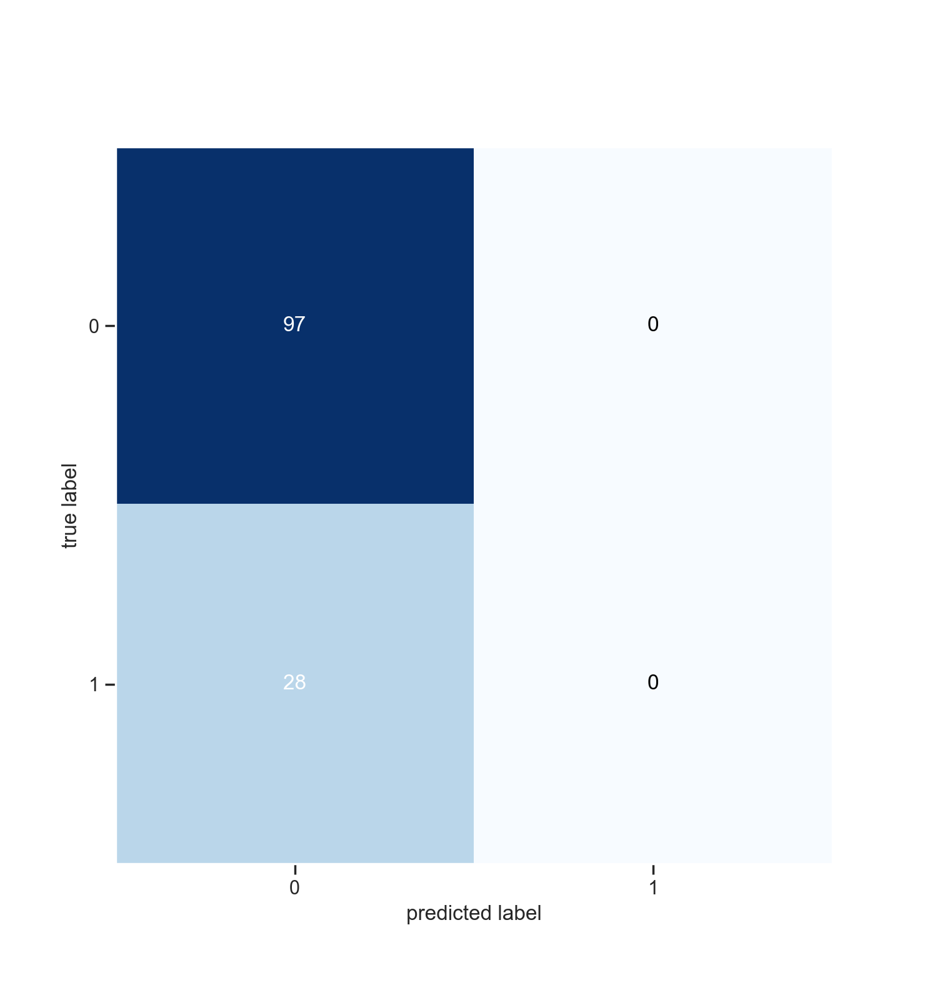

In [90]:
print("Confusion matrices of gpc:")
show_confusion_matrix(gpc, X, y, True, num_features)

# Support Vector Machine and Scoring 

In [ ]:
# SVM
svm_classifier = SVC(C=1, kernel='linear')
avg_acc_svc, min_acc_svc, max_acc_svc, avg_f1_svc, min_f1_svc, max_f1_svc = model_training_and_evaluation(svm_classifier, X, y, True, num_features, cat_features)

In [ ]:
# Display result:
print("SVM classifier with 10-fold cross-validation:")
print("Average accuracy = ", avg_acc_svc)
print("Min accuracy = ", min_acc_svc)
print("Max accuracy = ", max_acc_svc)
print("Average F1 = ", avg_f1_svc)
print("Min F1 = ", min_f1_svc)
print("Max F1 = ", max_f1_svc)

# ROC Curve SVM

In [ ]:
# Call function to draw ROC curve for svm 
draw_roc_curve_cross_validation(classifier=svm_classifier, X=X, y=y, cat_features=cat_features, num_features=num_features, k_fold=10)

# Confusion matrix with n_10 splits StratifiedKFold SVM

In [ ]:
print("Confusion matrices of SVM_Classifier:")
show_confusion_matrix(gnb, X, y, True, num_features)

# MLP and Scoring 

In [84]:
# Multi-layer perceptron
mlp = MLPClassifier(max_iter=500, hidden_layer_sizes=(30, 10)) # two hidden layers with 50 and 10 neurons
avg_acc_mlp, min_acc_mlp, max_acc_mlp, avg_f1_mlp, min_f1_mlp, max_f1_mlp = model_training_and_evaluation(mlp, X, y, True, num_features, cat_features)

In [85]:
# MLP result:
print("Multi-layer perceptron classifier with 10-fold cross-validation:")
print("Average accuracy = ", avg_acc_mlp)
print("Min accuracy = ", min_acc_mlp)
print("Max accuracy = ", max_acc_mlp)
print("Average F1 = ", avg_f1_mlp)
print("Min F1 = ", min_f1_mlp)
print("Max F1 = ", max_f1_mlp)

Multi-layer perceptron classifier with 10-fold cross-validation:
Average accuracy =  0.9568380952380953
Min accuracy =  0.952
Max accuracy =  0.96
Average F1 =  0.0
Min F1 =  0.0
Max F1 =  0.0


# ROC Curve MLP

<IPython.core.display.Javascript object>


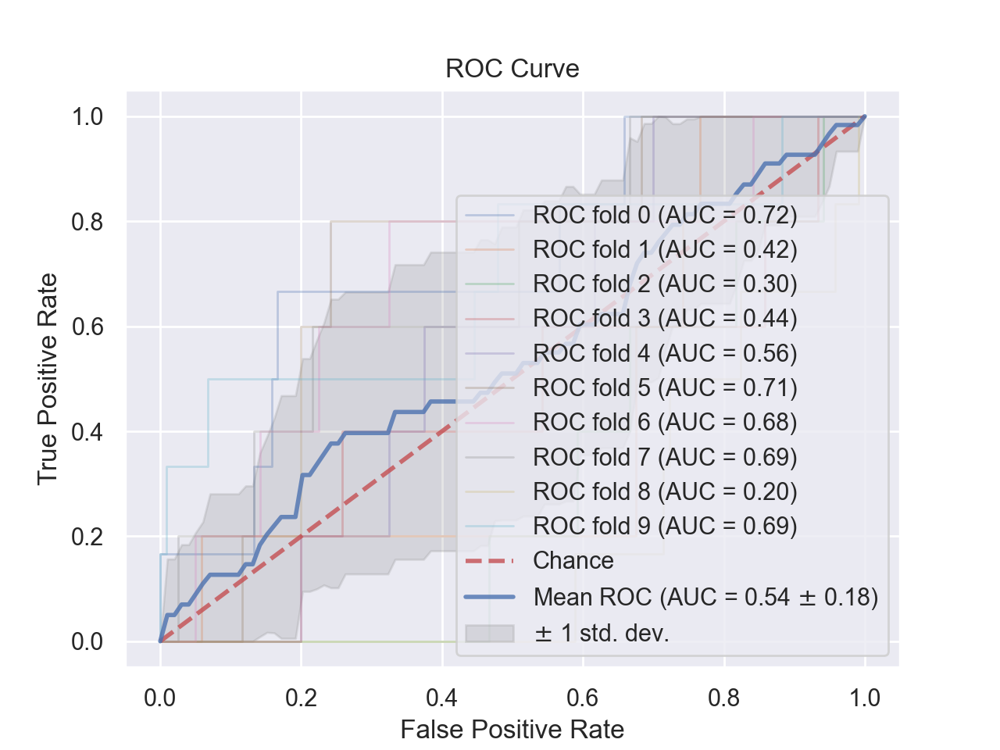

In [86]:
# Call function to draw ROC curve for MLP
draw_roc_curve_cross_validation(classifier=mlp, X=X, y=y, cat_features=cat_features, num_features=num_features, k_fold=10)

# Confusion matrix with n_10 splits StratifiedKFold MLP

Confusion matrices of Multi-layer perceptron:
Iteration  1 :


<IPython.core.display.Javascript object>


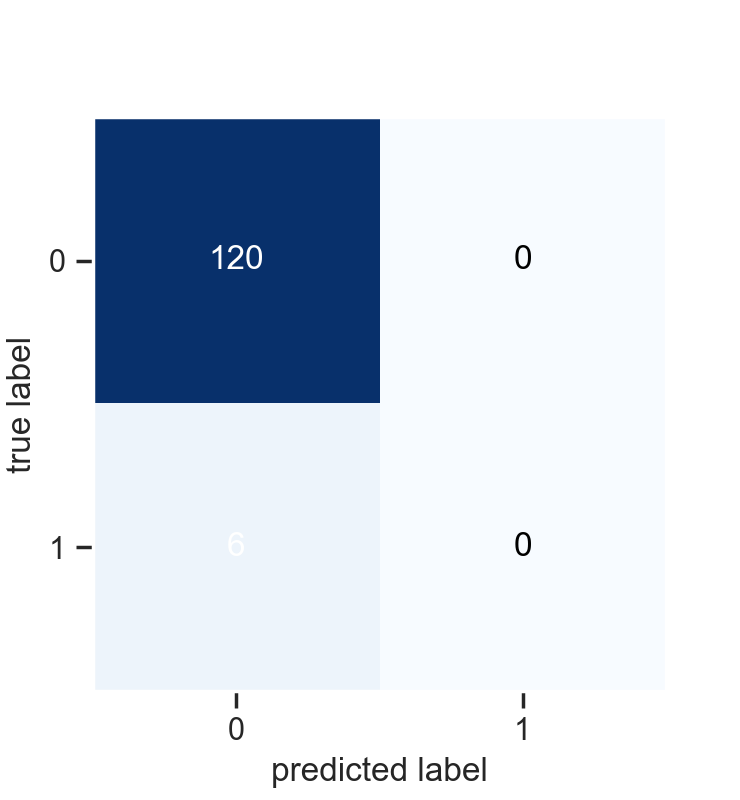

Iteration  2 :


<IPython.core.display.Javascript object>


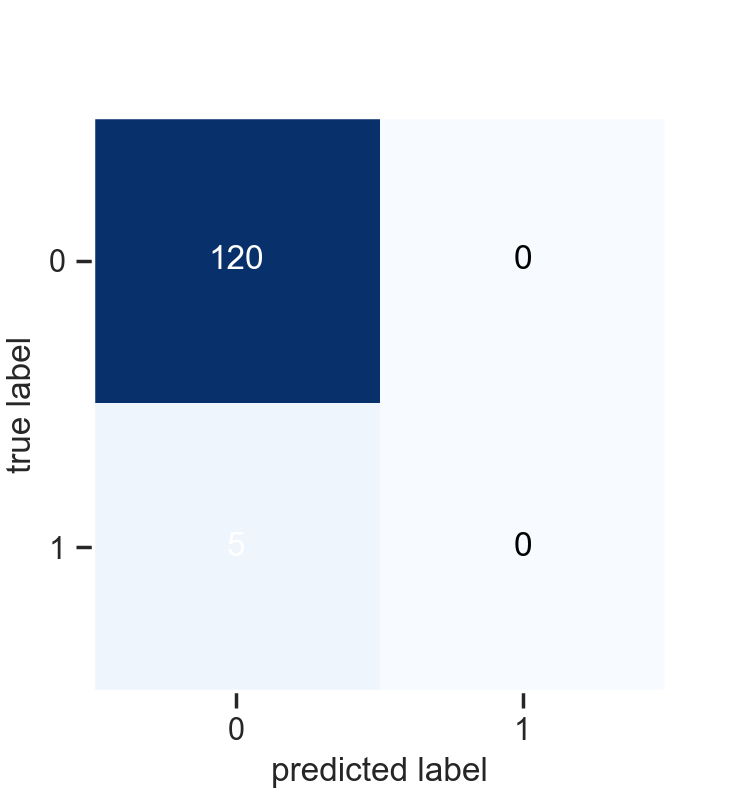

Iteration  3 :


<IPython.core.display.Javascript object>


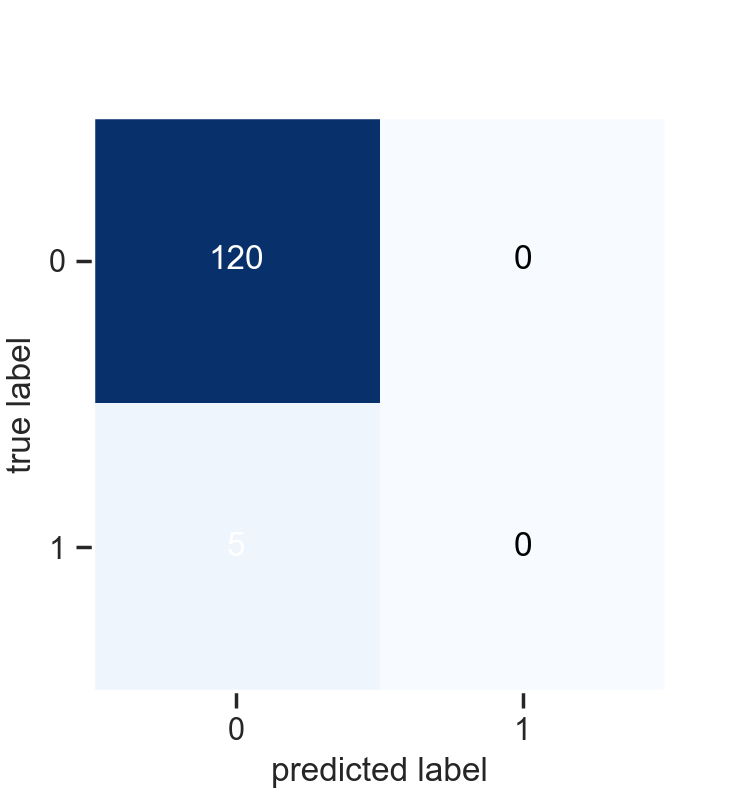

Iteration  4 :


<IPython.core.display.Javascript object>


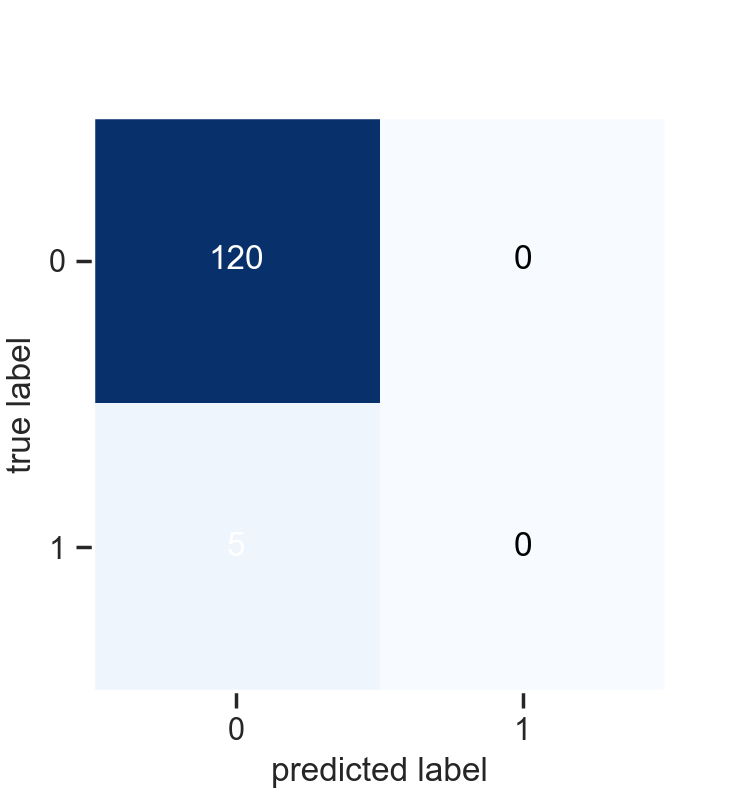

Iteration  5 :


<IPython.core.display.Javascript object>


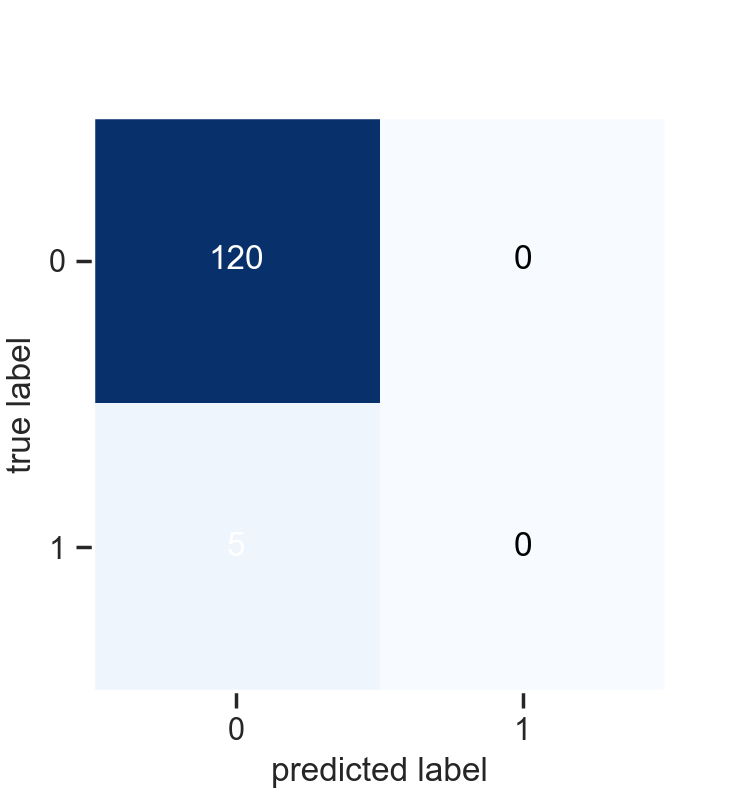

Iteration  6 :


<IPython.core.display.Javascript object>


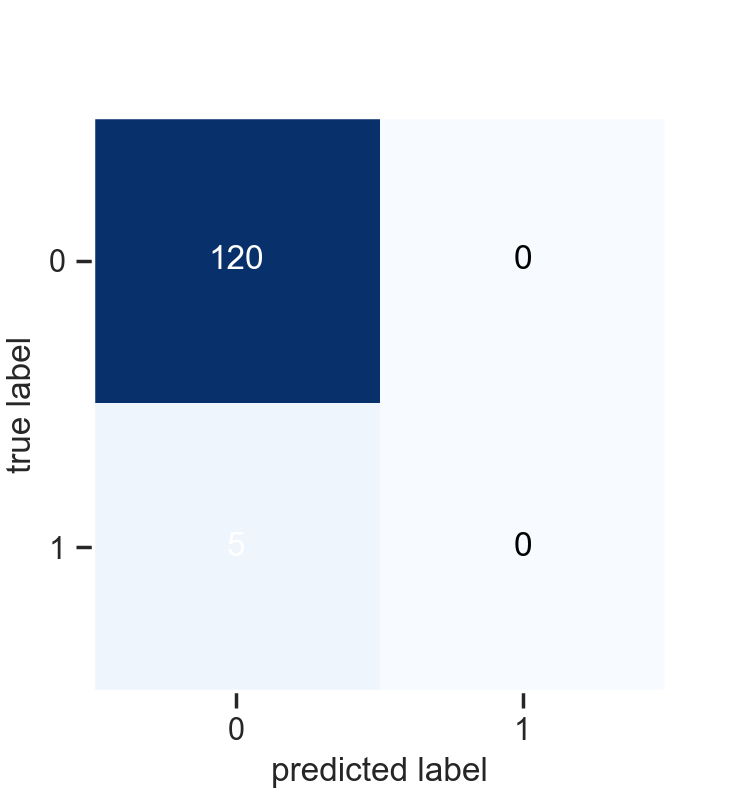

Iteration  7 :


<IPython.core.display.Javascript object>


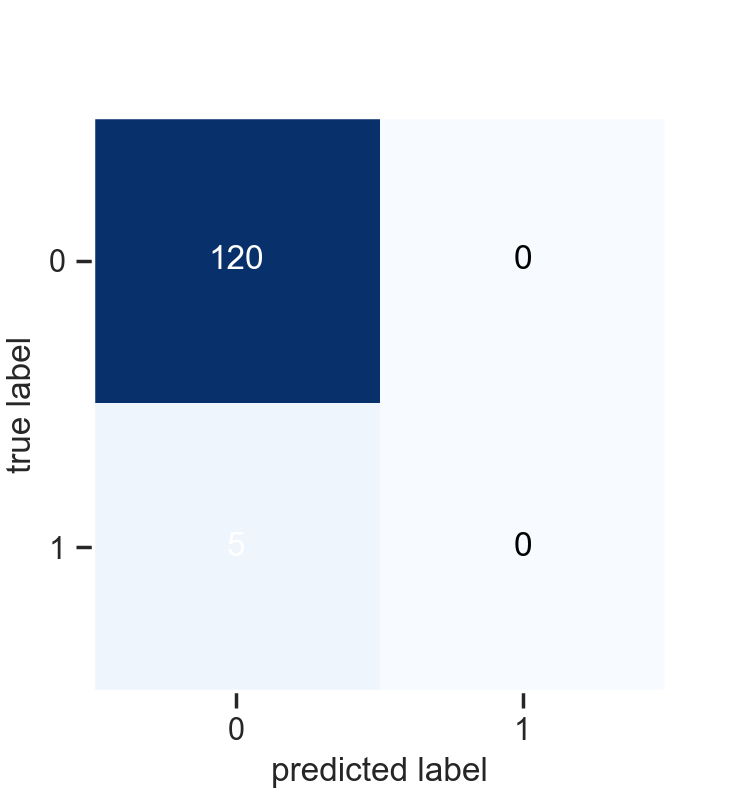

Iteration  8 :


<IPython.core.display.Javascript object>


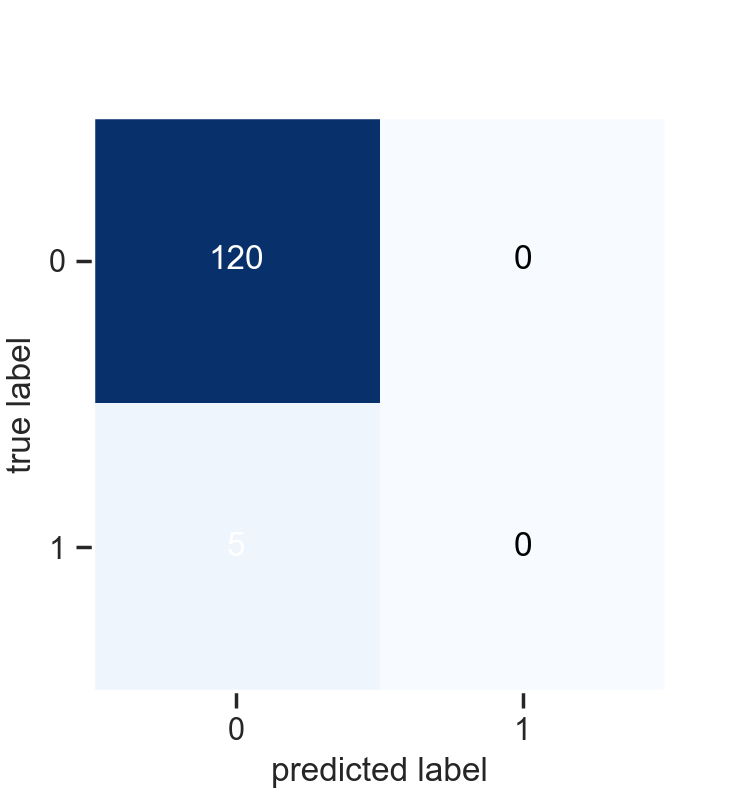

Iteration  9 :


<IPython.core.display.Javascript object>


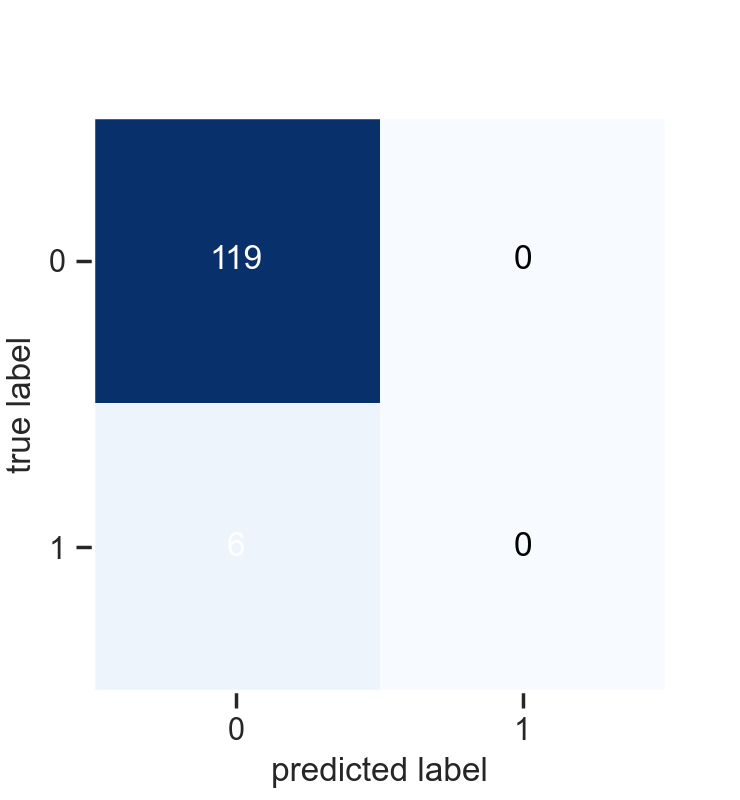

Iteration  10 :


<IPython.core.display.Javascript object>


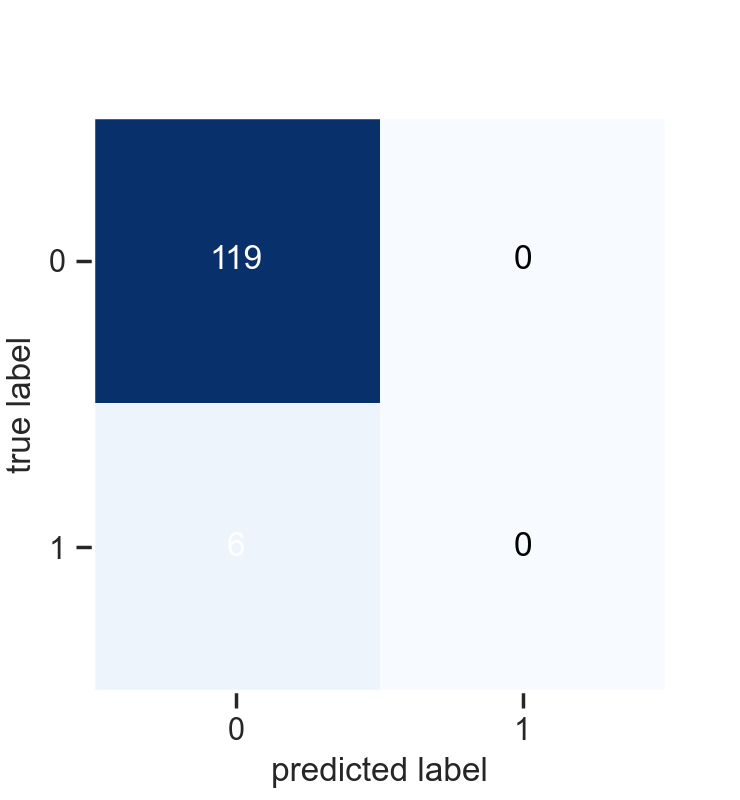

In [87]:
print("Confusion matrices of Multi-layer perceptron:")
show_confusion_matrix(mlp, X, y, True, num_features)

# Linear Discriminant Analysis and Scoring

In [88]:
# Linear Discriminant Analysis
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
lda = LinearDiscriminantAnalysis()
avg_acc_lda, min_acc_lda, max_acc_lda, avg_f1_lda, min_f1_lda, max_f1_lda = model_training_and_evaluation(lda, X, y, True, num_features, cat_features)

In [89]:
# Linear Discriminant Analysis result:
print("Linear Discriminant Analysis classifier with 10-fold cross-validation:")
print("Average accuracy = ", avg_acc_lda)
print("Min accuracy = ", min_acc_lda)
print("Max accuracy = ", max_acc_lda)
print("Average F1 = ", avg_f1_lda)
print("Min F1 = ", min_f1_lda)
print("Max F1 = ", max_f1_lda)

Linear Discriminant Analysis classifier with 10-fold cross-validation:
Average accuracy =  0.9560380952380951
Min accuracy =  0.952
Max accuracy =  0.96
Average F1 =  0.0
Min F1 =  0.0
Max F1 =  0.0


# ROC Curve LDA

In [90]:
# Call function to draw ROC curve for lda 
draw_roc_curve_cross_validation(classifier=lda, X=X, y=y, cat_features=cat_features, num_features=num_features, k_fold=10)

<IPython.core.display.Javascript object>

# Confusion matrix with n_10 splits StratifiedKFold LDA

Confusion matrices of Linear Discriminant Analysis:
Iteration  1 :


<IPython.core.display.Javascript object>


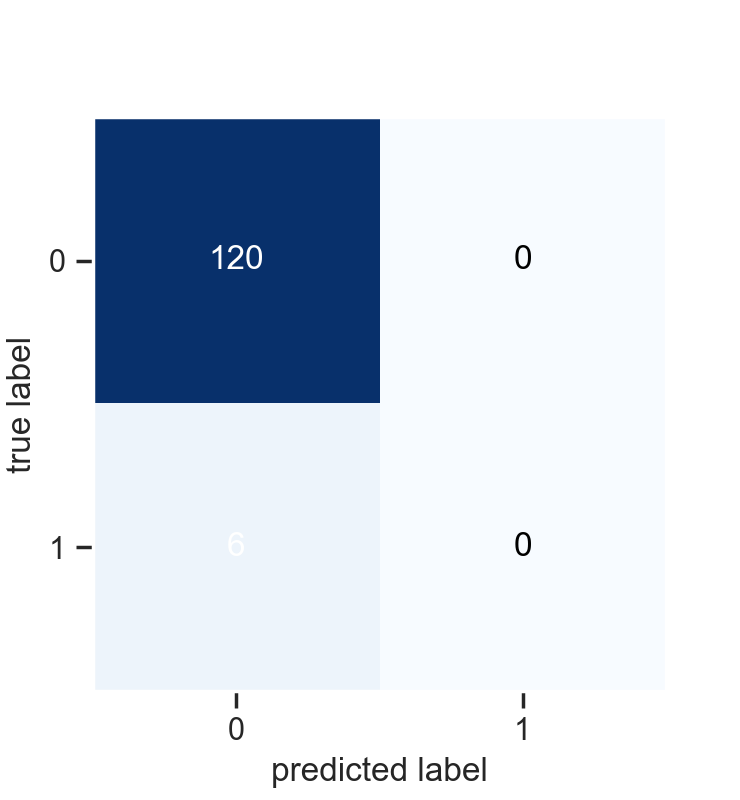

Iteration  2 :


<IPython.core.display.Javascript object>

Iteration  3 :


<IPython.core.display.Javascript object>


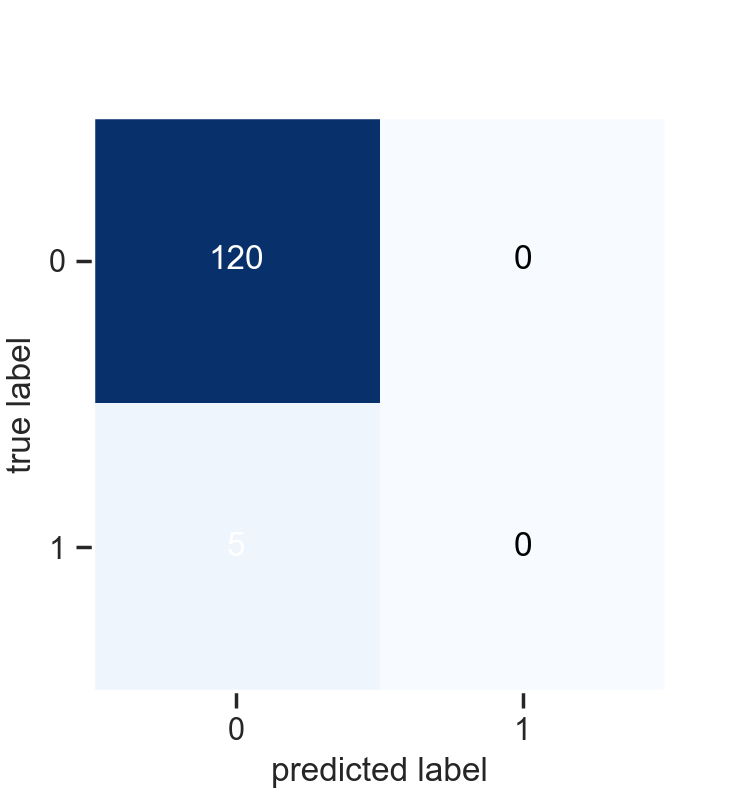

Iteration  4 :


<IPython.core.display.Javascript object>

Iteration  5 :


<IPython.core.display.Javascript object>

Iteration  6 :


<IPython.core.display.Javascript object>


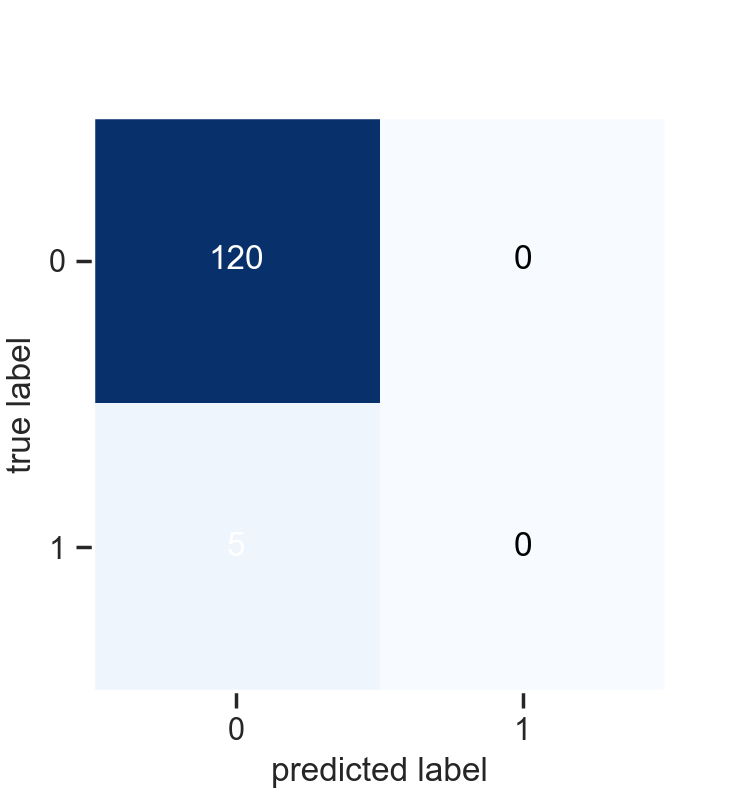

Iteration  7 :


<IPython.core.display.Javascript object>

Iteration  8 :


<IPython.core.display.Javascript object>

Iteration  9 :


<IPython.core.display.Javascript object>

Iteration  10 :


<IPython.core.display.Javascript object>

In [91]:
print("Confusion matrices of Linear Discriminant Analysis:")
show_confusion_matrix(lda, X, y, True, num_features)

# Feature extraction XGBOOST: VIPN-Free Survival (class set to 0)

In [32]:
xg_boost_features =  xg_classifier.feature_importances_
###sort indices
indices = np.argsort(xg_boost_features)
##retrieving feature names
features = list(df.columns.values)

In [33]:
##checking
print(len(indices))
print(df.columns[0])
print(indices)
print(df.columns)

16
STUDY
[ 9 13  3 12 10  7  0  5  4 11 14  6  8  1 15  2]
Index(['STUDY', 'AGE AT DX (MONTHS)', 'SEX', 'FINAL RISK GROUP',
       'CREATININE at DIAGNOSIS (UMOL/L)', 'PEAK URATE (MMOL/L)',
       'BILIRUBIN AT DX (UM/L)', 'GGT AT DX', 'PEAK CREATININE PROTOCOL 1',
       'PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN?', 'LOWEST ALBUMIN PROTOCOL 1',
       'PEAK GGT PROTOCOL 1 > 5 X ULN?', 'PEAK ALT PROTOCOL 1',
       'FUNGAL INFECTION ', 'WHITE CELL COUNT (X 10>9/L)', 'CYTOGENETICS',
       'VIPN'],
      dtype='object')


In [34]:
####retrieve the feature names based on the indices
features_1 = df.columns.values[indices]
print(features_1)
#### changing the order of indices
features_2 = features_1[::-1]
print(features_2)

['PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN?' 'FUNGAL INFECTION '
 'FINAL RISK GROUP' 'PEAK ALT PROTOCOL 1' 'LOWEST ALBUMIN PROTOCOL 1'
 'GGT AT DX' 'STUDY' 'PEAK URATE (MMOL/L)'
 'CREATININE at DIAGNOSIS (UMOL/L)' 'PEAK GGT PROTOCOL 1 > 5 X ULN?'
 'WHITE CELL COUNT (X 10>9/L)' 'BILIRUBIN AT DX (UM/L)'
 'PEAK CREATININE PROTOCOL 1' 'AGE AT DX (MONTHS)' 'CYTOGENETICS' 'SEX']
['SEX' 'CYTOGENETICS' 'AGE AT DX (MONTHS)' 'PEAK CREATININE PROTOCOL 1'
 'BILIRUBIN AT DX (UM/L)' 'WHITE CELL COUNT (X 10>9/L)'
 'PEAK GGT PROTOCOL 1 > 5 X ULN?' 'CREATININE at DIAGNOSIS (UMOL/L)'
 'PEAK URATE (MMOL/L)' 'STUDY' 'GGT AT DX' 'LOWEST ALBUMIN PROTOCOL 1'
 'PEAK ALT PROTOCOL 1' 'FINAL RISK GROUP' 'FUNGAL INFECTION '
 'PEAK BILIRUBIN PROTOCOL 1 > 3 x ULN?']


<IPython.core.display.Javascript object>


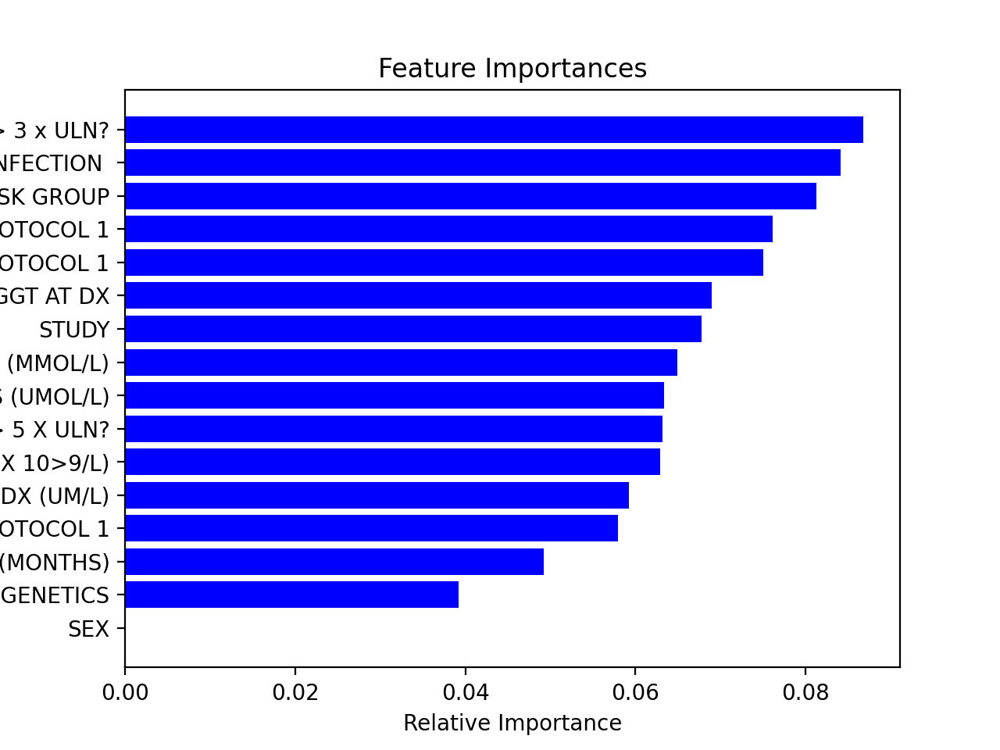

Text(0.5, 0, 'Relative Importance')

In [35]:
plt.figure()
plt.title('Feature Importances')
plt.barh(range(len(indices)), xg_boost_features[indices], color='b', align='center')
#plt.yticks(range(len(indices)), features[indices])
##Pooja
####
##Chnaging the features names
plt.yticks(range(len(indices)),features_2)
plt.xlabel('Relative Importance')

In [36]:
print(xg_classifier.feature_importances_)

[0.06321248 0.08126907 0.08674938 0.04921778 0.06495444 0.06338277
 0.07497245 0.06286006 0.0761496  0.         0.05925721 0.06780779
 0.05795436 0.03922053 0.06891312 0.08407891]
